# ENHANCING CUSTOMER PURCHASE PREDICTION IN E-COMMERCE:
# A COMPARATIVE STUDY OF DEEP LEARNING WITH LSTM NETWORKS AND MACHINE LEARNING TECHNIQUES 
(USING WORD2VEC EMBEDDINGS AND TIME SEQUENCES)

This project is based on Ecommerce data from AlibabaCloud. This dataset contains various features related to user purchase history on an online shopping website, such as invoice date and time, quantity and unit price. The second supporting dataset consists of the list of the users who made a purchase in the next (13th month).

The dataset consists of 389,168 rows indicating the quantity and price of different units bought by customers. The dataset was formed so that each item purchased is displayed in a separate row, indicating the customer ID, invoice data and time and other parameters. Customers may appear in the dataset multiple times depending on the purchases made in the chronological way. The data shows the purchases made between December 2010 and November 2011. The second dataset is the list of Customer IDs, who made a purchase in the December 2011, the following month of the data provided. The list consists of 686 unique customer IDs.

In [1]:
#import the packages
import matplotlib.pyplot as plt
import csv
import pandas as pd
import os
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
import seaborn as sns; sns.set()
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
%matplotlib inline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix

In [2]:
#Loading and preview the data set
df = pd.read_csv('ecommercedata.csv')
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/01/2010 8:26,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/01/2010 8:26,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/01/2010 8:26,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/01/2010 8:26,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/01/2010 8:26,3.39,17850,United Kingdom


## DATA STRUCTURE AND STATISTICAL ANALYSIS

Description of the columns:

- InvoiceNo - numeric - Unique identifier for each invoice, typically a sequence of numbers. Represents individual sales transactions.
- StockCode - alphanumeric - Code that identifies the product, consisting of numbers and potentially letters. This code is used to track and manage inventory items.
- Description - text - Detailed description of the product, providing information about the item’s name, features, and other relevant details.
- Quantity - numeric - The number of units of a particular product sold or purchased in the transaction. It represents the amount of stock involved in the invoice.
- InvoiceDate - date and time - The date and time when the invoice was generated. This column helps in tracking the timing of sales and purchases.
- UnitPrice - decimal numbers - The price of a single unit of the product. This is a numerical value that can include decimal places to represent fractions of a currency.
- CustomerID - numeric - Unique identifier for each customer, represented by a series of numbers. This helps in tracking and associating sales transactions with individual customers.
- Country - text - The name of the country where the customer is located. This provides geographical information about the customer base.

In [3]:
# Summary of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 389168 entries, 0 to 389167
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    389168 non-null  object 
 1   StockCode    389168 non-null  object 
 2   Description  389168 non-null  object 
 3   Quantity     389168 non-null  int64  
 4   InvoiceDate  389168 non-null  object 
 5   UnitPrice    389168 non-null  float64
 6   CustomerID   389168 non-null  int64  
 7   Country      389168 non-null  object 
dtypes: float64(1), int64(2), object(5)
memory usage: 23.8+ MB


In [4]:
#Checking the shape of the dataset
df.shape

(389168, 8)

In [5]:
# Descriptive statiscics (Sum, Average, Variance, minimum, 1st quartile, 2nd quartile, 3rd Quartile and Maximum)
df.describe()

,Quantity,UnitPrice,CustomerID
count,389168.000000,389168.000000,389168.000000
mean,12.084889,3.488779,15287.024473
std,175.692602,70.796324,1712.959478
min,-74215.000000,0.000000,12346.000000
25%,2.000000,1.250000,13952.000000
50%,5.000000,1.950000,15154.000000
75%,12.000000,3.750000,16788.000000
max,74215.000000,38970.000000,18287.000000


In [6]:
#Checking null values
df.isnull().sum()

InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64

In [7]:
#Checking data types
df.dtypes

InvoiceNo       object
StockCode       object
Description     object
Quantity         int64
InvoiceDate     object
UnitPrice      float64
CustomerID       int64
Country         object
dtype: object

In [8]:
#Count unique numbers in each column
df.nunique()

InvoiceNo      21269
StockCode       3676
Description     3878
Quantity         427
InvoiceDate    19636
UnitPrice        603
CustomerID      4331
Country           37
dtype: int64

In [9]:
#Show column names
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

In [10]:
# Checking unique values of categorical column
df['Country'].unique()

array(['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany',
       'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal',
       'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland',
       'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Austria',
       'Israel', 'Finland', 'Greece', 'Singapore', 'Lebanon',
       'United Arab Emirates', 'Saudi Arabia', 'Czech Republic', 'Canada',
       'Unspecified', 'Brazil', 'USA', 'European Community', 'Bahrain',
       'Malta', 'RSA'], dtype=object)

# Data cleansing and preprocessing 

In [11]:
#Cheking duplicates
df.duplicated().sum()

4946

In [12]:
# See duplicated data
duplicated_rows = df[df.duplicated()]
print(duplicated_rows)

       InvoiceNo StockCode                        Description  Quantity  \
517       536409     21866        UNION JACK FLAG LUGGAGE TAG         1   
527       536409     22866      HAND WARMER SCOTTY DOG DESIGN         1   
537       536409     22900     SET 2 TEA TOWELS I LOVE LONDON         1   
539       536409     22111       SCOTTIE DOG HOT WATER BOTTLE         1   
555       536412     22327  ROUND SNACK BOXES SET OF 4 SKULLS         1   
...          ...       ...                                ...       ...   
388222    579690     22952    60 CAKE CASES VINTAGE CHRISTMAS         1   
388360    579711     23378  PACK OF 12 50'S CHRISTMAS TISSUES         1   
388369    579711     23461              SWEETHEART BIRD HOUSE         1   
388370    579711    85049E          SCANDINAVIAN REDS RIBBONS         1   
388393    579711    84876B         GREEN HEART COMPACT MIRROR         1   

             InvoiceDate  UnitPrice  CustomerID         Country  
517     12/01/2010 11:45       1.

Duplicated data need to be removed because it can cause bias and affect the accuracy of the model and leads to inaccurate prediction

In [13]:
# Drop the duplicated values 
df.drop_duplicates(inplace=True)

In [14]:
# Convert 'InvoiceDate' to datetime
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

In [15]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom


### Label encoding

Use LabelEncoder from scikit-learn to convert categorical text data into numerical labels.

In [16]:
pip install pandas scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [17]:
# Import Libraries
import pandas as pd
from sklearn.preprocessing import LabelEncoder

In [18]:
# Initialize LabelEncoders
le_stockcode = LabelEncoder()

# Apply LabelEncoder to 'StockCode' and replace the original column
df['StockCode'] = le_stockcode.fit_transform(df['StockCode'])

print("\nDataFrame with Encoded Columns (Replaced Original Columns):")
print(df)


DataFrame with Encoded Columns (Replaced Original Columns):
       InvoiceNo  StockCode                          Description  Quantity  \
0         536365       3248   WHITE HANGING HEART T-LIGHT HOLDER         6   
1         536365       2648                  WHITE METAL LANTERN         6   
2         536365       2854       CREAM CUPID HEARTS COAT HANGER         8   
3         536365       2802  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4         536365       2801       RED WOOLLY HOTTIE WHITE HEART.         6   
...          ...        ...                                  ...       ...   
389163   C579886       1092                       POPCORN HOLDER        -1   
389164   C579886       1981       TRIPLE HOOK ANTIQUE IVORY ROSE        -1   
389165   C579887       3106         ANTIQUE SILVER T-LIGHT GLASS        -1   
389166   C579887       3197  15CM CHRISTMAS GLASS BALL 20 LIGHTS        -1   
389167   C579887       2300     T-LIGHT HOLDER HANGING LOVE BIRD        -3   

  

### Steps to Encode InvoiceNo with Special Handling for Cancellations 

To encode the InvoiceNo column where invoices can start with a letter indicating specific conditions (such as a cancellation), we will handle both the alphanumeric nature of the column and the semantic meaning associated with certain prefixes (e.g., C indicating cancellations). 

In [19]:
#First, identify which invoices are regular and which ones are special (e.g., cancellations)
# Create a new column to identify cancellation
df['IsCancelled'] = df['InvoiceNo'].apply(lambda x: 1 if str(x).startswith('C') else 0)

# Remove the 'C' from the invoice numbers
df['InvoiceNo'] = df['InvoiceNo'].apply(lambda x: str(x).replace('C', ''))

print(df)

       InvoiceNo  StockCode                          Description  Quantity  \
0         536365       3248   WHITE HANGING HEART T-LIGHT HOLDER         6   
1         536365       2648                  WHITE METAL LANTERN         6   
2         536365       2854       CREAM CUPID HEARTS COAT HANGER         8   
3         536365       2802  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4         536365       2801       RED WOOLLY HOTTIE WHITE HEART.         6   
...          ...        ...                                  ...       ...   
389163    579886       1092                       POPCORN HOLDER        -1   
389164    579886       1981       TRIPLE HOOK ANTIQUE IVORY ROSE        -1   
389165    579887       3106         ANTIQUE SILVER T-LIGHT GLASS        -1   
389166    579887       3197  15CM CHRISTMAS GLASS BALL 20 LIGHTS        -1   
389167    579887       2300     T-LIGHT HOLDER HANGING LOVE BIRD        -3   

               InvoiceDate  UnitPrice  CustomerID         Count

In [20]:
#Label encoding is suitable for transforming the cleaned invoice numbers into numeric form.
# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the 'InvoiceNo' column
df['InvoiceNo'] = label_encoder.fit_transform(df['InvoiceNo'])

print(df)

        InvoiceNo  StockCode                          Description  Quantity  \
0               0       3248   WHITE HANGING HEART T-LIGHT HOLDER         6   
1               0       2648                  WHITE METAL LANTERN         6   
2               0       2854       CREAM CUPID HEARTS COAT HANGER         8   
3               0       2802  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4               0       2801       RED WOOLLY HOTTIE WHITE HEART.         6   
...           ...        ...                                  ...       ...   
389163      21267       1092                       POPCORN HOLDER        -1   
389164      21267       1981       TRIPLE HOOK ANTIQUE IVORY ROSE        -1   
389165      21268       3106         ANTIQUE SILVER T-LIGHT GLASS        -1   
389166      21268       3197  15CM CHRISTMAS GLASS BALL 20 LIGHTS        -1   
389167      21268       2300     T-LIGHT HOLDER HANGING LOVE BIRD        -3   

               InvoiceDate  UnitPrice  CustomerID  

In [21]:
# Count of negative values in each column
negative_counts = (df['Quantity'] < 0).sum()
print("\nCount of negative values in each column:")
print(negative_counts)


Count of negative values in each column:
8516


In [22]:
# Count the number of 1s in the 'IsCancelled' column
cancelled_count = df['IsCancelled'].sum()
print(f"Number of cancelled transactions: {cancelled_count}")

Number of cancelled transactions: 8516


In [23]:
# Count the total number of rows
total_rows = len(df['IsCancelled'])
print(f"Total number of rows in 'iscancelled': {total_rows}")

Total number of rows in 'iscancelled': 384222


In [24]:
# Convert negative quantities to positive
df['Quantity'] = df['Quantity'].abs()

# Display the DataFrame to verify the changes
print(df)

        InvoiceNo  StockCode                          Description  Quantity  \
0               0       3248   WHITE HANGING HEART T-LIGHT HOLDER         6   
1               0       2648                  WHITE METAL LANTERN         6   
2               0       2854       CREAM CUPID HEARTS COAT HANGER         8   
3               0       2802  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4               0       2801       RED WOOLLY HOTTIE WHITE HEART.         6   
...           ...        ...                                  ...       ...   
389163      21267       1092                       POPCORN HOLDER         1   
389164      21267       1981       TRIPLE HOOK ANTIQUE IVORY ROSE         1   
389165      21268       3106         ANTIQUE SILVER T-LIGHT GLASS         1   
389166      21268       3197  15CM CHRISTMAS GLASS BALL 20 LIGHTS         1   
389167      21268       2300     T-LIGHT HOLDER HANGING LOVE BIRD         3   

               InvoiceDate  UnitPrice  CustomerID  

In [25]:
#Checking data types
df.dtypes

InvoiceNo               int32
StockCode               int32
Description            object
Quantity                int64
InvoiceDate    datetime64[ns]
UnitPrice             float64
CustomerID              int64
Country                object
IsCancelled             int64
dtype: object

### Calculate the Proportion of Cancellations

In [26]:
total_rows = 384222
num_cancellations = 8516
num_purchases = total_rows - num_cancellations

# Proportions
cancellation_proportion = num_cancellations / total_rows
purchase_proportion = num_purchases / total_rows

print(f"Proportion of cancellations: {cancellation_proportion:.4f}")
print(f"Proportion of purchases: {purchase_proportion:.4f}")

Proportion of cancellations: 0.0222
Proportion of purchases: 0.9778


Given that the proportion of cancellations is 0.0222 and the proportion of purchases is 0.9778, it is evident that the dataset is highly imbalanced, with purchases being the dominant class. This imbalance can significantly affect the predictive model, leading to poor performance if not handled correctly.

As cancellations are extremely rare, we will perform the exploratory data analysis (EDA) to understand if cancellations have any indirect impact on purchases and then decide how to address the imbalance in the dataset.

### Aggregate Transactions

Combine the purchase and cancellation information into a single record to represent the complete lifecycle of that transaction. This approach helps in understanding the transaction as a whole.

In [27]:
# Create a unique transaction ID
df['TransactionID'] = df.groupby('InvoiceNo').ngroup()

# Aggregate transaction data
df_aggregated = df.groupby('TransactionID').agg({
    'InvoiceDate': 'first',
    'Quantity': 'sum',  # Total quantity for the transaction
    'UnitPrice': 'mean',  # Average price for the transaction
    'IsCancelled': 'max',  # If any item in the transaction was cancelled
    'CustomerID': 'first',
    'Country': 'first'
}).reset_index()

In [28]:
print(df_aggregated)

       TransactionID         InvoiceDate  Quantity  UnitPrice  IsCancelled  \
0                  0 2010-12-01 08:26:00        40   3.910000            0   
1                  1 2010-12-01 08:28:00        12   1.850000            0   
2                  2 2010-12-01 08:34:00        83   4.853333            0   
3                  3 2010-12-01 08:34:00        15   4.775000            0   
4                  4 2010-12-01 08:35:00         3   5.950000            0   
...              ...                 ...       ...        ...          ...   
21264          21264 2011-11-30 17:32:00         5   3.350000            1   
21265          21265 2011-11-30 17:34:00         1  20.530000            1   
21266          21266 2011-11-30 17:37:00       572   3.068639            0   
21267          21267 2011-11-30 17:39:00        17   4.230833            1   
21268          21268 2011-11-30 17:42:00         5   4.316667            1   

       CustomerID         Country  
0           17850  United K

As the the cancelletion stands for the item, not the whole transaction, we will filter the dataset to only include records relevant, taking into account the extremely low (0.02) proportion of the cancelled items.

With the following experimentation we found ou that if we include the 'Qauntity' to the key, we will get non matching rows, which is a sign of cncellations to be partial, so the reduction of the ordered quantity of products.

In [29]:
# Convert relevant columns to string
df['InvoiceNo'] = df['InvoiceNo'].astype(str)
df['StockCode'] = df['StockCode'].astype(str)
df['Description'] = df['Description'].astype(str)
df['Quantity'] = df['Quantity'].astype(str)
df['CustomerID'] = df['CustomerID'].astype(str)

In [30]:
# Create a unique key for each transaction based on relevant columns
df['Key'] = df['Description']+ '_' + df['Quantity'].astype(str) + '_' + df['CustomerID'].astype(str)

# Find all keys where IsCancelled is 1
cancelled_keys = df[df['IsCancelled'] == 1]['Key'].unique()

# Mark rows to be deleted where IsCancelled is 0 but match cancelled keys
df['ToDelete'] = df['Key'].isin(cancelled_keys) & (df['IsCancelled'] == 0)

# Check if rows are correctly marked for deletion
print("Rows marked for deletion:")
print(df[df['ToDelete']])

Rows marked for deletion:
       InvoiceNo StockCode                         Description Quantity  \
55             8       340      VINTAGE BILLBOARD DRINK ME MUG        6   
57             8      2776  WOOD 2 DRAWER CABINET WHITE FINISH        2   
72            10       340      VINTAGE BILLBOARD DRINK ME MUG        6   
74            10      2776  WOOD 2 DRAWER CABINET WHITE FINISH        2   
138           16      1631                  GLASS CLOCHE SMALL        3   
...          ...       ...                                 ...      ...   
388081     21190      1838        SET OF 4 PANTRY JELLY MOULDS       12   
388175     21200       892              JUMBO STORAGE BAG SUKI        1   
388190     21200      2004            CLASSIC GLASS COOKIE JAR        1   
388625     21225      3669                            CARRIAGE        1   
388822     21247      1420         WOODEN SCHOOL COLOURING SET       12   

               InvoiceDate  UnitPrice CustomerID         Country  IsCance

In [31]:
# Filter out rows to be deleted
df_cleaned = df[~df['ToDelete']]

# Drop auxiliary columns
df_cleaned = df_cleaned.drop(['Key', 'ToDelete'], axis=1)

# Save the cleaned dataset
df_cleaned.to_csv('cleaned_dataset.csv', index=False)

# Verify number of rows after cleaning
print(f"Number of rows after cleaning: {df_cleaned.shape[0]}")

Number of rows after cleaning: 379056


In [32]:
print(df_cleaned)

       InvoiceNo StockCode                          Description Quantity  \
0              0      3248   WHITE HANGING HEART T-LIGHT HOLDER        6   
1              0      2648                  WHITE METAL LANTERN        6   
2              0      2854       CREAM CUPID HEARTS COAT HANGER        8   
3              0      2802  KNITTED UNION FLAG HOT WATER BOTTLE        6   
4              0      2801       RED WOOLLY HOTTIE WHITE HEART.        6   
...          ...       ...                                  ...      ...   
389163     21267      1092                       POPCORN HOLDER        1   
389164     21267      1981       TRIPLE HOOK ANTIQUE IVORY ROSE        1   
389165     21268      3106         ANTIQUE SILVER T-LIGHT GLASS        1   
389166     21268      3197  15CM CHRISTMAS GLASS BALL 20 LIGHTS        1   
389167     21268      2300     T-LIGHT HOLDER HANGING LOVE BIRD        3   

               InvoiceDate  UnitPrice CustomerID         Country  IsCancelled  \
0     

In [33]:
# Count the number of rows where IsCancelled is 1
num_cancelled = df_cleaned[df_cleaned['IsCancelled'] == 1].shape[0]

print(f"Number of rows where IsCancelled is 1: {num_cancelled}")

Number of rows where IsCancelled is 1: 8516


In [34]:
# Check the number of unique keys for cancelled transactions
unique_cancelled_keys = df[df['IsCancelled'] == 1]['Key'].unique()
print(f"Number of unique keys for cancelled transactions: {len(unique_cancelled_keys)}")

Number of unique keys for cancelled transactions: 7985


In [35]:
# Check if all cancelled keys have corresponding non-cancelled rows
corresponding_non_cancelled_keys = df[df['IsCancelled'] == 0]['Key'].isin(unique_cancelled_keys)
print(f"Number of rows where corresponding non-cancelled keys found: {corresponding_non_cancelled_keys.sum()}")

Number of rows where corresponding non-cancelled keys found: 5166


Since there are fewer unique keys (7,985) than rows with IsCancelled = 1 (8,516), some keys are duplicated in the cancelled transactions. This might be causing fewer corresponding rows to be found with IsCancelled = 0.

Not every cancelled key may have a non-cancelled counterpart. This discrepancy means some rows that should be deleted are not identified because their corresponding non-cancelled rows are missing.

In [36]:
# Inspect Duplicates
duplicate_keys = df[df['IsCancelled'] == 1]['Key'].duplicated().sum()
print(f"Number of duplicate keys among cancelled transactions: {duplicate_keys}")

Number of duplicate keys among cancelled transactions: 531


In [37]:
#Check Missing Correspondence 
missing_correspondence_keys = set(cancelled_keys) - set(df[df['IsCancelled'] == 0]['Key'])
print(f"Number of cancelled keys with no non-cancelled correspondence: {len(missing_correspondence_keys)}")

Number of cancelled keys with no non-cancelled correspondence: 5041


In [38]:
#Review Deletion Logic
print(f"Number of rows to be deleted: {df['ToDelete'].sum()}")

Number of rows to be deleted: 5166


In [39]:
# Find all unique keys where IsCancelled is 1 (removing duplicates)
cancelled_keys = df[df['IsCancelled'] == 1]['Key'].drop_duplicates()

# Identify rows to be deleted where IsCancelled is 0 but match unique cancelled keys
df['ToDelete'] = df['Key'].isin(cancelled_keys) & (df['IsCancelled'] == 0)

# Print number of rows marked for deletion
print(f"Number of rows marked for deletion: {df['ToDelete'].sum()}")

Number of rows marked for deletion: 5166


In [40]:
# Filter out rows to be deleted
df_cleaned = df[~df['ToDelete']]

# Drop auxiliary columns
df_cleaned = df_cleaned.drop(['Key', 'ToDelete'], axis=1)

# Save the cleaned dataset
df_cleaned.to_csv('cleaned_dataset.csv', index=False)

# Verify number of rows after cleaning
print(f"Number of rows after cleaning: {df_cleaned.shape[0]}")

Number of rows after cleaning: 379056


In [41]:
# Filter out rows where IsCancelled is 1
df_cleaned = df[df['IsCancelled'] != 1]

# Save the cleaned dataset
df_cleaned.to_csv('cleaned_dataset.csv', index=False)

# Verify number of rows after cleaning
print(f"Number of rows after cleaning: {df_cleaned.shape[0]}")

Number of rows after cleaning: 375706


In [42]:
# Drop the IsCancelled column
df_cleaned = df_cleaned.drop(columns=['IsCancelled'])

In [43]:
# Drop the IsCancelled column
df_cleaned = df_cleaned.drop(columns=['ToDelete'])

In [44]:
# Drop the IsCancelled column
df_cleaned = df_cleaned.drop(columns=['Key'])

In [45]:
print(df_cleaned)

       InvoiceNo StockCode                          Description Quantity  \
0              0      3248   WHITE HANGING HEART T-LIGHT HOLDER        6   
1              0      2648                  WHITE METAL LANTERN        6   
2              0      2854       CREAM CUPID HEARTS COAT HANGER        8   
3              0      2802  KNITTED UNION FLAG HOT WATER BOTTLE        6   
4              0      2801       RED WOOLLY HOTTIE WHITE HEART.        6   
...          ...       ...                                  ...      ...   
389148     21266      3181          3 ROSE MORRIS BOXED CANDLES        4   
389149     21266       763           LARGE ROUND WICKER PLATTER        2   
389150     21266      1923                   RABBIT NIGHT LIGHT        6   
389151     21266       453          VICTORIAN SEWING BOX MEDIUM        1   
389152     21266       455           VICTORIAN SEWING BOX SMALL        1   

               InvoiceDate  UnitPrice CustomerID         Country  \
0      2010-12-01 0

In [46]:
# Update df to refer to the cleaned DataFrame
df = df_cleaned

## Feature Engineering

In [47]:
# Check for invalid or NaT values in InvoiceDate
invalid_dates = df[df['InvoiceDate'].isna()]
print("Number of rows with invalid dates:", len(invalid_dates))

Number of rows with invalid dates: 0


In [48]:
# Convert to datetime
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], errors='coerce')

# Check if any rows are left with NaT values after conversion
print("Number of rows with NaT after conversion:", df['InvoiceDate'].isna().sum())


Number of rows with NaT after conversion: 0


In [49]:
# Recompute day_of_week after cleaning
df['day_of_week'] = df['InvoiceDate'].dt.dayofweek

In [50]:
# Check value counts for day_of_week again
print(df['day_of_week'].value_counts().sort_index())


0    60902
1    63244
2    65908
3    74641
4    51682
6    59329
Name: day_of_week, dtype: int64


In [51]:
# extract the day of the week from the InvoiceDate column
df['day_of_week'] = df['InvoiceDate'].dt.dayofweek
print(df['day_of_week'].value_counts().sort_index())

0    60902
1    63244
2    65908
3    74641
4    51682
6    59329
Name: day_of_week, dtype: int64


The code above assigns the day of the week (0 for Monday through 6 for Sunday) to the day_of_week column. Our output indicates that transactions are missing for one of the days (in this case, Saturday, which is represented by 5).

In [52]:
# Check Data Range
print(df['InvoiceDate'].min())
print(df['InvoiceDate'].max())

2010-12-01 08:26:00
2011-11-30 17:37:00


#### Verify Day Counts for a Full Week

In [53]:
# Create a date range that covers the entire period
full_range = pd.date_range(start='2010-12-01', end='2011-11-30')

# Create a DataFrame to check the days of the week
check_df = pd.DataFrame({
    'InvoiceDate': full_range,
    'day_of_week': full_range.dayofweek
})

# Count occurrences of each day of the week
day_counts = check_df['day_of_week'].value_counts().sort_index()
print(day_counts)

0    52
1    52
2    53
3    52
4    52
5    52
6    52
Name: day_of_week, dtype: int64


In [54]:
#Compare Against our Data
# Get counts from your data
transaction_counts = df['day_of_week'].value_counts().sort_index()

# Print both for comparison
print("Counts from full date range:")
print(day_counts)

print("\nCounts from actual data:")
print(transaction_counts)

Counts from full date range:
0    52
1    52
2    53
3    52
4    52
5    52
6    52
Name: day_of_week, dtype: int64

Counts from actual data:
0    60902
1    63244
2    65908
3    74641
4    51682
6    59329
Name: day_of_week, dtype: int64


In [55]:
# Extract date and time features
df['day_of_month'] = df['InvoiceDate'].dt.day
df['month'] = df['InvoiceDate'].dt.month
df['year'] = df['InvoiceDate'].dt.year
df['hour'] = df['InvoiceDate'].dt.hour

# Check the result
print(df.head())

  InvoiceNo StockCode                          Description Quantity  \
0         0      3248   WHITE HANGING HEART T-LIGHT HOLDER        6   
1         0      2648                  WHITE METAL LANTERN        6   
2         0      2854       CREAM CUPID HEARTS COAT HANGER        8   
3         0      2802  KNITTED UNION FLAG HOT WATER BOTTLE        6   
4         0      2801       RED WOOLLY HOTTIE WHITE HEART.        6   

          InvoiceDate  UnitPrice CustomerID         Country  TransactionID  \
0 2010-12-01 08:26:00       2.55      17850  United Kingdom              0   
1 2010-12-01 08:26:00       3.39      17850  United Kingdom              0   
2 2010-12-01 08:26:00       2.75      17850  United Kingdom              0   
3 2010-12-01 08:26:00       3.39      17850  United Kingdom              0   
4 2010-12-01 08:26:00       3.39      17850  United Kingdom              0   

   day_of_week  day_of_month  month  year  hour  
0            2             1     12  2010     8  
1   

In [56]:
# Check unique values to confirm range
print(df['day_of_week'].unique())

[2 3 4 6 0 1]


In [57]:
print(df[['Quantity', 'UnitPrice']].dtypes)

Quantity      object
UnitPrice    float64
dtype: object


In [58]:
df['Quantity'] = pd.to_numeric(df['Quantity'], errors='coerce')
df['UnitPrice'] = pd.to_numeric(df['UnitPrice'], errors='coerce')

In [59]:
# Calculate total price per invoice line
df['total_price'] = df['Quantity'] * df['UnitPrice']

# Check the result
print(df.head())

  InvoiceNo StockCode                          Description  Quantity  \
0         0      3248   WHITE HANGING HEART T-LIGHT HOLDER         6   
1         0      2648                  WHITE METAL LANTERN         6   
2         0      2854       CREAM CUPID HEARTS COAT HANGER         8   
3         0      2802  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4         0      2801       RED WOOLLY HOTTIE WHITE HEART.         6   

          InvoiceDate  UnitPrice CustomerID         Country  TransactionID  \
0 2010-12-01 08:26:00       2.55      17850  United Kingdom              0   
1 2010-12-01 08:26:00       3.39      17850  United Kingdom              0   
2 2010-12-01 08:26:00       2.75      17850  United Kingdom              0   
3 2010-12-01 08:26:00       3.39      17850  United Kingdom              0   
4 2010-12-01 08:26:00       3.39      17850  United Kingdom              0   

   day_of_week  day_of_month  month  year  hour  total_price  
0            2             1     12

In [60]:
# Total quantity and unique products purchased by each customer
customer_features = df.groupby('CustomerID').agg({
    'Quantity': 'sum',
    'StockCode': 'nunique'
}).reset_index()

customer_features.columns = ['CustomerID', 'total_quantity', 'unique_products']

# Merge with original data
df = pd.merge(df, customer_features, on='CustomerID', how='left')

# Check the result
print(df.head())

  InvoiceNo StockCode                          Description  Quantity  \
0         0      3248   WHITE HANGING HEART T-LIGHT HOLDER         6   
1         0      2648                  WHITE METAL LANTERN         6   
2         0      2854       CREAM CUPID HEARTS COAT HANGER         8   
3         0      2802  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4         0      2801       RED WOOLLY HOTTIE WHITE HEART.         6   

          InvoiceDate  UnitPrice CustomerID         Country  TransactionID  \
0 2010-12-01 08:26:00       2.55      17850  United Kingdom              0   
1 2010-12-01 08:26:00       3.39      17850  United Kingdom              0   
2 2010-12-01 08:26:00       2.75      17850  United Kingdom              0   
3 2010-12-01 08:26:00       3.39      17850  United Kingdom              0   
4 2010-12-01 08:26:00       3.39      17850  United Kingdom              0   

   day_of_week  day_of_month  month  year  hour  total_price  total_quantity  \
0            2    

In [61]:
# Check if there are any negative values in the 'Quantity' column
negative_values = df[df['Quantity'] < 0]
print(f"Number of rows with negative 'total_price': {negative_values.shape[0]}")

Number of rows with negative 'total_price': 0


### Merge datasets

In [62]:
#Loading and preview the data set
dflabel = pd.read_csv('ecommercedata13.csv')
dflabel.head()

,CustomerID
0,12347
1,12358
2,12359
3,12362
4,12364


In [63]:
# Summary Statistics
print(dflabel.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 686 entries, 0 to 685
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   CustomerID  686 non-null    int64
dtypes: int64(1)
memory usage: 5.5 KB
None


In [64]:
#  ensure that the CustomerID values in dflabel actually exist in df
print("CustomerIDs in df:", df['CustomerID'].unique())
print("CustomerIDs in dflabel:", dflabel['CustomerID'].unique())

CustomerIDs in df: ['17850' '13047' '12583' ... '12966' '15060' '17911']
CustomerIDs in dflabel: [12347 12358 12359 12362 12364 12367 12375 12381 12417 12423 12433 12437
 12442 12462 12465 12471 12476 12478 12479 12490 12518 12523 12526 12536
 12553 12558 12560 12562 12569 12572 12583 12584 12587 12615 12621 12628
 12646 12650 12662 12664 12668 12673 12680 12682 12683 12684 12695 12700
 12704 12709 12713 12716 12719 12720 12723 12724 12747 12748 12749 12753
 12762 12766 12782 12783 12785 12820 12826 12827 12828 12839 12841 12856
 12877 12901 12912 12913 12919 12921 12925 12935 12950 12951 12952 12955
 12957 12962 12963 12967 12970 12971 12985 12989 12994 13001 13013 13014
 13017 13021 13026 13040 13069 13077 13078 13079 13081 13083 13089 13090
 13098 13102 13104 13109 13113 13115 13126 13153 13159 13171 13173 13183
 13199 13225 13230 13255 13263 13267 13269 13297 13298 13305 13309 13310
 13311 13314 13318 13319 13323 13352 13362 13365 13394 13404 13408 13410
 13417 13426 13435 13436 13

In [65]:
#Ensure the data types of CustomerID are consistent across both DataFrames
df['CustomerID'] = df['CustomerID'].astype(int)
dflabel['CustomerID'] = dflabel['CustomerID'].astype(int)

In [66]:
# Create a new column based on whether CustomerID is in dflabel
df['Target'] = df['CustomerID'].isin(dflabel['CustomerID']).astype(int)

print(df)

       InvoiceNo StockCode                          Description  Quantity  \
0              0      3248   WHITE HANGING HEART T-LIGHT HOLDER         6   
1              0      2648                  WHITE METAL LANTERN         6   
2              0      2854       CREAM CUPID HEARTS COAT HANGER         8   
3              0      2802  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4              0      2801       RED WOOLLY HOTTIE WHITE HEART.         6   
...          ...       ...                                  ...       ...   
375701     21266      3181          3 ROSE MORRIS BOXED CANDLES         4   
375702     21266       763           LARGE ROUND WICKER PLATTER         2   
375703     21266      1923                   RABBIT NIGHT LIGHT         6   
375704     21266       453          VICTORIAN SEWING BOX MEDIUM         1   
375705     21266       455           VICTORIAN SEWING BOX SMALL         1   

               InvoiceDate  UnitPrice  CustomerID         Country  \
0     

In [67]:
# Check the merged dataset
print(df.head())

  InvoiceNo StockCode                          Description  Quantity  \
0         0      3248   WHITE HANGING HEART T-LIGHT HOLDER         6   
1         0      2648                  WHITE METAL LANTERN         6   
2         0      2854       CREAM CUPID HEARTS COAT HANGER         8   
3         0      2802  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4         0      2801       RED WOOLLY HOTTIE WHITE HEART.         6   

          InvoiceDate  UnitPrice  CustomerID         Country  TransactionID  \
0 2010-12-01 08:26:00       2.55       17850  United Kingdom              0   
1 2010-12-01 08:26:00       3.39       17850  United Kingdom              0   
2 2010-12-01 08:26:00       2.75       17850  United Kingdom              0   
3 2010-12-01 08:26:00       3.39       17850  United Kingdom              0   
4 2010-12-01 08:26:00       3.39       17850  United Kingdom              0   

   day_of_week  day_of_month  month  year  hour  total_price  total_quantity  \
0           

In [68]:
# View unique values
print(df['Target'].unique())

[0 1]


# Exploratory Data Analysis

In [69]:
# Summary Statistics
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 375706 entries, 0 to 375705
Data columns (total 18 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   InvoiceNo        375706 non-null  object        
 1   StockCode        375706 non-null  object        
 2   Description      375706 non-null  object        
 3   Quantity         375706 non-null  int64         
 4   InvoiceDate      375706 non-null  datetime64[ns]
 5   UnitPrice        375706 non-null  float64       
 6   CustomerID       375706 non-null  int32         
 7   Country          375706 non-null  object        
 8   TransactionID    375706 non-null  int64         
 9   day_of_week      375706 non-null  int64         
 10  day_of_month     375706 non-null  int64         
 11  month            375706 non-null  int64         
 12  year             375706 non-null  int64         
 13  hour             375706 non-null  int64         
 14  total_price      375

In [70]:
# Missing Values
print("\nMissing Values:")
print(df.isnull().sum())


Missing Values:
InvoiceNo          0
StockCode          0
Description        0
Quantity           0
InvoiceDate        0
UnitPrice          0
CustomerID         0
Country            0
TransactionID      0
day_of_week        0
day_of_month       0
month              0
year               0
hour               0
total_price        0
total_quantity     0
unique_products    0
Target             0
dtype: int64


In [71]:
# Basic statistics
print(df.describe())

            Quantity      UnitPrice     CustomerID  TransactionID  \
count  375706.000000  375706.000000  375706.000000  375706.000000   
mean       12.986508       3.143313   15286.721514   11273.931590   
std       130.146384      22.574206    1713.046020    6215.203834   
min         1.000000       0.000000   12346.000000       0.000000   
25%         2.000000       1.250000   13952.000000    5821.000000   
50%         6.000000       1.950000   15152.000000   11713.000000   
75%        12.000000       3.750000   16788.000000   16778.000000   
max     74215.000000    8142.750000   18287.000000   21266.000000   

         day_of_week   day_of_month          month           year  \
count  375706.000000  375706.000000  375706.000000  375706.000000   
mean        2.612907      15.498443       7.402626    2010.931667   
std         1.927851       8.558769       3.357766       0.252316   
min         0.000000       1.000000       1.000000    2010.000000   
25%         1.000000       8.0000

## Correlation Analysis

In [72]:
# Drop non-numeric columns for correlation analysis
numeric_df = df.select_dtypes(include=['int64', 'float64', 'int32'])

In [73]:
# Calculate the correlation matrix
correlation_matrix = numeric_df.corr()

# Print the correlation matrix
print(correlation_matrix)

                 Quantity  UnitPrice  CustomerID  TransactionID  day_of_week  \
Quantity         1.000000  -0.006311   -0.010288      -0.006110    -0.011854   
UnitPrice       -0.006311   1.000000   -0.010714      -0.004288    -0.006599   
CustomerID      -0.010288  -0.010714    1.000000       0.000220     0.023567   
TransactionID   -0.006110  -0.004288    0.000220       1.000000     0.015136   
day_of_week     -0.011854  -0.006599    0.023567       0.015136     1.000000   
day_of_month    -0.000682  -0.002248   -0.001794       0.190663    -0.006286   
month           -0.007454  -0.004231    0.030713       0.649394     0.031624   
year             0.001811   0.000009   -0.036700       0.455838    -0.016672   
hour            -0.017979  -0.000598    0.064666       0.040516     0.043197   
total_price      0.832282   0.162156   -0.009951      -0.008734    -0.016865   
total_quantity   0.079538   0.002569   -0.063241      -0.007254    -0.055961   
unique_products -0.009488   0.002417   -

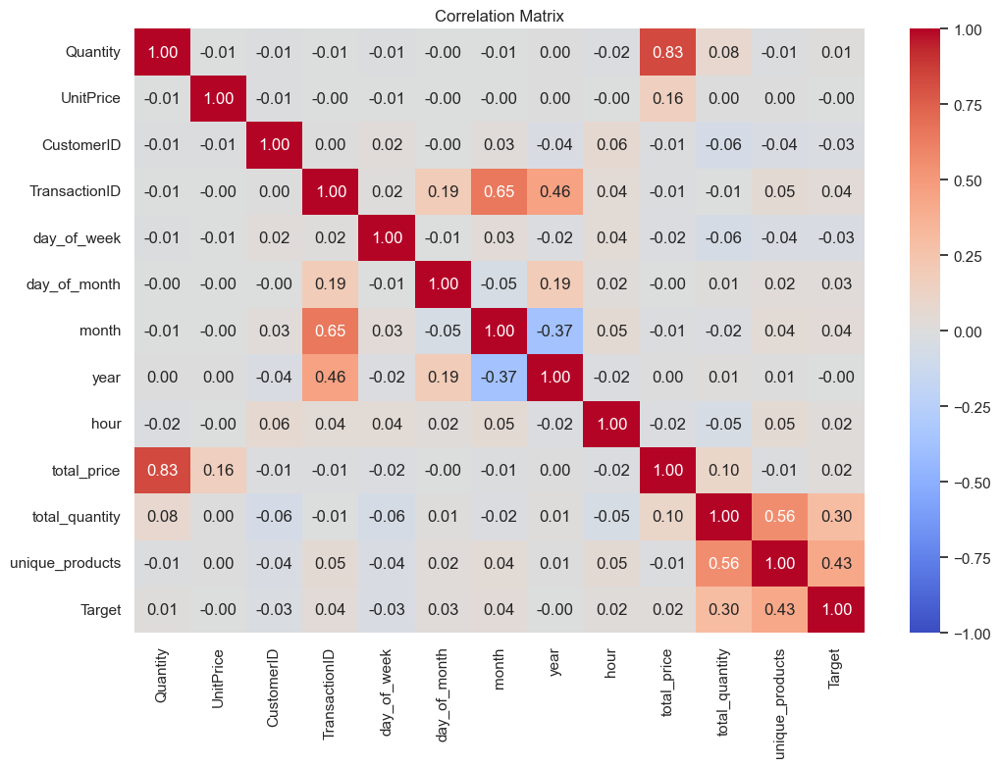

In [74]:
# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

The correlation analysis reveals several notable relationships between the features in the dataset:

1. Total Price and Quantity:

There is a strong positive correlation of 0.83 between Total Price and Quantity. This indicates that as the quantity of items purchased increases, the total price also tends to increase significantly, which is expected in a sales dataset.

2. Month, Year, and TransactionID:

Month and Year exhibit a significant correlation with TransactionID. This is intuitive, as transactions are likely to be grouped by specific months and years, reflecting the temporal nature of the transactions.

3. Correlation with Target (Purchase in the 13th Month):

The Target variable, which indicates whether a purchase was made in the 13th month, shows notable correlations with:

 - Unique Products: The number of unique products purchased has a measurable impact on the likelihood of a purchase in the 13th month.
 - Total Quantity: Similarly, the total quantity of items purchased is correlated with the probability of a purchase being made in the 13th month.

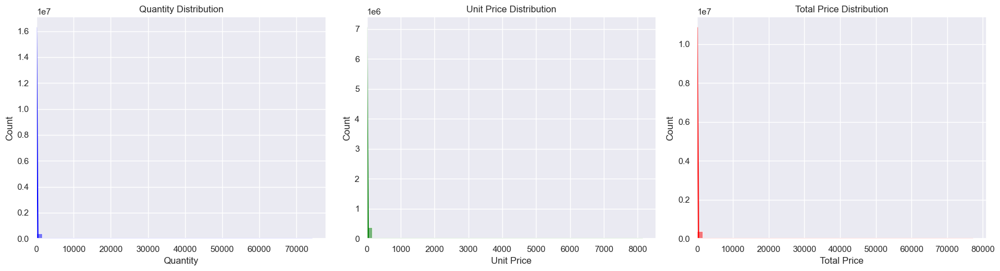

In [75]:
# Create a figure and axis objects
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Define bin sizes for each histogram based on the data range
quantity_bins = 50
unitprice_bins = 50
totalprice_bins = 50

# Create histograms with smart x-axis adjustments
sns.histplot(df['Quantity'], bins=quantity_bins, kde=True, ax=axs[0], color='blue')
axs[0].set_title('Quantity Distribution')
axs[0].set_xlim(left=0)  # Adjust x-axis limit for Quantity if needed
axs[0].set_xlabel('Quantity')

sns.histplot(df['UnitPrice'], bins=unitprice_bins, kde=True, ax=axs[1], color='green')
axs[1].set_title('Unit Price Distribution')
axs[1].set_xlim(left=0)  # Adjust x-axis limit for UnitPrice if needed
axs[1].set_xlabel('Unit Price')

sns.histplot(df['total_price'], bins=totalprice_bins, kde=True, ax=axs[2], color='red')
axs[2].set_title('Total Price Distribution')
axs[2].set_xlim(left=0)  # Adjust x-axis limit for Total Price if needed
axs[2].set_xlabel('Total Price')

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

#### Quantity Distribution

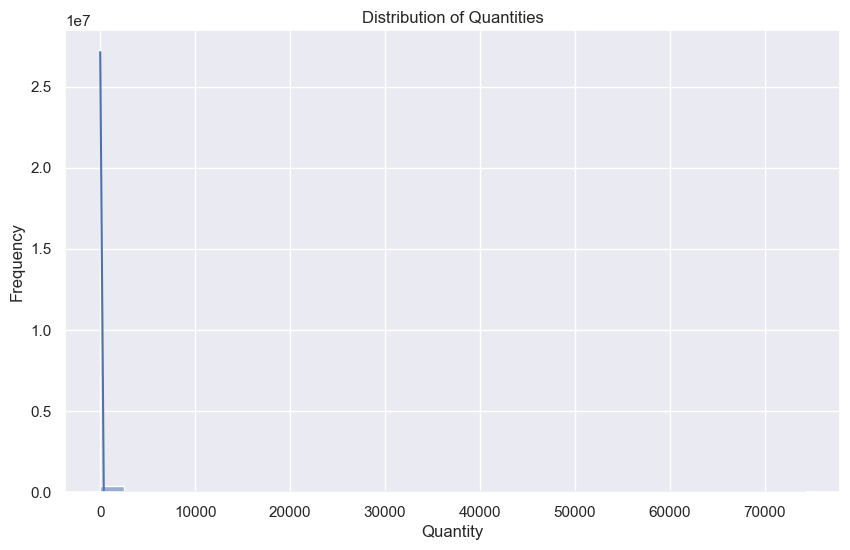

In [76]:
# Histogram for quantity
plt.figure(figsize=(10, 6))
sns.histplot(df['Quantity'], bins=30, kde=True)
plt.title('Distribution of Quantities')
plt.xlabel('Quantity')
plt.ylabel('Frequency')
plt.show()

#### Total price distribution

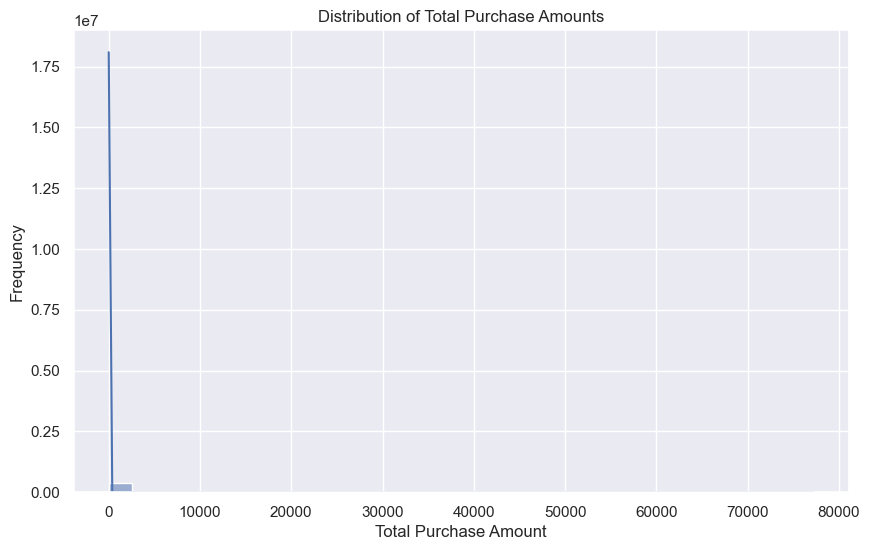

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histogram for total_price
plt.figure(figsize=(10, 6))
sns.histplot(df['total_price'], bins=30, kde=True)
plt.title('Distribution of Total Purchase Amounts')
plt.xlabel('Total Purchase Amount')
plt.ylabel('Frequency')
plt.show()


### Using Logarithmic Scales

As our data contains extreme outliers which cause most of the data to be clustered in a small range, we will use logarithmic scales and other techniques to handle outliers.

Logarithmic Scale:
- Compresses the range of the x-axis, making it easier to visualize data with a wide range.
- Useful for handling skewed distributions and outliers.

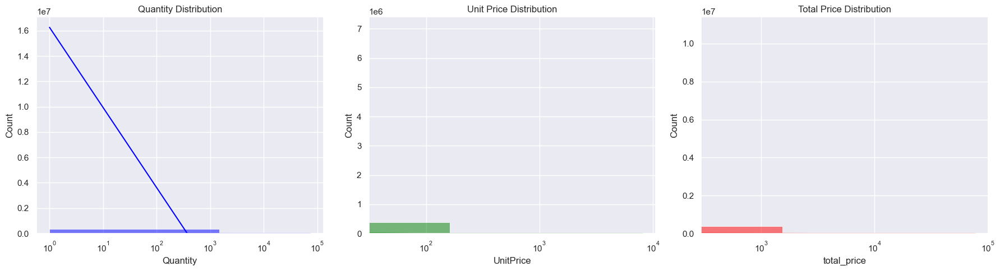

In [78]:
# Create a figure and axis objects
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Create histograms with logarithmic scale
sns.histplot(df['Quantity'], bins=50, kde=True, ax=axs[0], color='blue')
axs[0].set_title('Quantity Distribution')
axs[0].set_xscale('log')  # Apply logarithmic scale to x-axis

sns.histplot(df['UnitPrice'], bins=50, kde=True, ax=axs[1], color='green')
axs[1].set_title('Unit Price Distribution')
axs[1].set_xscale('log')  # Apply logarithmic scale to x-axis

sns.histplot(df['total_price'], bins=50, kde=True, ax=axs[2], color='red')
axs[2].set_title('Total Price Distribution')
axs[2].set_xscale('log')  # Apply logarithmic scale to x-axis

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

Square Root: 
- Reduces the impact of large values and spreads out values that are close together.

Cube Root:
- Provides a more moderate transformation compared to the square root, useful for handling large variations in data.

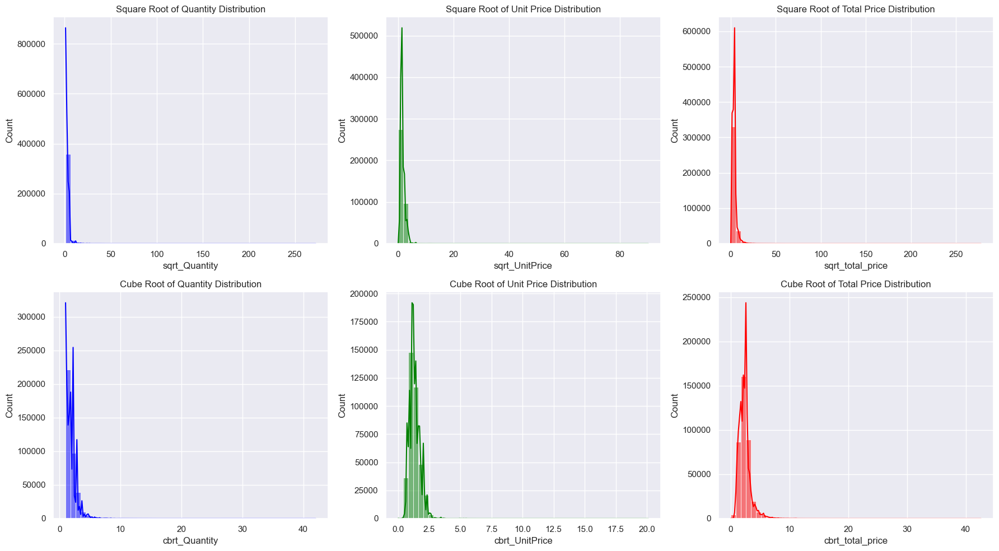

In [79]:
# Apply square root transformation
df['sqrt_Quantity'] = np.sqrt(df['Quantity'])
df['sqrt_UnitPrice'] = np.sqrt(df['UnitPrice'])
df['sqrt_total_price'] = np.sqrt(df['total_price'])

# Apply cube root transformation
df['cbrt_Quantity'] = np.cbrt(df['Quantity'])
df['cbrt_UnitPrice'] = np.cbrt(df['UnitPrice'])
df['cbrt_total_price'] = np.cbrt(df['total_price'])

# Create a figure and axis objects
fig, axs = plt.subplots(2, 3, figsize=(18, 10))

# Create histograms with square root transformation
sns.histplot(df['sqrt_Quantity'], bins=50, kde=True, ax=axs[0, 0], color='blue')
axs[0, 0].set_title('Square Root of Quantity Distribution')

sns.histplot(df['sqrt_UnitPrice'], bins=50, kde=True, ax=axs[0, 1], color='green')
axs[0, 1].set_title('Square Root of Unit Price Distribution')

sns.histplot(df['sqrt_total_price'], bins=50, kde=True, ax=axs[0, 2], color='red')
axs[0, 2].set_title('Square Root of Total Price Distribution')

# Create histograms with cube root transformation
sns.histplot(df['cbrt_Quantity'], bins=50, kde=True, ax=axs[1, 0], color='blue')
axs[1, 0].set_title('Cube Root of Quantity Distribution')

sns.histplot(df['cbrt_UnitPrice'], bins=50, kde=True, ax=axs[1, 1], color='green')
axs[1, 1].set_title('Cube Root of Unit Price Distribution')

sns.histplot(df['cbrt_total_price'], bins=50, kde=True, ax=axs[1, 2], color='red')
axs[1, 2].set_title('Cube Root of Total Price Distribution')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

#### Day of the Week Distribution

We assume that the e-commerce entity, which is being analysed, doesn't operate on Saturdays (day = 5), as there are no records made on this day of the week.

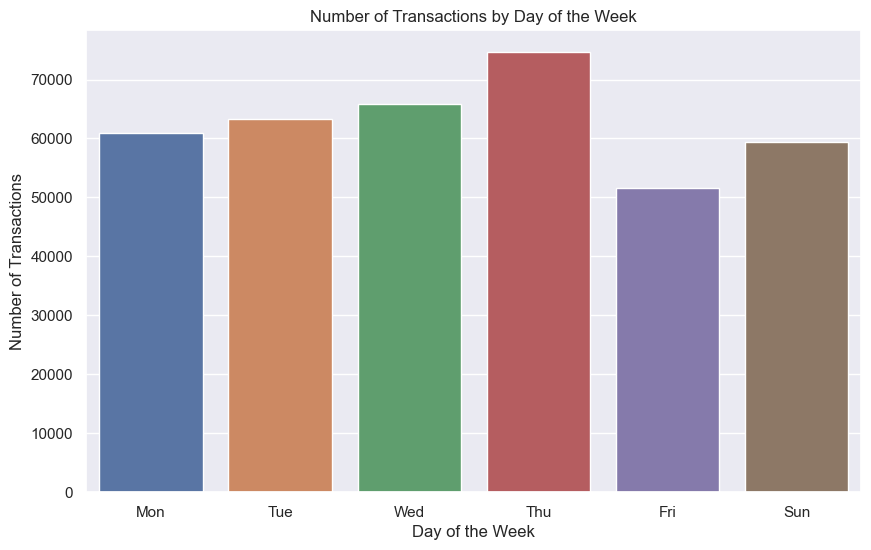

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the number of transactions by day of the week
plt.figure(figsize=(10, 6))
sns.countplot(x='day_of_week', data=df)

# Set title and labels
plt.title('Number of Transactions by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Transactions')

# Set x-tick labels to show day names (0=Monday, 1=Tuesday, etc.)
plt.xticks(ticks=range(6), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sun'])

plt.show()

In [81]:
# Count the number of transactions for each day of the week
transaction_counts = df['day_of_week'].value_counts().sort_index()

print(transaction_counts)

0    60902
1    63244
2    65908
3    74641
4    51682
6    59329
Name: day_of_week, dtype: int64


###  Weekly Purchase Patterns

In [82]:
# Aggregate sales by day of the week
weekly_sales = df.groupby('day_of_week')['total_price'].sum().sort_index()

# Print the aggregated sales to check if all days are included
print(weekly_sales)

day_of_week
0    1305523.311
1    1651744.141
2    1515053.230
3    1878214.400
4    1254225.051
6     765258.321
Name: total_price, dtype: float64


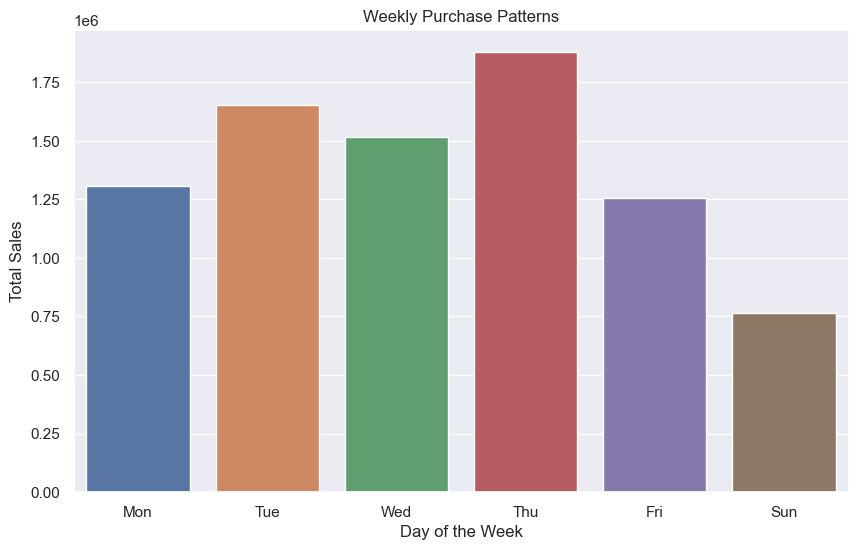

In [83]:
# Aggregate sales by day of the week
weekly_sales = df.groupby('day_of_week')['total_price'].sum().sort_index()

# Plot the bar chart for weekly purchase patterns
plt.figure(figsize=(10, 6))
sns.barplot(x=weekly_sales.index, y=weekly_sales.values)

# Set title and labels
plt.title('Weekly Purchase Patterns')
plt.xlabel('Day of the Week')
plt.ylabel('Total Sales')

# Set x-tick labels to show day numbers (0=Monday, 1=Tuesday, etc.)
plt.xticks(ticks=range(6), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sun'])

plt.show()

In [84]:
# Aggregate total purchase amounts by day of the week
daily_total_purchase = df.groupby('day_of_week')['total_price'].sum()

# Sort in descending order and select the top 3 days
top_days = daily_total_purchase.sort_values(ascending=False).head(3)

# Convert numerical day_of_week to day names for readability
day_names = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
top_days.index = [day_names[i] for i in top_days.index]

# Format the totals as integers
top_days = top_days.astype(int)

# Convert the result to a DataFrame for tabular representation
top_days_df = top_days.reset_index()
top_days_df.columns = ['Day of the Week', 'Total Purchase Amount']

print("Top 3 days by total purchase amounts:")
print(top_days_df)

Top 3 days by total purchase amounts:
  Day of the Week  Total Purchase Amount
0             Thu                1878214
1             Tue                1651744
2             Wed                1515053


#### Country Distribution

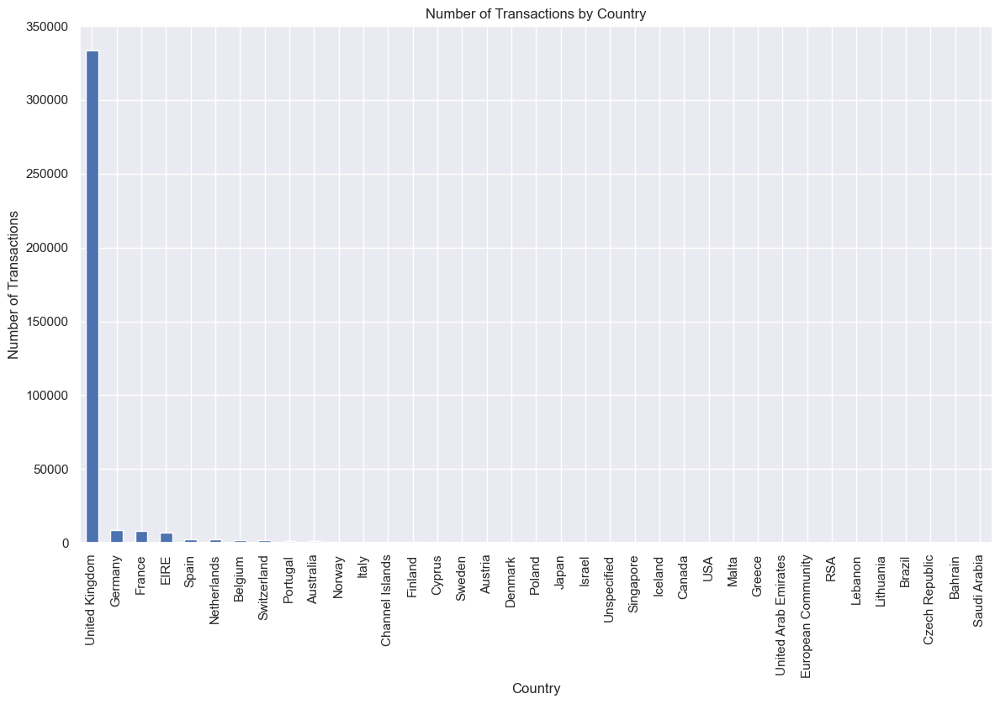

In [85]:
# Bar chart for countries
plt.figure(figsize=(14, 8))
df['Country'].value_counts().plot(kind='bar')
plt.title('Number of Transactions by Country')
plt.xlabel('Country')
plt.ylabel('Number of Transactions')
plt.show()

In [86]:
# Checking the number of rows where the country is "Unspecified"
unspecified_rows = df[df['Country'] == 'Unspecified']
num_unspecified = unspecified_rows.shape[0]
print(f"Number of rows where the country is 'Unspecified': {num_unspecified}")

Number of rows where the country is 'Unspecified': 241


In [87]:
# Removing rows where the country is "Unspecified"
df = df[df['Country'] != 'Unspecified']

#### Grouping Countries by the Quantity of Orders

In [88]:
# Calculate the number of orders for each country
country_order_counts = df['Country'].value_counts()

# Define number of groups
group_size = 9

# Sort countries by order counts and divide into groups
countries_by_orders = country_order_counts.index.tolist()
num_groups = len(countries_by_orders) // group_size + (1 if len(countries_by_orders) % group_size else 0)
groups = [countries_by_orders[i * group_size:(i + 1) * group_size] for i in range(num_groups)]

# Add a new column to the dataset to assign each country to a group
def assign_group(country):
    for idx, group in enumerate(groups, 1):
        if country in group:
            return idx

df['CountryGroup'] = df['Country'].apply(assign_group)

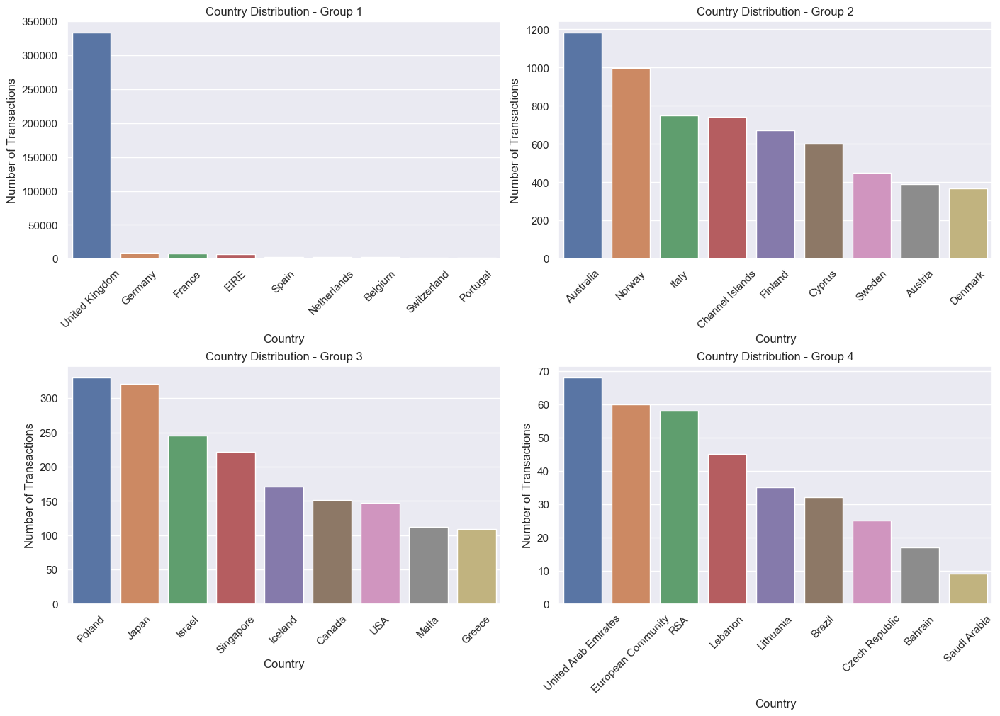

In [89]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting multiple bar charts in sets of 4
for group_start in range(0, num_groups, 4):
    fig, axs = plt.subplots(2, 2, figsize=(14, 10), constrained_layout=True)
    for i in range(4):
        if group_start + i < num_groups:
            group_idx = group_start + i
            group_data = df[df['CountryGroup'] == group_idx + 1]
            ax = axs[i // 2, i % 2]
            sns.countplot(x='Country', data=group_data, ax=ax, order=groups[group_idx])
            ax.set_title(f'Country Distribution - Group {group_idx + 1}')
            ax.set_xlabel('Country')
            ax.set_ylabel('Number of Transactions')
            ax.tick_params(axis='x', rotation=45)

    plt.show()


### Monthly Sales Trend

Plot the total sales or quantity of items sold over time to identify trends, seasonality, and patterns.

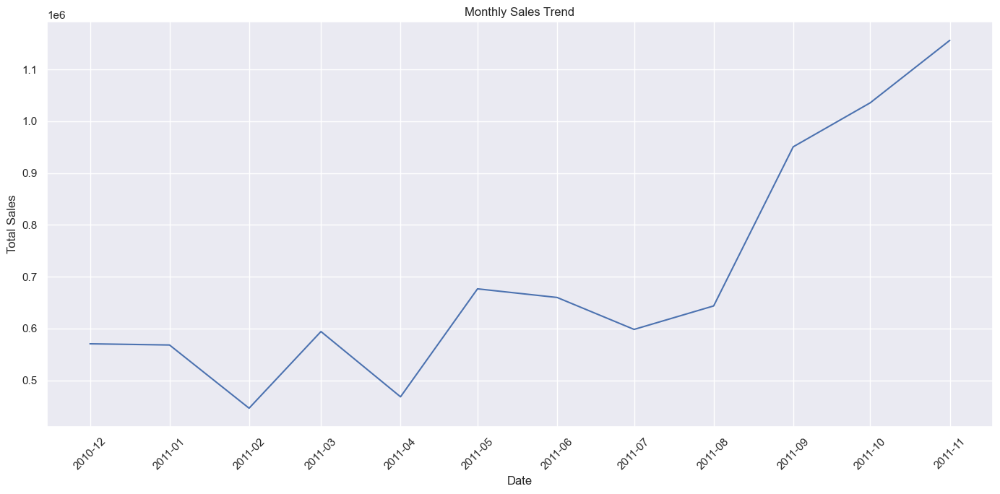

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates

# Aggregate data by month
monthly_sales = df.groupby(['year', 'month']).agg({'total_price': 'sum'}).reset_index()
monthly_sales['date'] = pd.to_datetime(monthly_sales[['year', 'month']].assign(day=1))

# Plot
plt.figure(figsize=(14, 7))
sns.lineplot(data=monthly_sales, x='date', y='total_price')
plt.title('Monthly Sales Trend')
plt.xlabel('Date')
plt.ylabel('Total Sales')

# Set the date format on the x-axis to show each month
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Hourly Sales Distribution

Visualize how sales are distributed across different hours of the day.

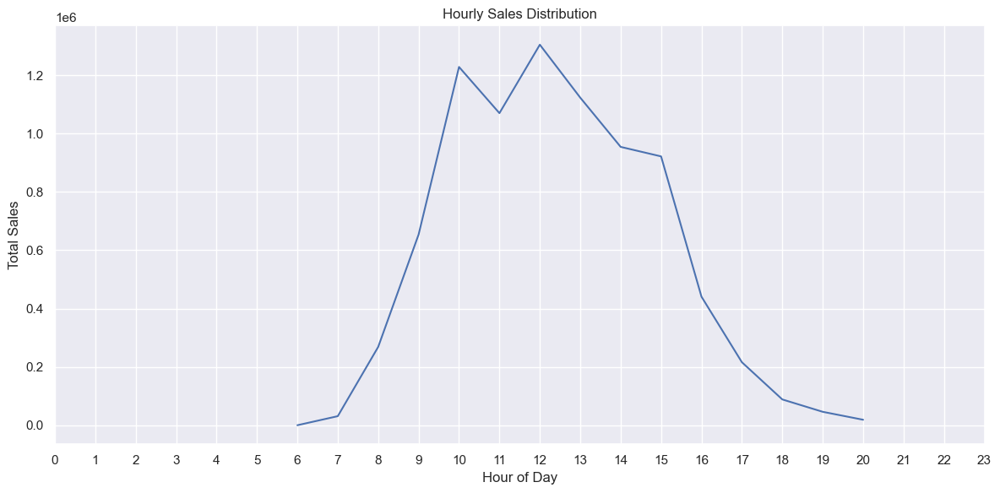

In [91]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='hour', y='total_price', estimator='sum', errorbar=None)
plt.title('Hourly Sales Distribution')
plt.xlabel('Hour of Day')
plt.ylabel('Total Sales')
plt.xticks(range(24))
plt.tight_layout()
plt.show()

### Time Series Analysis

In [92]:
# Ensure InvoiceDate is in datetime format (if not already)
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

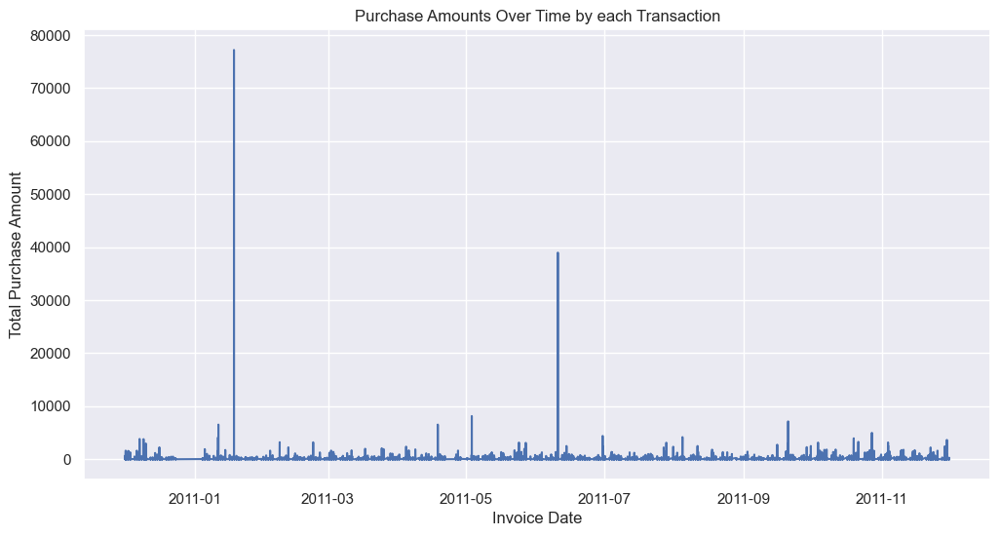

In [93]:
# Plot total_price over time
plt.figure(figsize=(12, 6))
plt.plot(df['InvoiceDate'], df['total_price'])
plt.title('Purchase Amounts Over Time by each Transaction')
plt.xlabel('Invoice Date')
plt.ylabel('Total Purchase Amount')
plt.show()

This line plots the total price against dates without aggregation, so it shows each individual transaction's total price by date.

In [94]:
# Extract the date from 'InvoiceDate'
df['Date'] = df['InvoiceDate'].dt.date

In [95]:
# Aggregate the Data
daily_total_purchase = df.groupby('InvoiceDate')['total_price'].sum()

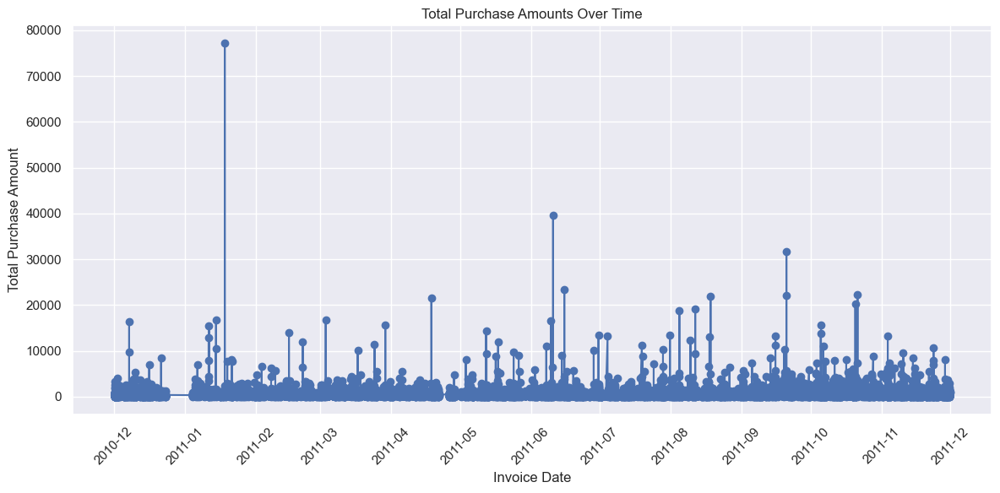

In [96]:
# Plot Aggregated Data
plt.figure(figsize=(12, 6))
plt.plot(daily_total_purchase.index, daily_total_purchase.values, marker='o')
plt.title('Total Purchase Amounts Over Time')
plt.xlabel('Invoice Date')
plt.ylabel('Total Purchase Amount')

# Set x-axis major locator and formatter to include all months
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Rotate x-tick labels for better readability
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### Top 3 days with the highest total purchase amounts over time

Top 3 Days calculation aggregates total purchase amounts by date. The top 3 days are selected based on these aggregated totals.

In [97]:
# Extract the date from 'InvoiceDate'
df['Date'] = df['InvoiceDate'].dt.date

# Aggregate total purchase amounts by date
daily_total_purchase = df.groupby('Date')['total_price'].sum()

# Sort in descending order and select the top 3 dates
top_days = daily_total_purchase.sort_values(ascending=False).head(3)

# Format the totals as integers
top_days = top_days.astype(int)

# Convert the result to a DataFrame for tabular representation
top_days_df = top_days.reset_index()
top_days_df.columns = ['Date', 'Total Purchase Amount']

print("Top 3 days by total purchase amounts:")
print(top_days_df)

Top 3 days by total purchase amounts:
         Date  Total Purchase Amount
0  2011-09-20                 103377
1  2011-01-18                  87559
2  2011-10-05                  73975


#### Decompose Time Series

In [98]:
# Extract date from 'InvoiceDate' and aggregate total_price by day
df['Date'] = df['InvoiceDate'].dt.date
daily_total_purchase = df.groupby('Date')['total_price'].sum()

Data Aggregation: Aggregates total_price by day and converts the Date index to a datetime object.

Decomposition: Decomposes the daily aggregated time series data.

Date Formatting: Formats x-axis to display each month for better readability.

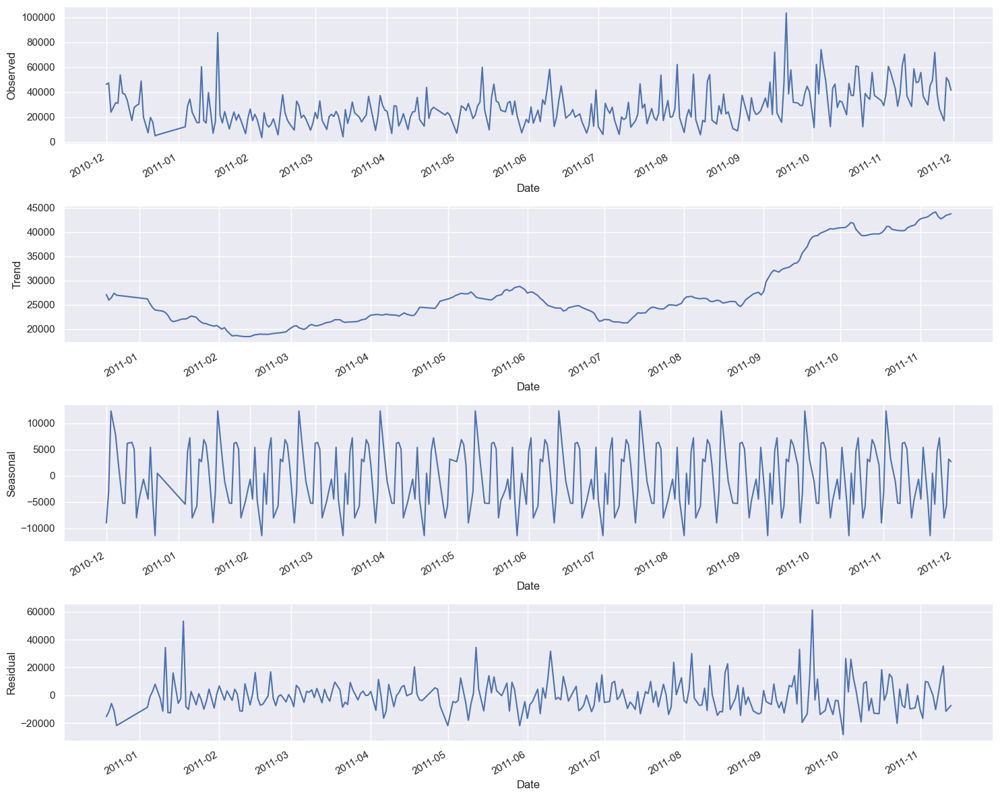

In [99]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.dates as mdates

# Ensure the index is a datetime object
daily_total_purchase.index = pd.to_datetime(daily_total_purchase.index)

# Decompose the time series
decomposition = seasonal_decompose(daily_total_purchase, model='additive', period=30)

# Plot the decomposition
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(15, 12))

# Observed
decomposition.observed.plot(ax=ax1)
ax1.set_ylabel('Observed')

# Trend
decomposition.trend.plot(ax=ax2)
ax2.set_ylabel('Trend')

decomposition.seasonal.plot(ax=ax3)
ax3.set_ylabel('Seasonal')

# Residual
decomposition.resid.plot(ax=ax4)
ax4.set_ylabel('Residual')

# Set date format on the x-axis to show each month
for ax in [ax1, ax2, ax3, ax4]:
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.set_xlabel('Date')

plt.tight_layout()
plt.show()

Components of Time Series Decomposition
 - Observed: The actual values from your dataset.

- Trend: The long-term movement or general direction in the data over time. It shows whether the data is generally increasing or decreasing.

- Seasonal: The repeating patterns or cycles in the data, typically occurring at regular intervals (e.g., daily, monthly, quarterly).

- Residual: The part of the data that remains after removing the trend and seasonal components. It includes irregular fluctuations or noise not explained by the trend and seasonality.

Understanding Residuals
- Positive Residuals: When the actual value is higher than the predicted value (i.e., the observed value is greater than the trend + seasonal component).

- Negative Residuals: When the actual value is lower than the predicted value (i.e., the observed value is less than the trend + seasonal component).

Why Residuals Might Be Negative
Model Fit: Residuals being negative or positive indicate how well the model fits the data. If the residuals are negative, it means the actual values are below the expected values based on the trend and seasonal patterns.

Irregular Fluctuations: Residuals capture random noise or unexpected deviations that cannot be explained by the trend or seasonality. This can include errors, outliers, or other influences not accounted for by the model.

Interpreting Residuals
Patterns in Residuals: Ideally, residuals should be randomly distributed around zero if the model has properly captured the trend and seasonality. If residuals show patterns, it may indicate that the model is missing important information or features.

Magnitude of Residuals: Large residuals (both positive and negative) can signal that there are significant deviations from the expected values, which might need further investigation or a different modeling approach.

### Decomposition with a 3-Month Period

The period parameter in seasonal_decompose is set to 90 to reflect approximately 3 months of data. This allows the decomposition to consider a cycle of about 3 months. 

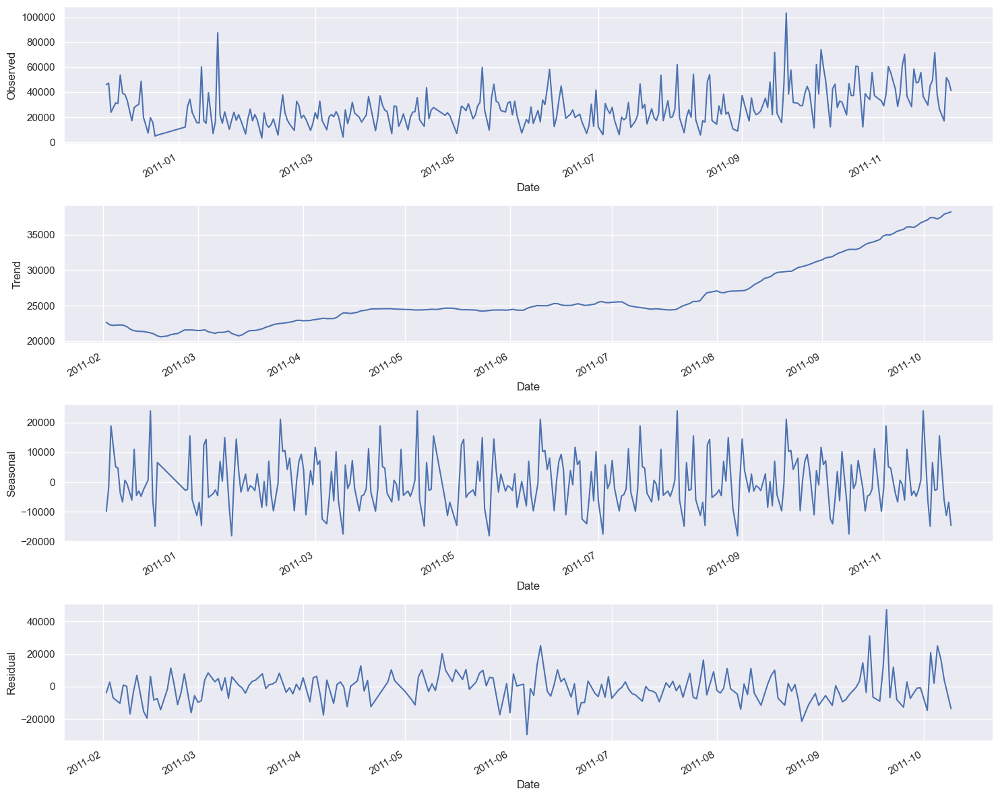

In [100]:
# Decompose the time series with a period of approximately 3 months (90 days)
decomposition = seasonal_decompose(daily_total_purchase, model='additive', period=90)

# Plot the decomposition
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(15, 12))

# Observed
decomposition.observed.plot(ax=ax1)
ax1.set_ylabel('Observed')

# Trend
decomposition.trend.plot(ax=ax2)
ax2.set_ylabel('Trend')

# Seasonal
decomposition.seasonal.plot(ax=ax3)
ax3.set_ylabel('Seasonal')

# Residual
decomposition.resid.plot(ax=ax4)
ax4.set_ylabel('Residual')

plt.tight_layout()
plt.show()

## Customer Behaviour Analysis

### Purchase Frequency per Customer

In [101]:
# Calculate the number of transactions per customer
purchase_frequency = df.groupby('CustomerID').size().reset_index(name='num_purchases')

# Check the result
print(purchase_frequency.head())

   CustomerID  num_purchases
0       12346              1
1       12347            171
2       12348             31
3       12349             73
4       12350             17


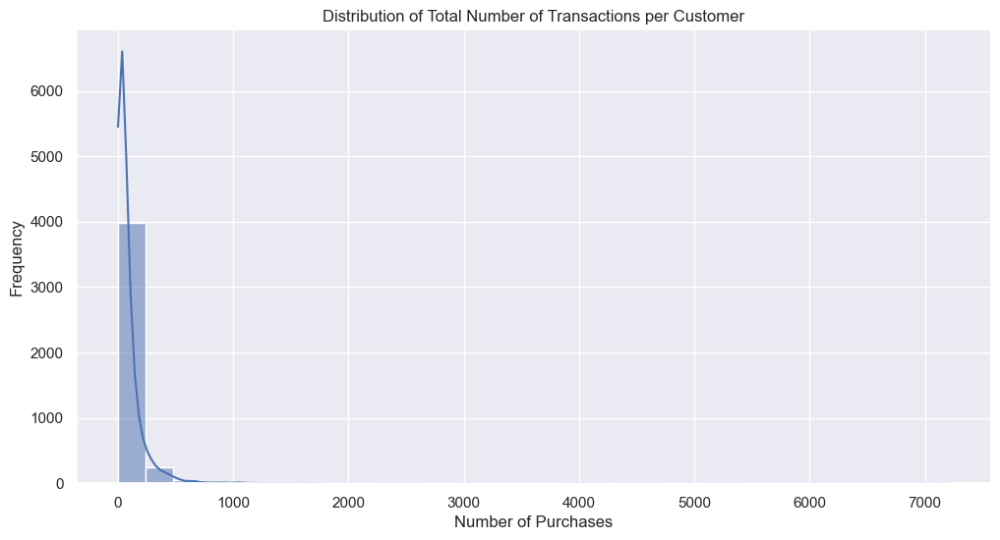

In [102]:
plt.figure(figsize=(12, 6))
sns.histplot(purchase_frequency['num_purchases'], bins=30, kde=True)
plt.title('Distribution of Total Number of Transactions per Customer')
plt.xlabel('Number of Purchases')
plt.ylabel('Frequency')
plt.show()

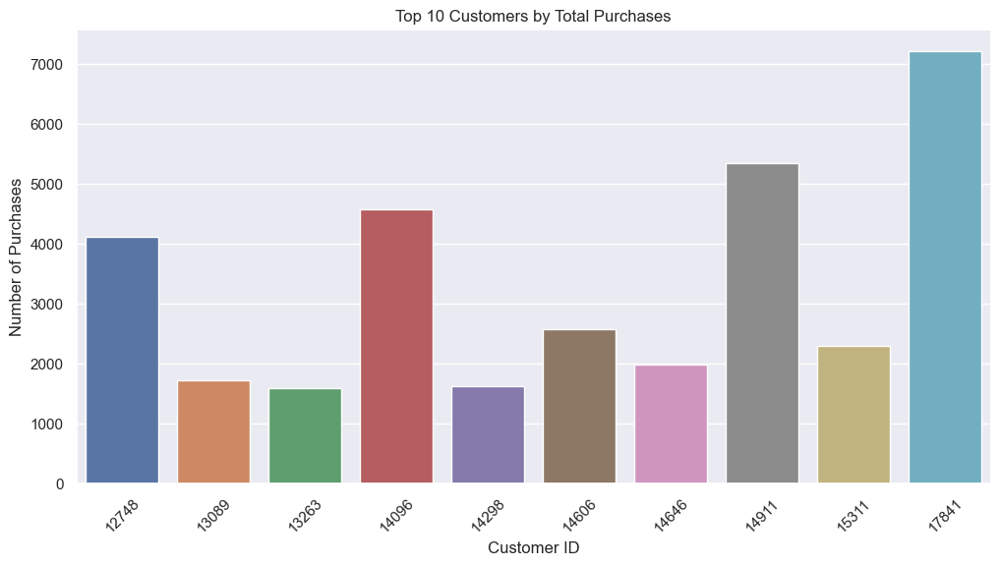

In [103]:
# Sort by purchase frequency in descending order and select top 10
top_customers = purchase_frequency.sort_values(by='num_purchases', ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(x='CustomerID', y='num_purchases', data=top_customers)
plt.title('Top 10 Customers by Total Purchases')
plt.xlabel('Customer ID')
plt.ylabel('Number of Purchases')
plt.xticks(rotation=45)
plt.show()

When discussing "purchase frequency," it can indeed refer to how often a customer makes purchases over a specific period, rather than just the total number of transactions. To analyze the frequency of purchases, we will need to calculate how often each customer makes a purchase within a given time frame (e.g., days, weeks, or months).

In [104]:
# Sort data by CustomerID and InvoiceDate
df = df.sort_values(by=['CustomerID', 'InvoiceDate'])

# Calculate the time difference between consecutive purchases for each customer
df['PreviousPurchaseDate'] = df.groupby('CustomerID')['InvoiceDate'].shift(1)
df['DaysBetweenPurchases'] = (df['InvoiceDate'] - df['PreviousPurchaseDate']).dt.days

# Calculate the average days between purchases for each customer
purchase_frequency = df.groupby('CustomerID')['DaysBetweenPurchases'].mean().reset_index(name='AverageDaysBetweenPurchases')

# Check the result
print(purchase_frequency.head())

   CustomerID  AverageDaysBetweenPurchases
0       12346                          NaN
1       12347                     1.911765
2       12348                     9.400000
3       12349                     0.000000
4       12350                     0.000000


To ensure that each transaction day is only counted once per customer, we will to aggregate purchases by day for each customer and then compute the frequency based on these aggregated daily transactions

In [105]:
# Extract the date part from 'InvoiceDate'
df['Date'] = df['InvoiceDate'].dt.date

# Aggregate total purchase amounts by customer and date
daily_aggregated = df.groupby(['CustomerID', 'Date'])['total_price'].sum().reset_index()

# Check the result
print(daily_aggregated.head())

   CustomerID        Date  total_price
0       12346  2011-01-18     77183.60
1       12347  2010-12-07       711.79
2       12347  2011-01-26       475.39
3       12347  2011-04-07       636.25
4       12347  2011-06-09       382.52


In [106]:
# Sort data by CustomerID and Date
daily_aggregated = daily_aggregated.sort_values(by=['CustomerID', 'Date'])

# Calculate the time difference between consecutive purchase days for each customer
daily_aggregated['PreviousPurchaseDate'] = daily_aggregated.groupby('CustomerID')['Date'].shift(1)
daily_aggregated['DaysBetweenPurchases'] = (pd.to_datetime(daily_aggregated['Date']) - pd.to_datetime(daily_aggregated['PreviousPurchaseDate'])).dt.days

# Calculate the average days between purchases for each customer
purchase_frequency = daily_aggregated.groupby('CustomerID')['DaysBetweenPurchases'].mean().reset_index(name='AverageDaysBetweenPurchases')

# Check the result
print(purchase_frequency.head())


   CustomerID  AverageDaysBetweenPurchases
0       12346                          NaN
1       12347                    65.600000
2       12348                    94.333333
3       12349                          NaN
4       12350                          NaN


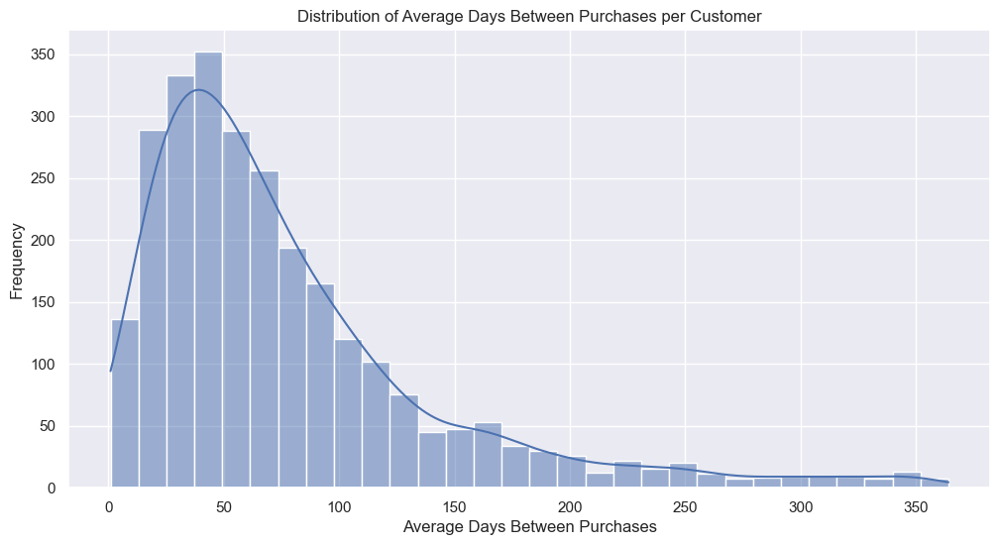

In [107]:
# Plot the distribution of average days between purchases
plt.figure(figsize=(12, 6))
sns.histplot(purchase_frequency['AverageDaysBetweenPurchases'], bins=30, kde=True)
plt.title('Distribution of Average Days Between Purchases per Customer')
plt.xlabel('Average Days Between Purchases')
plt.ylabel('Frequency')
plt.show()


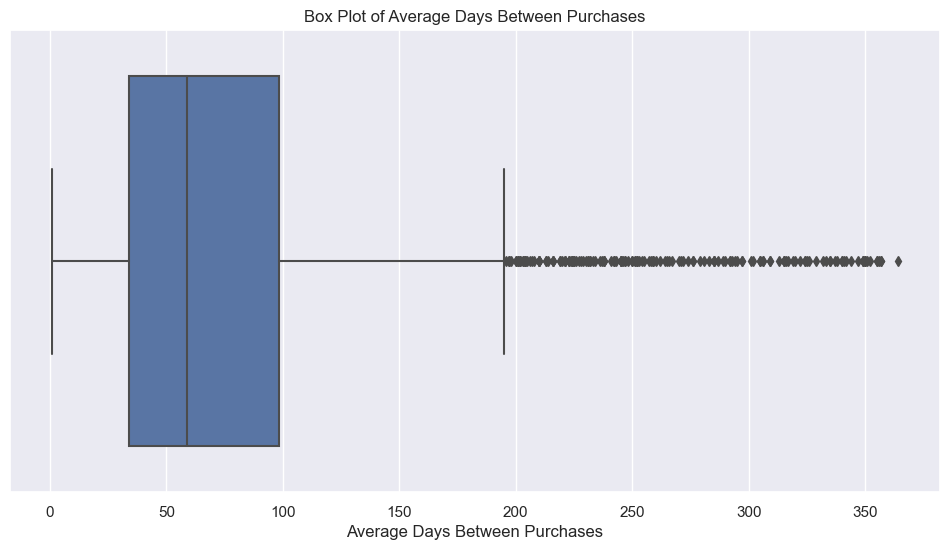

In [108]:
# Plot box plot for insights into purchase frequency
plt.figure(figsize=(12, 6))
sns.boxplot(x=purchase_frequency['AverageDaysBetweenPurchases'])
plt.title('Box Plot of Average Days Between Purchases')
plt.xlabel('Average Days Between Purchases')
plt.show()


###  Customer Purchase Value

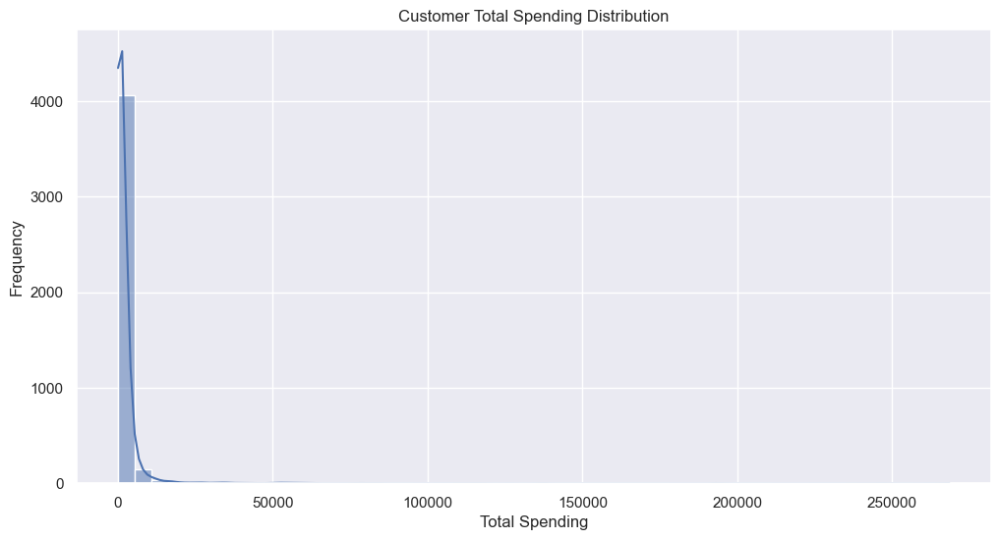

In [109]:
customer_spending = df.groupby('CustomerID')['total_price'].sum().reset_index(name='total_spent')

plt.figure(figsize=(12, 6))
sns.histplot(customer_spending['total_spent'], bins=50, kde=True)
plt.title('Customer Total Spending Distribution')
plt.xlabel('Total Spending')
plt.ylabel('Frequency')
plt.show()

### Average Purchase Amount per Customer

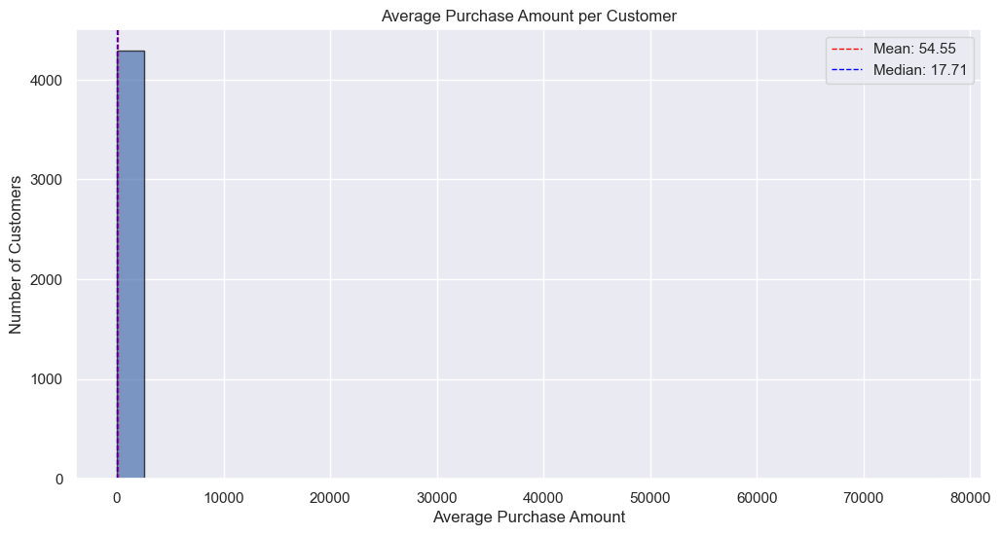

In [110]:
# Calculate the average purchase amount per customer
average_purchase_amount = df.groupby('CustomerID')['total_price'].mean()

# Plot the histogram of average purchase amounts
plt.figure(figsize=(12, 6))
plt.hist(average_purchase_amount, bins=30, edgecolor='black', alpha=0.7)
plt.title('Average Purchase Amount per Customer')
plt.xlabel('Average Purchase Amount')
plt.ylabel('Number of Customers')

# Add lines for mean and median for reference
mean_value = average_purchase_amount.mean()
median_value = average_purchase_amount.median()

plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_value:.2f}')
plt.axvline(median_value, color='blue', linestyle='dashed', linewidth=1, label=f'Median: {median_value:.2f}')
plt.legend()

plt.show()

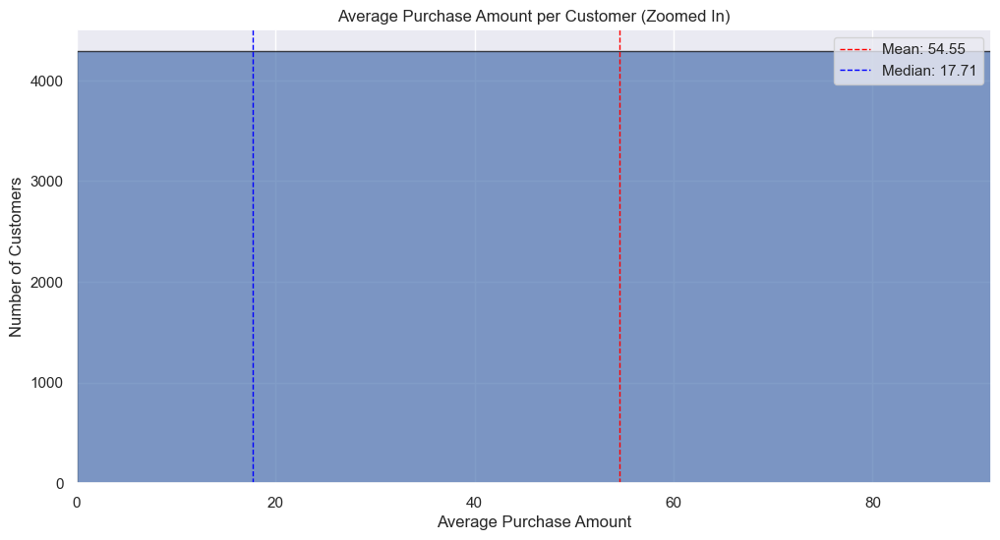

In [111]:
# Plot with zoomed-in x-axis to focus on the main range
plt.figure(figsize=(12, 6))
plt.hist(average_purchase_amount, bins=30, edgecolor='black', alpha=0.7)
plt.title('Average Purchase Amount per Customer (Zoomed In)')
plt.xlabel('Average Purchase Amount')
plt.ylabel('Number of Customers')

# Add lines for mean and median
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_value:.2f}')
plt.axvline(median_value, color='blue', linestyle='dashed', linewidth=1, label=f'Median: {median_value:.2f}')
plt.legend()

# Adjust x-axis limit if needed to zoom in
plt.xlim(0, average_purchase_amount.quantile(0.95))  # Adjust as necessary

plt.show()

#### Monthly Sales Trends

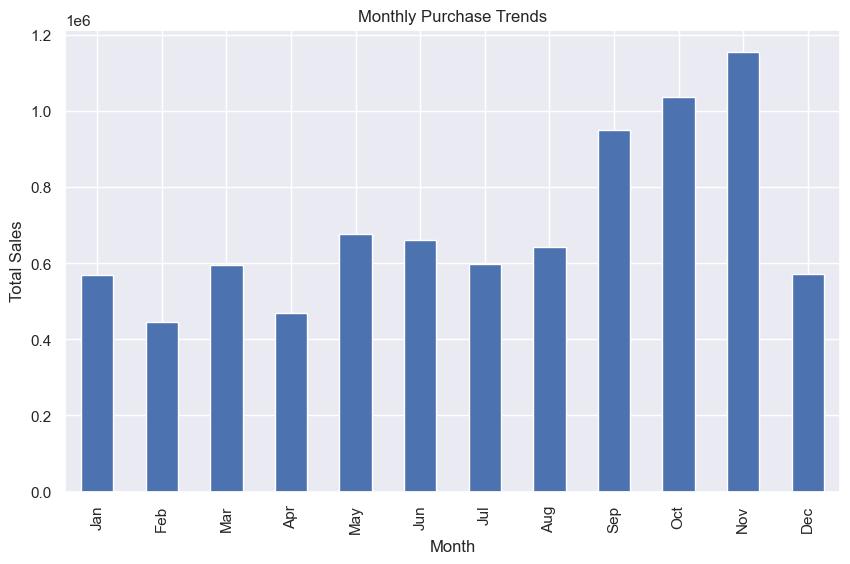

In [112]:
# Group by month to see monthly trends
monthly_trend = df.groupby('month')['total_price'].sum()

# Plot monthly trends
plt.figure(figsize=(10, 6))
monthly_trend.plot(kind='bar')
plt.title('Monthly Purchase Trends')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.xticks(ticks=np.arange(0, 12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

### Customer Lifetime Value (CLV) and its components

Customer-Level Average: 
- First averages transactions per customer, then averages these customer averages. This reflects the spending behavior of the average customer rather than the average transaction. 
- Normalizes for different customer spending levels, providing a more representative value if you want to understand the average customer behavior.

Customer-Level Average Purchase Value is better for understanding the behavior of the average customer, as it accounts for different spending patterns among customers.

In [113]:
#Calculate Customer-Level Average Purchase Value (APV)
avg_purchase_value = df.groupby('CustomerID')['total_price'].mean().mean()

In [114]:
#Calculate Average Purchase Frequency Rate (APFR):
purchase_frequency = df.groupby('CustomerID')['InvoiceDate'].nunique().mean()

In [115]:
#Calculate Customer Value (CV):
customer_value = avg_purchase_value * purchase_frequency

In [116]:
#Estimate Average Customer Lifespan (ACL):
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
customer_lifespans = df.groupby('CustomerID')['InvoiceDate'].agg(['min', 'max'])
customer_lifespans['lifespan'] = (customer_lifespans['max'] - customer_lifespans['min']).dt.days
avg_lifespan = customer_lifespans['lifespan'].mean()

In [117]:
# Calculate Customer Lifetime Value (CLV):
clv = customer_value * (avg_lifespan / 365)  # Divide lifespan by 365 to convert days into years

In [118]:
print(f"Average Purchase Value: {avg_purchase_value:.2f}")
print(f"Average Purchase Frequency Rate: {purchase_frequency:.2f}")
print(f"Customer Value: {customer_value:.2f}")
print(f"Average Customer Lifespan: {avg_lifespan:.2f} days")
print(f"Customer Lifetime Value: {clv:.2f}")

Average Purchase Value: 54.55
Average Purchase Frequency Rate: 4.11
Customer Value: 224.36
Average Customer Lifespan: 125.16 days
Customer Lifetime Value: 76.93


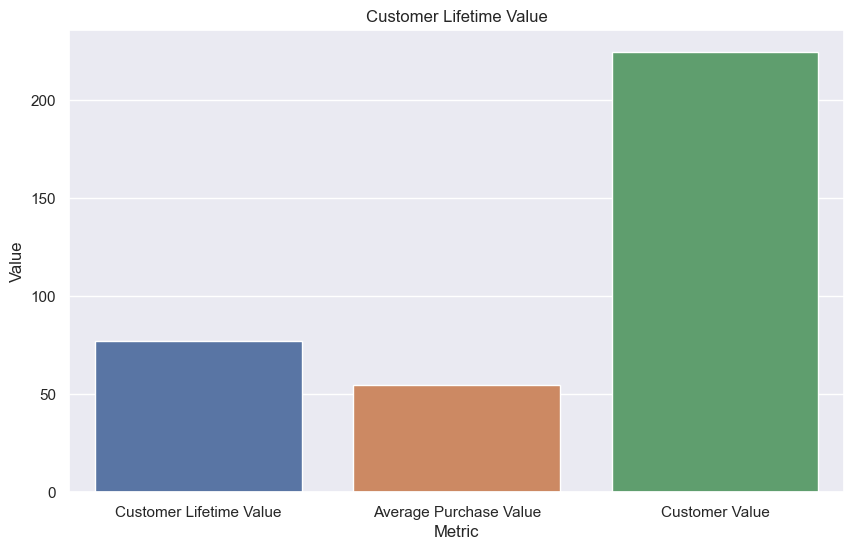

In [119]:
# Prepare data for visualization
clv_data = {
    'Customer Lifetime Value': clv,
    'Average Purchase Value': avg_purchase_value,
    'Customer Value': customer_value
}

# Create bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=list(clv_data.keys()), y=list(clv_data.values()))
plt.title('Customer Lifetime Value')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.show()


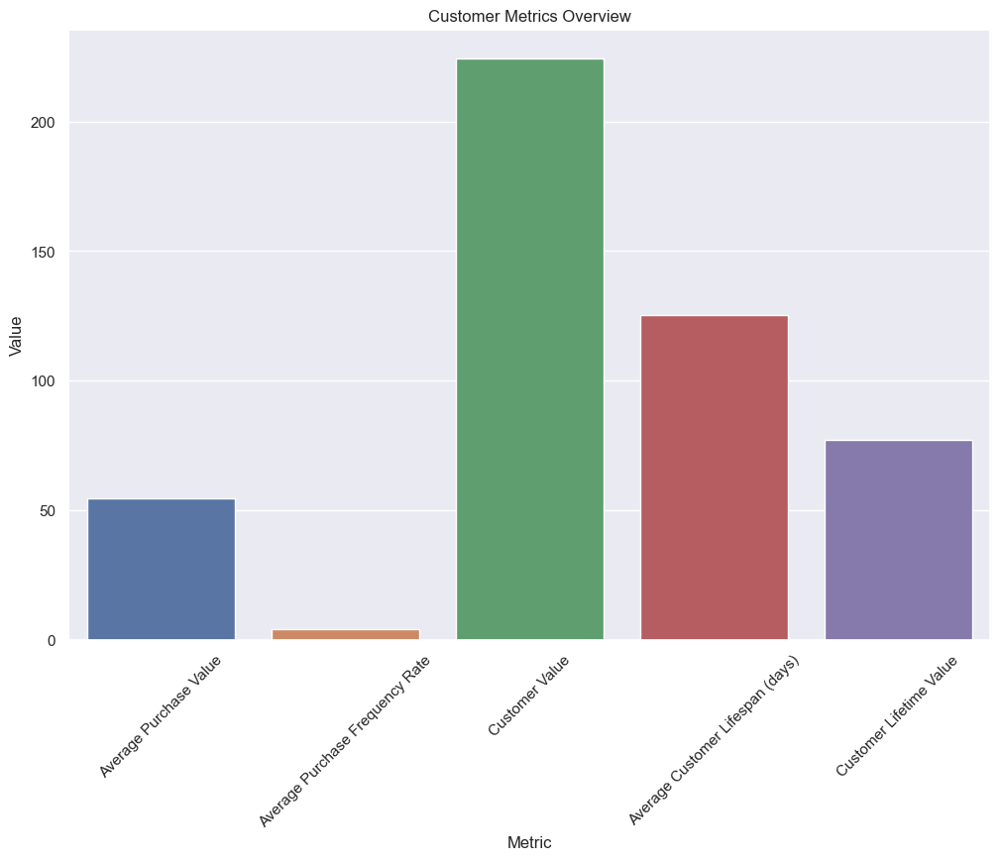

In [120]:
# Prepare data for visualization with units
summary_data = {
    'Average Purchase Value': avg_purchase_value,  # Currency
    'Average Purchase Frequency Rate': purchase_frequency.mean(),  # Dimensionless
    'Customer Value': avg_purchase_value * purchase_frequency.mean(),  # Currency
    'Average Customer Lifespan (days)': avg_lifespan,  # Days
    'Customer Lifetime Value': clv.mean()  # Currency
}

# Create bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x=list(summary_data.keys()), y=list(summary_data.values()))
plt.title('Customer Metrics Overview')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.show()

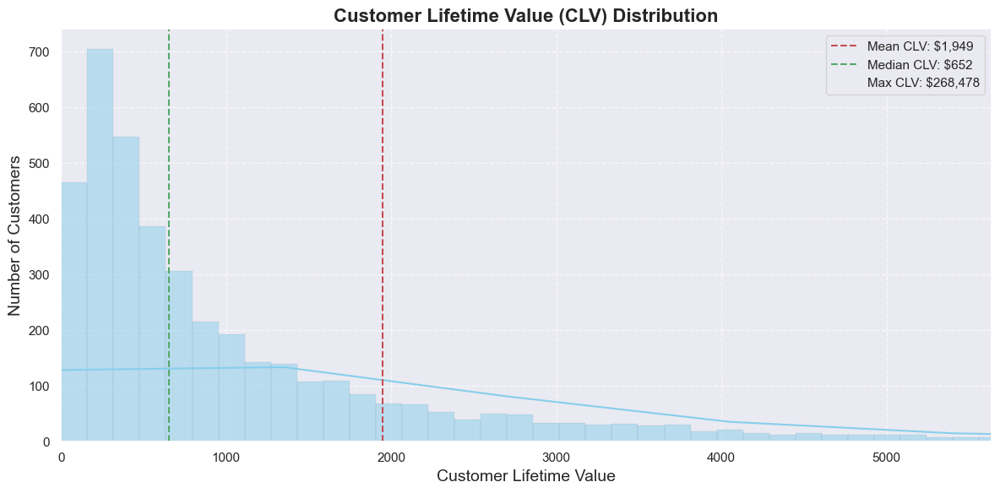

In [121]:
# Calculate Customer Lifetime Value (CLV)
clv = df.groupby('CustomerID')['total_price'].sum()

# Calculate descriptive statistics
clv_min = clv.min()
clv_max = clv.max()
clv_mean = clv.mean()
clv_median = clv.median()

# Define limits for zooming in on the data range
zoom_upper_limit = clv.quantile(0.95)  # 95th percentile as upper limit

# Create the plot
plt.figure(figsize=(12, 6))

# Plot with adjusted bins and zoomed range
sns.histplot(clv, bins='auto', kde=True, color='skyblue', edgecolor='black')

# Set x-axis limits to zoom in on the data range
plt.xlim(clv_min, zoom_upper_limit)

# Add title and labels
plt.title('Customer Lifetime Value (CLV) Distribution', fontsize=16, weight='bold')
plt.xlabel('Customer Lifetime Value', fontsize=14)
plt.ylabel('Number of Customers', fontsize=14)

# Add grid lines for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Add vertical lines for mean and median
plt.axvline(clv_mean, color='r', linestyle='--', label=f'Mean CLV: ${clv_mean:,.0f}')
plt.axvline(clv_median, color='g', linestyle='--', label=f'Median CLV: ${clv_median:,.0f}')

# Create a legend box
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(plt.Line2D([0], [0], color='none'))
labels.append(f'Max CLV: ${clv_max:,.0f}')
plt.legend(handles, labels, loc='best')

# Show the plot
plt.tight_layout()
plt.show()

## Advanced Feature Engineering

### Time-based Features

### Lag Features

Lag features are values from previous time steps used as features for predicting future values. In the context of time series data, they help the model understand the temporal dependencies and patterns. For the total_price in our dataset, lag features will represent the total price from previous transactions for a given customer.

In [122]:
# Sort data by CustomerID and InvoiceDate
df = df.sort_values(by=['CustomerID', 'InvoiceDate'])

# Create lag features for total_price
df['lag_1'] = df.groupby('CustomerID')['total_price'].shift(1)
df['lag_2'] = df.groupby('CustomerID')['total_price'].shift(2)
df['lag_3'] = df.groupby('CustomerID')['total_price'].shift(3)

# Check the result
print(df.head())

      InvoiceNo StockCode                        Description  Quantity  \
36527      2331      2001     MEDIUM CERAMIC TOP STORAGE JAR     74215   
10257       615      3246    BLACK CANDELABRA T-LIGHT HOLDER        12   
10258       615      1250  AIRLINE BAG VINTAGE JET SET BROWN         4   
10259       615      2657  COLOUR GLASS. STAR T-LIGHT HOLDER        12   
10260       615      1356             MINI PAINT SET VINTAGE        36   

              InvoiceDate  UnitPrice  CustomerID         Country  \
36527 2011-01-18 10:01:00       1.04       12346  United Kingdom   
10257 2010-12-07 14:57:00       2.10       12347         Iceland   
10258 2010-12-07 14:57:00       4.25       12347         Iceland   
10259 2010-12-07 14:57:00       3.25       12347         Iceland   
10260 2010-12-07 14:57:00       0.65       12347         Iceland   

       TransactionID  day_of_week  ...  cbrt_Quantity  cbrt_UnitPrice  \
36527           2331            1  ...      42.023985        1.013159   


### Rolling Window Features

Rolling window features are statistical measures computed over a fixed window of consecutive observations in time series data. These features help capture trends, seasonality, and other temporal dependencies by summarizing data over a rolling window of specified length.

In [123]:
# Rolling window features for total_price
df['rolling_mean_3'] = df.groupby('CustomerID')['total_price'].rolling(window=3).mean().reset_index(0, drop=True)
df['rolling_std_3'] = df.groupby('CustomerID')['total_price'].rolling(window=3).std().reset_index(0, drop=True)

# Fill NaN values
df[['rolling_mean_3', 'rolling_std_3']] = df[['rolling_mean_3', 'rolling_std_3']].fillna(0)

# Check the result
print(df.head())

      InvoiceNo StockCode                        Description  Quantity  \
36527      2331      2001     MEDIUM CERAMIC TOP STORAGE JAR     74215   
10257       615      3246    BLACK CANDELABRA T-LIGHT HOLDER        12   
10258       615      1250  AIRLINE BAG VINTAGE JET SET BROWN         4   
10259       615      2657  COLOUR GLASS. STAR T-LIGHT HOLDER        12   
10260       615      1356             MINI PAINT SET VINTAGE        36   

              InvoiceDate  UnitPrice  CustomerID         Country  \
36527 2011-01-18 10:01:00       1.04       12346  United Kingdom   
10257 2010-12-07 14:57:00       2.10       12347         Iceland   
10258 2010-12-07 14:57:00       4.25       12347         Iceland   
10259 2010-12-07 14:57:00       3.25       12347         Iceland   
10260 2010-12-07 14:57:00       0.65       12347         Iceland   

       TransactionID  day_of_week  ...  cbrt_total_price  CountryGroup  \
36527           2331            1  ...         42.576995             1  

### Handling NaNs

In [124]:
# Check for missing values
print("\nMissing Values:")
print(df.isnull().sum())


Missing Values:
InvoiceNo                   0
StockCode                   0
Description                 0
Quantity                    0
InvoiceDate                 0
UnitPrice                   0
CustomerID                  0
Country                     0
TransactionID               0
day_of_week                 0
day_of_month                0
month                       0
year                        0
hour                        0
total_price                 0
total_quantity              0
unique_products             0
Target                      0
sqrt_Quantity               0
sqrt_UnitPrice              0
sqrt_total_price            0
cbrt_Quantity               0
cbrt_UnitPrice              0
cbrt_total_price            0
CountryGroup                0
Date                        0
PreviousPurchaseDate     4294
DaysBetweenPurchases     4294
lag_1                    4294
lag_2                    8518
lag_3                   12688
rolling_mean_3              0
rolling_std_3          

In [125]:
# Replace missing values with zero
df.fillna(0, inplace=True)

In [126]:
# Check for missing values
print("\nMissing Values:")
print(df.isnull().sum())


Missing Values:
InvoiceNo               0
StockCode               0
Description             0
Quantity                0
InvoiceDate             0
UnitPrice               0
CustomerID              0
Country                 0
TransactionID           0
day_of_week             0
day_of_month            0
month                   0
year                    0
hour                    0
total_price             0
total_quantity          0
unique_products         0
Target                  0
sqrt_Quantity           0
sqrt_UnitPrice          0
sqrt_total_price        0
cbrt_Quantity           0
cbrt_UnitPrice          0
cbrt_total_price        0
CountryGroup            0
Date                    0
PreviousPurchaseDate    0
DaysBetweenPurchases    0
lag_1                   0
lag_2                   0
lag_3                   0
rolling_mean_3          0
rolling_std_3           0
dtype: int64


### Feature Selection

Feature selection is crucial to avoid overfitting and improve model performance. If we decide that word embeddings are not crucial for our prediction, we might also consider removing them from your feature set entirely. 

We will drop the columns created for performing EDA as well and the original InvoiceDate column. Also we drop the 'PreviousPurchaseDate' as the required information was already extracted and it is no longer needed and the datatype is not appropriate for the model as it is datetime type.

In [127]:
# Display all column names
column_names = df.columns.tolist()
print(column_names)

['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate', 'UnitPrice', 'CustomerID', 'Country', 'TransactionID', 'day_of_week', 'day_of_month', 'month', 'year', 'hour', 'total_price', 'total_quantity', 'unique_products', 'Target', 'sqrt_Quantity', 'sqrt_UnitPrice', 'sqrt_total_price', 'cbrt_Quantity', 'cbrt_UnitPrice', 'cbrt_total_price', 'CountryGroup', 'Date', 'PreviousPurchaseDate', 'DaysBetweenPurchases', 'lag_1', 'lag_2', 'lag_3', 'rolling_mean_3', 'rolling_std_3']


In [128]:
# Drop the specified columns
columns_to_drop = ['InvoiceDate','StockCode','CountryGroup', 'PreviousPurchaseDate','sqrt_Quantity','sqrt_UnitPrice', 'sqrt_total_price', 'cbrt_Quantity', 'cbrt_UnitPrice', 'cbrt_total_price', 'TransactionID']
df.drop(columns=columns_to_drop, inplace=True)

In [129]:
print("DataFrame after dropping specified columns:")
print(df)

DataFrame after dropping specified columns:
       InvoiceNo                          Description  Quantity  UnitPrice  \
36527       2331       MEDIUM CERAMIC TOP STORAGE JAR     74215       1.04   
10257        615      BLACK CANDELABRA T-LIGHT HOLDER        12       2.10   
10258        615    AIRLINE BAG VINTAGE JET SET BROWN         4       4.25   
10259        615    COLOUR GLASS. STAR T-LIGHT HOLDER        12       3.25   
10260        615               MINI PAINT SET VINTAGE        36       0.65   
...          ...                                  ...       ...        ...   
281444     16752                     LIPSTICK PEN RED        12       0.42   
281445     16752        HAND WARMER SCOTTY DOG DESIGN        12       2.10   
306675     17954   SET OF 3 WOODEN SLEIGH DECORATIONS        36       1.25   
306676     17954  PAINTED METAL STAR WITH HOLLY BELLS        48       0.39   
306677     17954         SWISS CHALET TREE DECORATION        24       0.29   

        CustomerID 

### Check distribution before scaling

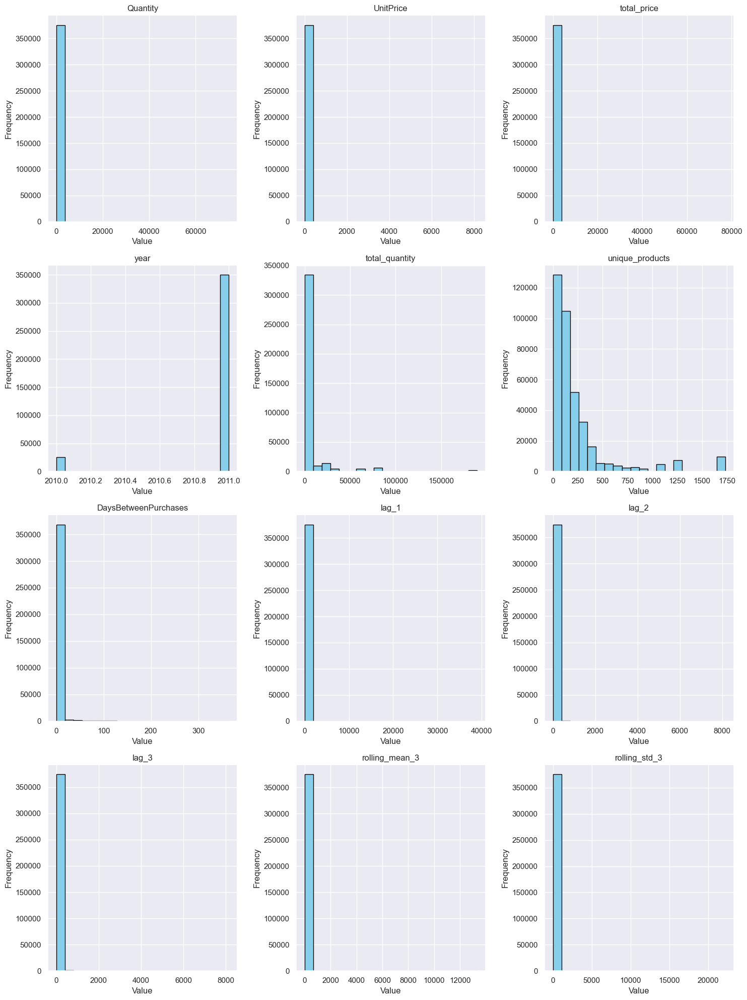

In [130]:
# Selecting numerical features
numerical_features = ['Quantity', 'UnitPrice', 'total_price', 'year', 'total_quantity', 'unique_products', 'DaysBetweenPurchases','lag_1', 'lag_2', 'lag_3', 'rolling_mean_3', 'rolling_std_3']

# Set up the layout for subplots
n_features = len(numerical_features)
n_cols = 3  # Number of columns in the subplot grid
n_rows = (n_features + n_cols - 1) // n_cols  # Calculate the number of rows

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()  # Flatten the 2D array of axes to 1D

# Plot histograms
for i, feature in enumerate(numerical_features):
    axes[i].hist(df[feature], bins=20, color='skyblue', edgecolor='black')
    axes[i].set_title(feature)
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

# Hide any unused subplots
for j in range(len(numerical_features), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

### Scaling

In [131]:
print(df.head())

      InvoiceNo                        Description  Quantity  UnitPrice  \
36527      2331     MEDIUM CERAMIC TOP STORAGE JAR     74215       1.04   
10257       615    BLACK CANDELABRA T-LIGHT HOLDER        12       2.10   
10258       615  AIRLINE BAG VINTAGE JET SET BROWN         4       4.25   
10259       615  COLOUR GLASS. STAR T-LIGHT HOLDER        12       3.25   
10260       615             MINI PAINT SET VINTAGE        36       0.65   

       CustomerID         Country  day_of_week  day_of_month  month  year  \
36527       12346  United Kingdom            1            18      1  2011   
10257       12347         Iceland            1             7     12  2010   
10258       12347         Iceland            1             7     12  2010   
10259       12347         Iceland            1             7     12  2010   
10260       12347         Iceland            1             7     12  2010   

       ...  total_quantity  unique_products  Target        Date  \
36527  ...         

In [132]:
from sklearn.preprocessing import StandardScaler

# Select numerical features to scale
numerical_features = ['Quantity', 'UnitPrice', 'total_price', 'year', 'total_quantity', 'unique_products', 'DaysBetweenPurchases','lag_1', 'lag_2', 'lag_3', 'rolling_mean_3', 'rolling_std_3']
scaler = StandardScaler()

# Scale numerical features
df[numerical_features] = scaler.fit_transform(df[numerical_features])

## Numerical Encoding for categorical feature

With a relatively small number of categories (like 36 countries), using simple numerical encoding can be sufficient. Embeddings might not provide a significant advantage and can add unnecessary complexity.

Numerical encoding is straightforward and faster to implement. It avoids the additional complexity of defining and training embeddings.

In [133]:
# Encode 'Country' column to numeric codes
df['Country'] = df['Country'].astype('category').cat.codes

In [134]:
# Check the mapping
country_mapping = dict(enumerate(df['Country'].astype('category').cat.categories))
print(country_mapping)

{0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9, 10: 10, 11: 11, 12: 12, 13: 13, 14: 14, 15: 15, 16: 16, 17: 17, 18: 18, 19: 19, 20: 20, 21: 21, 22: 22, 23: 23, 24: 24, 25: 25, 26: 26, 27: 27, 28: 28, 29: 29, 30: 30, 31: 31, 32: 32, 33: 33, 34: 34, 35: 35}


In [135]:
print(df.head())

      InvoiceNo                        Description    Quantity  UnitPrice  \
36527      2331     MEDIUM CERAMIC TOP STORAGE JAR  569.961756  -0.093142   
10257       615    BLACK CANDELABRA T-LIGHT HOLDER   -0.007605  -0.046200   
10258       615  AIRLINE BAG VINTAGE JET SET BROWN   -0.069055   0.049011   
10259       615  COLOUR GLASS. STAR T-LIGHT HOLDER   -0.007605   0.004727   
10260       615             MINI PAINT SET VINTAGE    0.176744  -0.110413   

       CustomerID  Country  day_of_week  day_of_month  month      year  ...  \
36527       12346       35            1            18      1  0.270915  ...   
10257       12347       16            1             7     12 -3.691192  ...   
10258       12347       16            1             7     12 -3.691192  ...   
10259       12347       16            1             7     12 -3.691192  ...   
10260       12347       16            1             7     12 -3.691192  ...   

       total_quantity  unique_products  Target        Date  \


## Encoding 'Description' column: Word2Vec for Text Embedding

To ensure that we have a backup of our DataFrame (df) for use with a second model, we will simply create a duplicate of it. This is useful for experimenting with different feature sets and preprocessing steps for our models without affecting the original DataFrame.

In [136]:
# Assuming 'df' is your original DataFrame
df_duplicate = df.copy()

In [137]:
df.to_csv('cleaned_df1.csv', index=False)

As we have a large number of unique categories in a categorical variable (such as Description), one-hot encoding can indeed lead to a very large number of columns, which can pose challenges in terms of computational efficiency, memory usage, and potentially model performance.

In [138]:
pip install gensim

Note: you may need to restart the kernel to use updated packages.


In [139]:
pip install keras

Note: you may need to restart the kernel to use updated packages.


In [140]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [141]:
import tensorflow as tf
from keras.layers import Embedding, Input, Flatten, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

In [142]:
import gensim
from gensim.models import Word2Vec
from sklearn.preprocessing import LabelEncoder
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Embedding

C:\ProgramData\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


Choosing the number of dimensions for the embedding vector (i.e., embedding_dim) in a Word2Vec model is an important decision that can affect the performance greatly. 

We will start with standard value. Many NLP tasks start with an embedding dimension between 50 and 300. A dimension of 100 (as used further) is a common default that balances expressiveness and computational efficiency.

For tasks that require less nuanced understanding of language (like basic sentiment analysis), lower dimensions (e.g., 50-100) are often sufficient. Higher dimensions increase memory usage and can slow down both training and inference. 

In [143]:
# Preprocess descriptions
descriptions = df['Description'].apply(lambda x: x.lower().split())

# Train Word2Vec model
w2v_model = Word2Vec(sentences=descriptions, vector_size=50, window=5, min_count=1, workers=4)

In [144]:
# Generate embeddings for each description
def get_w2v_embeddings(description):
    words = description.lower().split()
    embedding = np.mean([w2v_model.wv[word] for word in words if word in w2v_model.wv], axis=0)
    if isinstance(embedding, float):
        return np.zeros(w2v_model.vector_size)
    return embedding

df['w2v_embedding'] = df['Description'].apply(get_w2v_embeddings)

In [145]:
#Create Embedding Matrix
word_index = {'this': 1, 'is': 2, 'a': 3, 'sample': 4, 'sentence': 5}
embedding_dim = 50
embedding_matrix = np.zeros((len(word_index) + 1, embedding_dim))
for word, i in word_index.items():
    if word in w2v_model.wv:
        embedding_matrix[i] = w2v_model.wv[word]

In [146]:
# Convert the embeddings column to a DataFrame
w2v_embeddings_df = pd.DataFrame(df['w2v_embedding'].tolist(), index=df.index)

# Drop the original Description and w2v_embedding columns
df.drop(columns=['Description', 'w2v_embedding'], inplace=True)

# Concatenate the embeddings DataFrame with the original DataFrame
df = pd.concat([df, w2v_embeddings_df], axis=1)

In [147]:
print("DataFrame before PCA:")
print(df.head())

DataFrame before PCA:
      InvoiceNo    Quantity  UnitPrice  CustomerID  Country  day_of_week  \
36527      2331  569.961756  -0.093142       12346       35            1   
10257       615   -0.007605  -0.046200       12347       16            1   
10258       615   -0.069055   0.049011       12347       16            1   
10259       615   -0.007605   0.004727       12347       16            1   
10260       615    0.176744  -0.110413       12347       16            1   

       day_of_month  month      year  hour  ...        40        41        42  \
36527            18      1  0.270915    10  ...  0.157182  0.662959 -2.077591   
10257             7     12 -3.691192    14  ... -0.670030 -0.521287 -0.414706   
10258             7     12 -3.691192    14  ...  0.498326  0.725729 -0.465235   
10259             7     12 -3.691192    14  ... -0.653311  0.008152 -0.533197   
10260             7     12 -3.691192    14  ...  1.064729  1.555716 -1.356733   

             43        44        4

### Dimensionality Reduction on Word Embeddings

We will use dimensionality reduction technique - Principal Component Analysis (PCA), because higher-dimensional embeddings are not adding significant value to our model and they are causing overfitting as it was shown by the developed model.

In [148]:
from sklearn.decomposition import PCA

In [149]:
# Define the number of components for PCA
new_dim = 50  

In [150]:
# Get the embedding matrix from the DataFrame
embedding_matrix = w2v_embeddings_df.values

In [151]:
# Apply PCA for dimensionality reduction
def reduce_dimensions_and_explained_variance(embedding_matrix, new_dim):
    pca = PCA(n_components=new_dim)
    reduced_matrix = pca.fit_transform(embedding_matrix)
    explained_variance_ratio = pca.explained_variance_ratio_
    return reduced_matrix, explained_variance_ratio

In [152]:
# Apply PCA and get explained variance ratio
reduced_embedding_matrix, explained_variance_ratio = reduce_dimensions_and_explained_variance(embedding_matrix, new_dim)

In [153]:
# Print the explained variance ratio
print("Explained Variance Ratio for each component:")
print(explained_variance_ratio)

# Print the cumulative explained variance ratio
print("\nCumulative Explained Variance Ratio:")
print(np.cumsum(explained_variance_ratio))

Explained Variance Ratio for each component:
[0.16547441 0.11204991 0.0637163  0.05206462 0.04461629 0.04172648
 0.03880521 0.03339232 0.03132717 0.03049404 0.02699616 0.02481982
 0.02436493 0.02083119 0.02058302 0.01817029 0.01650536 0.01568919
 0.01390169 0.01266581 0.01232242 0.01144769 0.01138333 0.0102777
 0.01002331 0.00965206 0.00916935 0.00855395 0.00827819 0.00778261
 0.00746918 0.00721982 0.00663674 0.00641142 0.00619508 0.00595371
 0.00539232 0.00501262 0.00488433 0.00452325 0.00444072 0.00428029
 0.00414344 0.00405953 0.00378552 0.00329499 0.00313508 0.00296585
 0.00242524 0.00068599]

Cumulative Explained Variance Ratio:
[0.16547441 0.27752432 0.3412406  0.39330524 0.43792152 0.479648
 0.5184532  0.5518455  0.5831727  0.6136667  0.64066285 0.66548264
 0.6898476  0.71067876 0.7312618  0.7494321  0.76593745 0.78162664
 0.79552835 0.80819416 0.8205166  0.83196425 0.8433476  0.8536253
 0.8636486  0.8733007  0.88247    0.89102393 0.8993021  0.90708476
 0.91455394 0.92177373 0.9

### Visualize Explained Variance

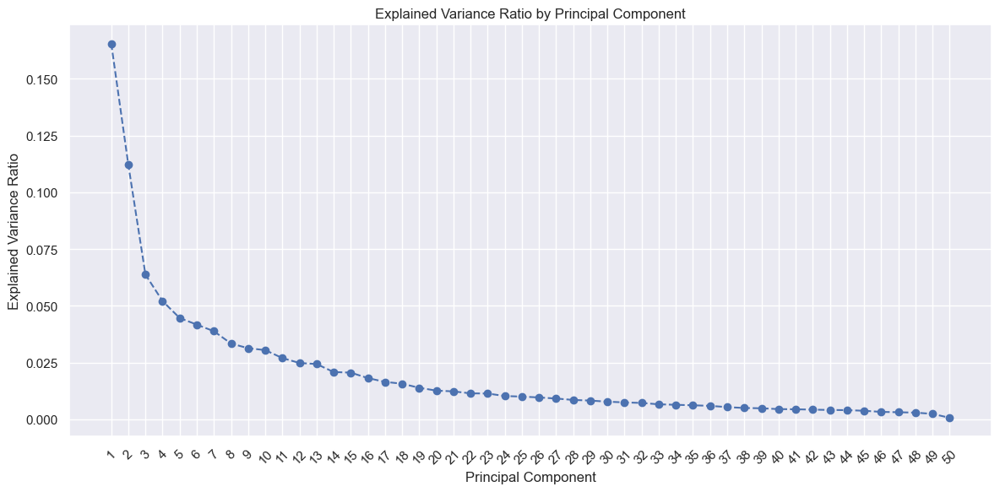

In [154]:
# Plot the explained variance ratio
plt.figure(figsize=(12, 6))
plt.plot(range(1, new_dim + 1), explained_variance_ratio, marker='o', linestyle='--')
plt.title('Explained Variance Ratio by Principal Component')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
# Rotate x-axis labels if necessary
plt.xticks(rotation=45)
plt.xticks(np.arange(1, new_dim + 1))
plt.grid(True)
plt.tight_layout()  # Adjust layout to ensure everything fits
plt.show()

In our case the first principal component explains 17% of the total variance. If a single principal component explains only 17% of the variance, it suggests that no single component captures a large portion of the data's variance.
This could indicate that our data is complex, and multiple components are necessary to adequately represent the variance.

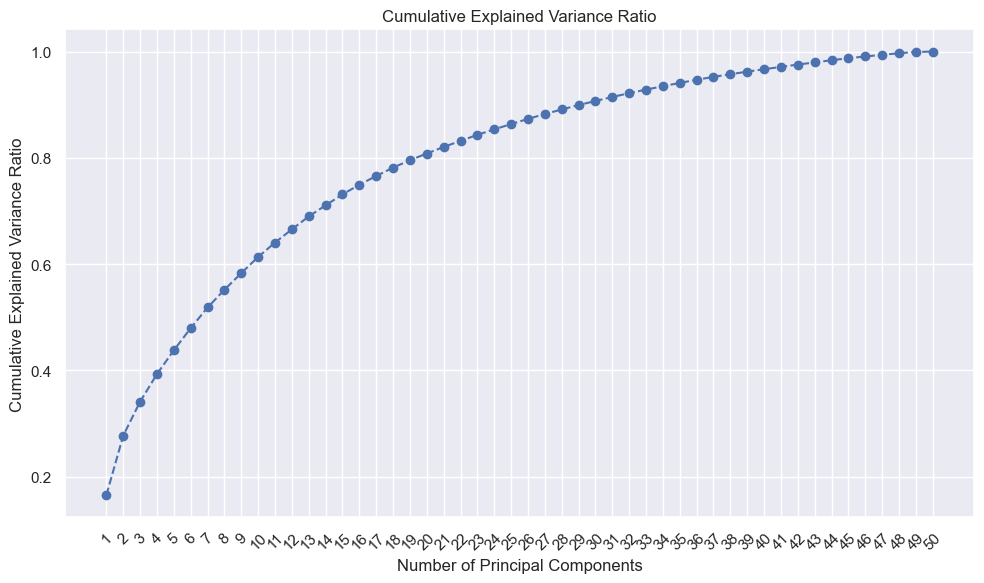

In [155]:
# Plot the cumulative explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(range(1, new_dim + 1), np.cumsum(explained_variance_ratio), marker='o', linestyle='--')
plt.title('Cumulative Explained Variance Ratio')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.xticks(rotation=45)
plt.xticks(np.arange(1, new_dim + 1))
plt.grid(True)
plt.tight_layout() 
plt.show()

To understand how many components are needed to capture a significant portion of the variance, you will look at the cumulative explained variance. 

- 1.0 for 47 components: This means that the first 47 principal components together capture 99% of the total variance in your dataset. This indicates that using 50 components is sufficient to represent most of the variance in your data.

- 0.1 for 1 component: This suggests that a single principal component captures around 10% of the total variance. This is a relatively small amount, indicating that no single component is sufficient to capture a significant portion of the variance on its own.

- 0.8 for 19 components: This means that the first 19 principal components together capture 80% of the total variance. This is a substantial amount of variance and suggests that 19 components can represent the majority of the variance in your data.

Since 19 components capture 80% of the variance, we could use around 19 components to achieve a good balance between dimensionality and variance captured. This reduces the complexity of your data while still retaining a significant portion of the variance.

In [156]:
# Define the new dimension for PCA
new_dim = 19

In [157]:
# Assuming `embedding_matrix` is your data matrix
def reduce_dimensions(embedding_matrix, n_components):
    pca = PCA(n_components=n_components)
    reduced_matrix = pca.fit_transform(embedding_matrix)
    return reduced_matrix

In [158]:
# Get the embedding matrix and apply PCA
embedding_matrix = w2v_embeddings_df.values
reduced_embedding_matrix = reduce_dimensions(embedding_matrix, new_dim)

In [159]:
# Create a new DataFrame for reduced embeddings
reduced_embeddings_df = pd.DataFrame(
    reduced_embedding_matrix, 
    index=df.index, 
    columns=[f'PC{i+1}' for i in range(new_dim)]
)

In [160]:
# Check column names
print(df.columns.tolist())
print(df.columns)

['InvoiceNo', 'Quantity', 'UnitPrice', 'CustomerID', 'Country', 'day_of_week', 'day_of_month', 'month', 'year', 'hour', 'total_price', 'total_quantity', 'unique_products', 'Target', 'Date', 'DaysBetweenPurchases', 'lag_1', 'lag_2', 'lag_3', 'rolling_mean_3', 'rolling_std_3', 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
Index([           'InvoiceNo',             'Quantity',            'UnitPrice',
                 'CustomerID',              'Country',          'day_of_week',
               'day_of_month',                'month',                 'year',
                       'hour',          'total_price',       'total_quantity',
            'unique_products',               'Target',                 'Date',
       'DaysBetweenPurchases',                'lag_1',                'lag_2',
                      'lag_3',       'rolling_mean_3',      

In [161]:
# Convert column names to strings if they are numeric
df.columns = df.columns.astype(str)

In [162]:
# Drop the original high-dimensional embeddings
# Assuming your original high-dimensional columns are from 0 to 49
embedding_columns = [str(i) for i in range(50)]  # Adjust if different
existing_columns = [col for col in embedding_columns if col in df.columns]
print("Columns to drop:", existing_columns)


Columns to drop: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49']


In [163]:
# Drop the identified columns
df_dropped = df.drop(columns=existing_columns, errors='ignore')

In [164]:
# Print the columns after dropping
print("Columns after dropping high-dimensional embeddings:")
print(df_dropped.columns.tolist())

Columns after dropping high-dimensional embeddings:
['InvoiceNo', 'Quantity', 'UnitPrice', 'CustomerID', 'Country', 'day_of_week', 'day_of_month', 'month', 'year', 'hour', 'total_price', 'total_quantity', 'unique_products', 'Target', 'Date', 'DaysBetweenPurchases', 'lag_1', 'lag_2', 'lag_3', 'rolling_mean_3', 'rolling_std_3']


In [165]:
# Concatenate the reduced embeddings with the DataFrame after dropping original embeddings
df = pd.concat([df_dropped, reduced_embeddings_df], axis=1)

In [166]:
print("DataFrame after PCA:")
print(df.head())

DataFrame after PCA:
      InvoiceNo    Quantity  UnitPrice  CustomerID  Country  day_of_week  \
36527      2331  569.961756  -0.093142       12346       35            1   
10257       615   -0.007605  -0.046200       12347       16            1   
10258       615   -0.069055   0.049011       12347       16            1   
10259       615   -0.007605   0.004727       12347       16            1   
10260       615    0.176744  -0.110413       12347       16            1   

       day_of_month  month      year  hour  ...      PC10      PC11      PC12  \
36527            18      1  0.270915    10  ... -0.946128 -1.500304  0.469704   
10257             7     12 -3.691192    14  ... -0.525865 -0.132345  0.004239   
10258             7     12 -3.691192    14  ... -0.628749 -0.298470 -0.043603   
10259             7     12 -3.691192    14  ...  0.446727 -0.898480 -0.264139   
10260             7     12 -3.691192    14  ... -0.343237 -0.875475 -0.088337   

           PC13      PC14      PC15

In [167]:
# Save the dataset
df.to_csv('cleaned_after_pca1.csv', index=False)

### Prepare Data for LSTM Input

Preparation of the data in the format that LSTM expects, which is typically a 3D array: `(samples, timesteps, features)`.

## Creating Sequences (Supervised Learning Format)

We will convert time series data into sequences of 12-month histories with a corresponding target label indicating whether a purchase was made in the 13th month and separate features and the label.

In [168]:
df = pd.read_csv('cleaned_after_pca1.csv')

In [169]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 375465 entries, 0 to 375464
Data columns (total 40 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   InvoiceNo             375465 non-null  int64  
 1   Quantity              375465 non-null  float64
 2   UnitPrice             375465 non-null  float64
 3   CustomerID            375465 non-null  int64  
 4   Country               375465 non-null  int64  
 5   day_of_week           375465 non-null  int64  
 6   day_of_month          375465 non-null  int64  
 7   month                 375465 non-null  int64  
 8   year                  375465 non-null  float64
 9   hour                  375465 non-null  int64  
 10  total_price           375465 non-null  float64
 11  total_quantity        375465 non-null  float64
 12  unique_products       375465 non-null  float64
 13  Target                375465 non-null  int64  
 14  Date                  375465 non-null  object 
 15  

In [170]:
print(df.columns)

Index(['InvoiceNo', 'Quantity', 'UnitPrice', 'CustomerID', 'Country',
       'day_of_week', 'day_of_month', 'month', 'year', 'hour', 'total_price',
       'total_quantity', 'unique_products', 'Target', 'Date',
       'DaysBetweenPurchases', 'lag_1', 'lag_2', 'lag_3', 'rolling_mean_3',
       'rolling_std_3', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8',
       'PC9', 'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17',
       'PC18', 'PC19'],
      dtype='object')


In [171]:
# Check data types
data_types = df.dtypes
print(data_types)

InvoiceNo                 int64
Quantity                float64
UnitPrice               float64
CustomerID                int64
Country                   int64
day_of_week               int64
day_of_month              int64
month                     int64
year                    float64
hour                      int64
total_price             float64
total_quantity          float64
unique_products         float64
Target                    int64
Date                     object
DaysBetweenPurchases    float64
lag_1                   float64
lag_2                   float64
lag_3                   float64
rolling_mean_3          float64
rolling_std_3           float64
PC1                     float64
PC2                     float64
PC3                     float64
PC4                     float64
PC5                     float64
PC6                     float64
PC7                     float64
PC8                     float64
PC9                     float64
PC10                    float64
PC11    

In [172]:
# Convert InvoiceDate to datetime and sort data
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values(by=['CustomerID', 'Date'])

In [173]:
# After sorting, remove the column so it doesn't end up in the LSTM sequences
# Drop redundant columns
df = df.drop(columns=['Date', 'InvoiceNo'])

In [174]:
# Convert all columns to numeric (coerce errors to NaN)
df = df.apply(pd.to_numeric, errors='coerce')

# Convert all columns to float32
df = df.astype(np.float32)

In [175]:
print(df.columns)
print(df.info())

Index(['Quantity', 'UnitPrice', 'CustomerID', 'Country', 'day_of_week',
       'day_of_month', 'month', 'year', 'hour', 'total_price',
       'total_quantity', 'unique_products', 'Target', 'DaysBetweenPurchases',
       'lag_1', 'lag_2', 'lag_3', 'rolling_mean_3', 'rolling_std_3', 'PC1',
       'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11',
       'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18', 'PC19'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
Int64Index: 375465 entries, 0 to 375464
Data columns (total 38 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Quantity              375465 non-null  float32
 1   UnitPrice             375465 non-null  float32
 2   CustomerID            375465 non-null  float32
 3   Country               375465 non-null  float32
 4   day_of_week           375465 non-null  float32
 5   day_of_month          375465 non-null  float32
 6   month 

In [176]:
# Check the result
print(df.dtypes)
print(df.head())

Quantity                float32
UnitPrice               float32
CustomerID              float32
Country                 float32
day_of_week             float32
day_of_month            float32
month                   float32
year                    float32
hour                    float32
total_price             float32
total_quantity          float32
unique_products         float32
Target                  float32
DaysBetweenPurchases    float32
lag_1                   float32
lag_2                   float32
lag_3                   float32
rolling_mean_3          float32
rolling_std_3           float32
PC1                     float32
PC2                     float32
PC3                     float32
PC4                     float32
PC5                     float32
PC6                     float32
PC7                     float32
PC8                     float32
PC9                     float32
PC10                    float32
PC11                    float32
PC12                    float32
PC13    

In [177]:
# Define sequence length (12 months) and prediction horizon (13th month)
seq_length = 12
horizon = 1

In [178]:
# Prepare sequences and labels
def create_sequences(data, seq_length, horizon):
    X, y = [], []
    for i in range(len(data) - seq_length - horizon + 1):
        # Creating the sequence of past data
        X.append(data.iloc[i:i + seq_length].drop(columns=['Target']).values)
        # Creating the label for the prediction horizon
        y.append(data.iloc[i + seq_length + horizon - 1]['Target'])
    return np.array(X), np.array(y)

In [179]:
# Group by CustomerID and create sequences for each customer
sequences = []
labels = []

for _, group in df.groupby('CustomerID'):
    # Remove CustomerID if present in the group data
    group = group.drop(columns=['CustomerID'], errors='ignore')
    X, y = create_sequences(group, seq_length, horizon)
    sequences.append(X)
    labels.append(y)

In [180]:
# Check shapes of sequences and labels
for idx, (seq, lbl) in enumerate(zip(sequences, labels)):
    print(f'Index: {idx}, Sequences shape: {seq.shape}, Labels shape: {lbl.shape}')


Index: 0, Sequences shape: (0,), Labels shape: (0,)
Index: 1, Sequences shape: (159, 12, 36), Labels shape: (159,)
Index: 2, Sequences shape: (19, 12, 36), Labels shape: (19,)
Index: 3, Sequences shape: (61, 12, 36), Labels shape: (61,)
Index: 4, Sequences shape: (5, 12, 36), Labels shape: (5,)
Index: 5, Sequences shape: (73, 12, 36), Labels shape: (73,)
Index: 6, Sequences shape: (0,), Labels shape: (0,)
Index: 7, Sequences shape: (46, 12, 36), Labels shape: (46,)
Index: 8, Sequences shape: (1, 12, 36), Labels shape: (1,)
Index: 9, Sequences shape: (47, 12, 36), Labels shape: (47,)
Index: 10, Sequences shape: (119, 12, 36), Labels shape: (119,)
Index: 11, Sequences shape: (0,), Labels shape: (0,)
Index: 12, Sequences shape: (233, 12, 36), Labels shape: (233,)
Index: 13, Sequences shape: (117, 12, 36), Labels shape: (117,)
Index: 14, Sequences shape: (0,), Labels shape: (0,)
Index: 15, Sequences shape: (224, 12, 36), Labels shape: (224,)
Index: 16, Sequences shape: (46, 12, 36), Labels

Ensure that the sequences and labels are consistent in their dimensions. The expected shape of X should be (number of samples, sequence length, number of features) and y should be (number of samples,).

In [181]:
# Filter out empty sequences
sequences = [seq for seq in sequences if seq.size > 0]
labels = [lbl for lbl in labels if lbl.size > 0]

# Check if all remaining sequences have consistent shapes
for idx, (seq, lbl) in enumerate(zip(sequences, labels)):
    print(f'Index: {idx}, Sequences shape: {seq.shape}, Labels shape: {lbl.shape}')

Index: 0, Sequences shape: (159, 12, 36), Labels shape: (159,)
Index: 1, Sequences shape: (19, 12, 36), Labels shape: (19,)
Index: 2, Sequences shape: (61, 12, 36), Labels shape: (61,)
Index: 3, Sequences shape: (5, 12, 36), Labels shape: (5,)
Index: 4, Sequences shape: (73, 12, 36), Labels shape: (73,)
Index: 5, Sequences shape: (46, 12, 36), Labels shape: (46,)
Index: 6, Sequences shape: (1, 12, 36), Labels shape: (1,)
Index: 7, Sequences shape: (47, 12, 36), Labels shape: (47,)
Index: 8, Sequences shape: (119, 12, 36), Labels shape: (119,)
Index: 9, Sequences shape: (233, 12, 36), Labels shape: (233,)
Index: 10, Sequences shape: (117, 12, 36), Labels shape: (117,)
Index: 11, Sequences shape: (224, 12, 36), Labels shape: (224,)
Index: 12, Sequences shape: (46, 12, 36), Labels shape: (46,)
Index: 13, Sequences shape: (10, 12, 36), Labels shape: (10,)
Index: 14, Sequences shape: (154, 12, 36), Labels shape: (154,)
Index: 15, Sequences shape: (51, 12, 36), Labels shape: (51,)
Index: 16,

In [182]:
# After filtering and verifying, concatenate the sequences and labels. 
# They should all have consistent dimensions after filtering out the empty ones.
# Convert lists to numpy arrays
X = np.concatenate(sequences, axis=0)
y = np.concatenate(labels, axis=0)

In [183]:
# Check shapes
print(f'X shape: {X.shape}')  # (number of samples, sequence length, number of features)
print(f'y shape: {y.shape}')

# X is ready to be used as input for LSTM model

X shape: (328135, 12, 36)
y shape: (328135,)


## Splitting Data

In [184]:
# import packages
from sklearn.model_selection import train_test_split

Combining a fixed number of epochs with early stopping is a common strategy for training neural networks, including LSTM models. However, if not handled carefully, it can potentially lead to data leakage or misleading results. Thus, we will use a separate validation set during the initial training and early stopping. This validation set is used to monitor the performance of the model and make decisions about early stopping. The test set should be completely separate and not used in any way during training, validation, or early stopping.

In [185]:
# Split the dataset
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [186]:
print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'X_val shape: {X_val.shape}')
print(f'y_val shape: {y_val.shape}')
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')

X_train shape: (229694, 12, 36)
y_train shape: (229694,)
X_val shape: (49220, 12, 36)
y_val shape: (49220,)
X_test shape: (49221, 12, 36)
y_test shape: (49221,)


## 1. LSTM Model Building

We will train the model for a fixed number of epochs initially to establish a baseline. This step does not involve early stopping and is just to get a preliminary understanding of the model’s performance.

In [187]:
# import packages
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, LSTM, Dropout, Dense, Bidirectional
from keras.optimizers import Adam

As our data has 36 features per time step (X shape: (328135, 12, 36)), the correct input shape should be (12, 36).

As we are dealing with binary classification (predicting whether a customer will make a purchase in the 13th month or not), we should use a sigmoid activation function in the output layer. 

In [188]:
# Define your model using a Sequential API
model = Sequential()

# Add an Input layer specifying the shape of your input data
model.add(Input(shape=(12,36)))  # Adjust the input shape according to the number of features
model.add(Dropout(0.2))  # Dropout layer  with a rate of 20% to prevent overfitting
# Add an LSTM layer
model.add(LSTM(50, return_sequences=False))  # LSTM layer with 50 units
# Add a Dense layer for binary classification
model.add(Dense(1, activation='sigmoid'))  # Output layer for binary classification

For binary classification tasks, binary_crossentropy is the appropriate loss function.

In [189]:
# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [190]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dropout (Dropout)               │ (None, 12, 36)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 50)             │        17,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,451 (68.17 KB)

 Trainable params: 17,451 (68.17 KB)

 Non-trainable params: 0 (0.00 B)

## LSTM Initial Training and Evaluation

In [191]:
#Check Data Types and Shapes as TensorFlow expects numerical types like float32 or float64 for its computations
print(f'X_train dtype: {X_train.dtype}, y_train dtype: {y_train.dtype}')
print(f'X_train shape: {X_train.shape}, y_train shape: {y_train.shape}')

X_train dtype: float32, y_train dtype: float32
X_train shape: (229694, 12, 36), y_train shape: (229694,)


In [192]:
# Convert X_train to float32
X_train = np.array(X_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32) 

In [193]:
# Fit the model
history = model.fit(
    X_train, y_train,
    epochs=20,  # Start with a large number
    batch_size=32,
    validation_data=(X_val, y_val),  # Use the validation set for evaluation during training
    shuffle=False  # Set shuffle=False to avoid randomization during training
)

Epoch 1/20
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 26s 4ms/step - accuracy: 0.7205 - loss: 0.5438 - val_accuracy: 0.7493 - val_loss: 0.5080
Epoch 2/20
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 25s 3ms/step - accuracy: 0.7497 - loss: 0.4967 - val_accuracy: 0.7577 - val_loss: 0.4838
Epoch 3/20
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 24s 3ms/step - accuracy: 0.7622 - loss: 0.4803 - val_accuracy: 0.7665 - val_loss: 0.4758
Epoch 4/20
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 25s 3ms/step - accuracy: 0.7693 - loss: 0.4697 - val_accuracy: 0.7724 - val_loss: 0.4717
Epoch 5/20
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 24s 3ms/step - accuracy: 0.7743 - loss: 0.4623 - val_accuracy: 0.7784 - val_loss: 0.4559
Epoch 6/20
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 25s 3ms/step - accuracy: 0.7788 - loss: 0.4556 - val_accuracy: 0.7856 - val_loss: 0.4500
Epoch 7/20
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 25s 3ms/step - accuracy: 0.7823 - loss: 0.4514 - val_accuracy: 0.7927 - val_loss: 0.4436
Epoch 8/20
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 25s 3ms/step - accuracy: 0.7863 - loss: 0

In [194]:
# Evaluate model
initial_loss = model.evaluate(X_test, y_test)
print(f'Initial Test Loss: {initial_loss}')

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8120 - loss: 0.4070
Initial Test Loss: [0.40580087900161743, 0.8118079900741577]


In [195]:
# generate predictions
y_pred = model.predict(X_test)

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


Converting probabilities to class labels is essential in classification tasks when using models that output probabilities, such as LSTMs with a sigmoid activation function in the final layer. To interpret these probabilities as class predictions (0 or 1), we need to apply a threshold. The common threshold for binary classification is 0.5. If the predicted probability for the positive class is greater than 0.5, the prediction is class 1; otherwise, it is class 0.

In [196]:
# Convert probabilities to class labels (0 or 1)
y_pred = (y_pred > 0.5).astype(int)

### LSTM Model Performance Metrics during Initial Training

In [197]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [198]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.8118079681436785
Precision: 0.8246412436201871
Recall: 0.8118079681436785
F1 Score: 0.8012393277098978


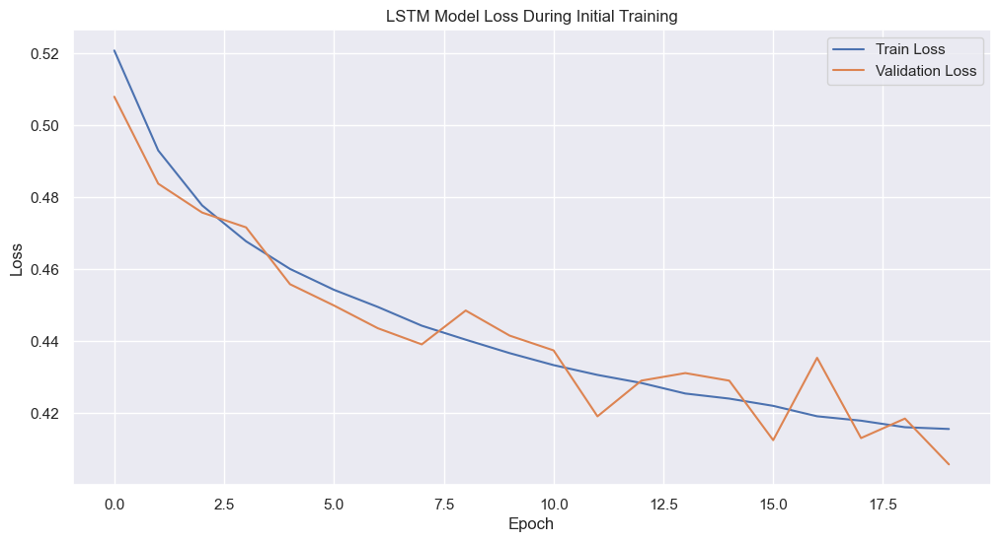

In [199]:
# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('LSTM Model Loss During Initial Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

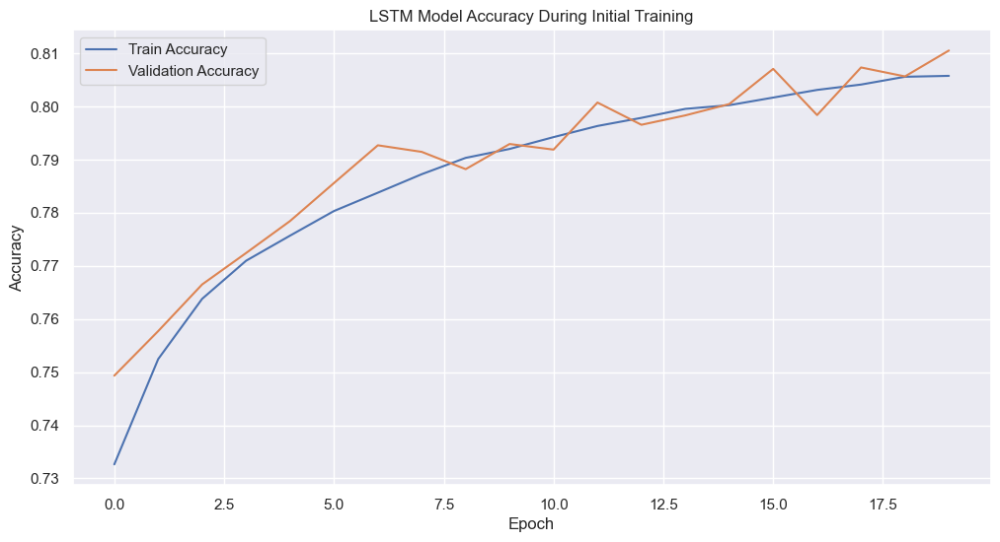

In [200]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('LSTM Model Accuracy During Initial Training')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

#### Confusion Matrix

In [201]:
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

In [202]:
# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, 
                     index=['Actual Negative', 'Actual Positive'], 
                     columns=['Predicted Negative', 'Predicted Positive'])

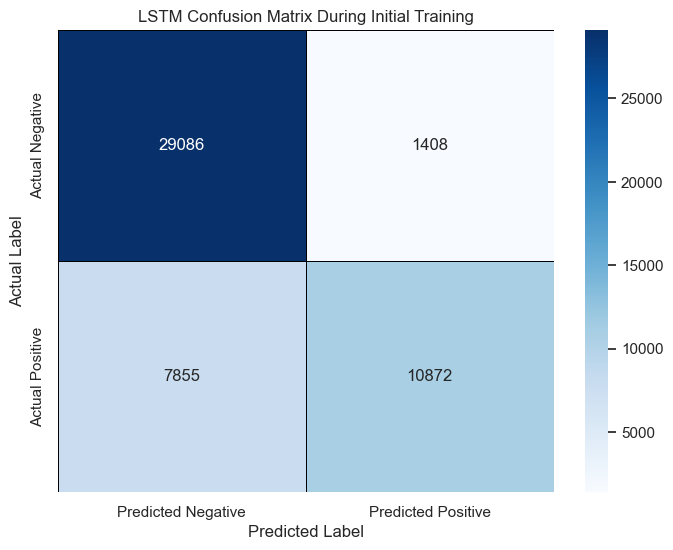

In [203]:
# Plot the confusion matrix heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', 
            linewidths=0.5, linecolor='black')
plt.title('LSTM Confusion Matrix During Initial Training')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.show()

In [204]:
# Extract individual metrics
TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

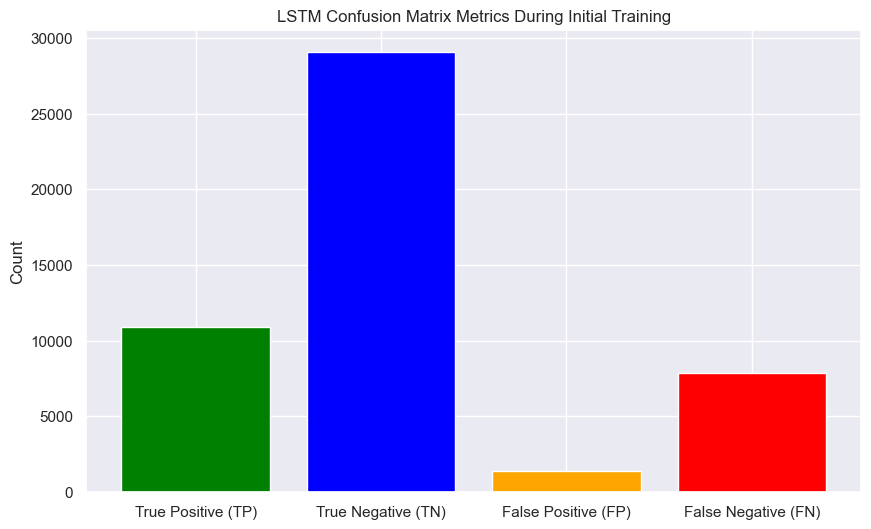

In [205]:
# Create a bar plot for these metrics
metrics = [TP, TN, FP, FN]
metrics_names = ['True Positive (TP)', 'True Negative (TN)', 'False Positive (FP)', 'False Negative (FN)']

plt.figure(figsize=(10, 6))
plt.bar(metrics_names, metrics, color=['green', 'blue', 'orange', 'red'])
plt.title('LSTM Confusion Matrix Metrics During Initial Training')
plt.ylabel('Count')
plt.show()

# Hyperparameter tuning

After initial training, we decide to use early stopping and reinitializing the model. It is crucial to ensure that the validation data used for early stopping is kept separate from any data used previously. After fine-tuning with early stopping, we will evaluate the model's final performance on the untouched test set. This ensures that the test set remains unbiased and reflects the true performance of the model.

### Adjusting Epochs Based on Early Stopping

We will implement early stopping to halt training when the model performance stops improving on the validation set, which helps prevent overfitting.

In [206]:
from keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.callbacks import Callback

In [207]:
# Set up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [208]:
# Reduce learning rate when a metric has stopped improving
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.001)

In [209]:
class LearningRateTracker(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if logs is None:
            logs = {}
        # Log learning rate
        lr = self.model.optimizer.learning_rate
        if isinstance(lr, tf.keras.optimizers.schedules.LearningRateSchedule):
            lr = lr(self.model.optimizer.iterations)
        logs['lr'] = float(lr.numpy())  # Convert to float for plotting

# Instantiate the custom callback
lr_tracker = LearningRateTracker()

In [210]:
# Fit the model
history_fine_tune = model.fit(
    X_train, y_train,
    epochs=50,  # Start with a large number
    batch_size=32,
    validation_data=(X_val, y_val),
    shuffle=False,
    callbacks=[early_stopping, reduce_lr, lr_tracker]
)

Epoch 1/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 25s 4ms/step - accuracy: 0.8074 - loss: 0.4133 - val_accuracy: 0.8119 - val_loss: 0.4083 - learning_rate: 0.0010 - lr: 0.0010
Epoch 2/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 25s 4ms/step - accuracy: 0.8084 - loss: 0.4120 - val_accuracy: 0.8107 - val_loss: 0.4066 - learning_rate: 0.0010 - lr: 0.0010
Epoch 3/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 25s 3ms/step - accuracy: 0.8081 - loss: 0.4118 - val_accuracy: 0.8120 - val_loss: 0.4024 - learning_rate: 0.0010 - lr: 0.0010
Epoch 4/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 25s 3ms/step - accuracy: 0.8096 - loss: 0.4088 - val_accuracy: 0.8126 - val_loss: 0.4094 - learning_rate: 0.0010 - lr: 0.0010
Epoch 5/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 26s 4ms/step - accuracy: 0.8100 - loss: 0.4084 - val_accuracy: 0.8157 - val_loss: 0.3994 - learning_rate: 0.0010 - lr: 0.0010
Epoch 6/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 26s 4ms/step - accuracy: 0.8107 - loss: 0.4071 - val_accuracy: 0.8144 - val_loss: 0.4014 - learning_rate: 0.0010 - lr:

In [211]:
# Print the model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dropout (Dropout)               │ (None, 12, 36)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 50)             │        17,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 52,355 (204.52 KB)

 Trainable params: 17,451 (68.17 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 34,904 (136.35 KB)

In [212]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8149 - loss: 0.4004
Test Loss: 0.39824333786964417
Test Accuracy: 0.8155665397644043


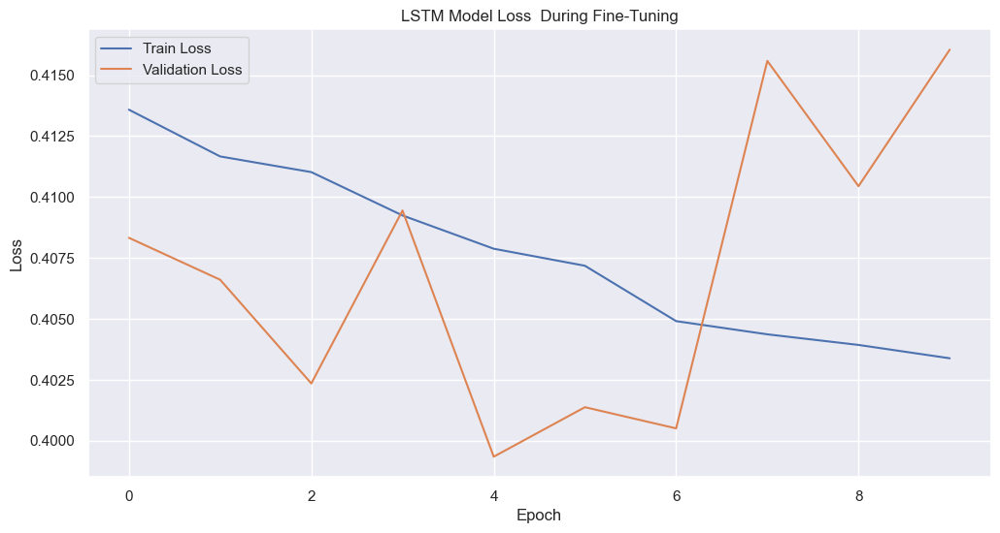

In [213]:
# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history_fine_tune.history['loss'], label='Train Loss')
plt.plot(history_fine_tune.history['val_loss'], label='Validation Loss')
plt.title('LSTM Model Loss  During Fine-Tuning')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

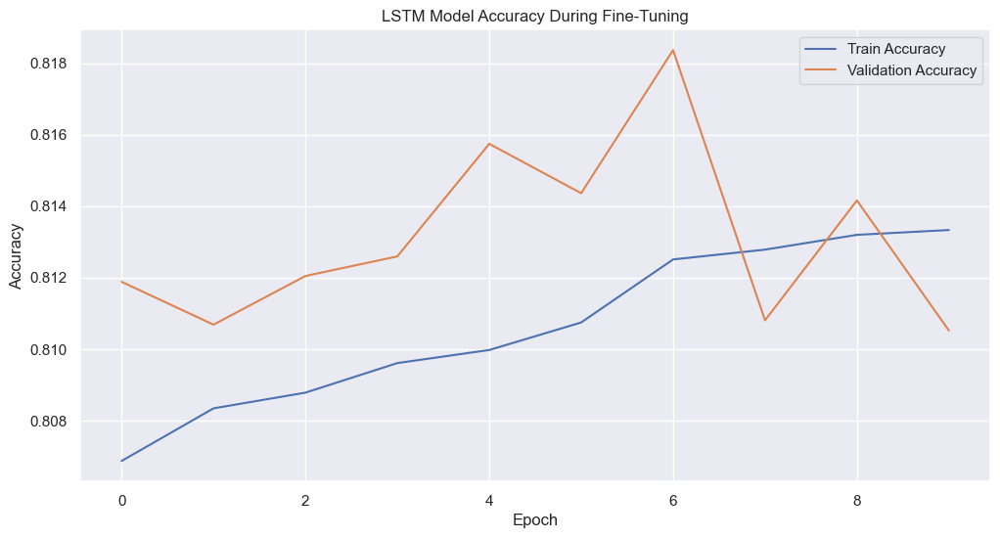

In [214]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history_fine_tune.history['accuracy'], label='Train Accuracy')
plt.plot(history_fine_tune.history['val_accuracy'], label='Validation Accuracy')
plt.title('LSTM Model Accuracy During Fine-Tuning')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [215]:
# Evaluate model
final_loss = model.evaluate(X_test, y_test)
print(f'Final Test Loss: {final_loss}')

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8149 - loss: 0.4004
Final Test Loss: [0.39824333786964417, 0.8155665397644043]


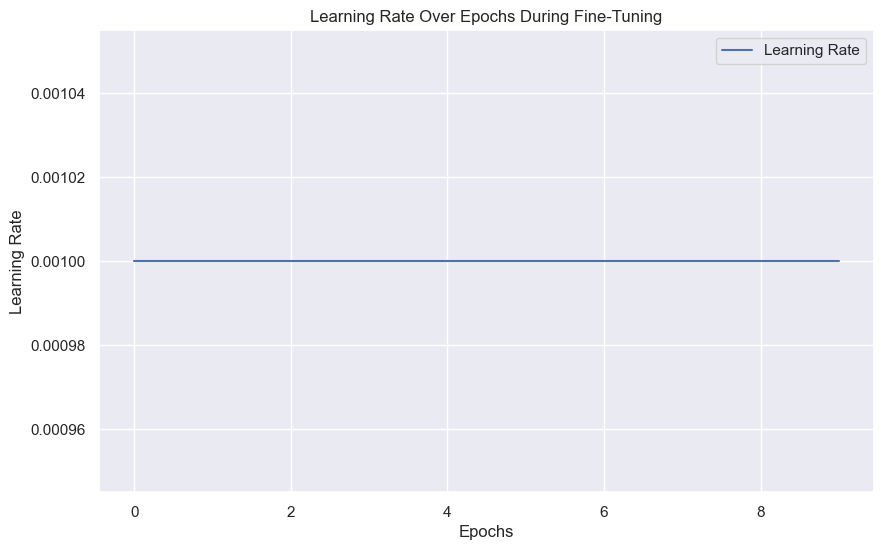

In [216]:
# Extract learning rates from the history
lr_values = history_fine_tune.history.get('lr', [])

# Plot learning rate over epochs
plt.figure(figsize=(10, 6))
plt.plot(lr_values, label='Learning Rate')
plt.title('Learning Rate Over Epochs During Fine-Tuning')
plt.xlabel('Epochs')
plt.ylabel('Learning Rate')
plt.legend()
plt.show()

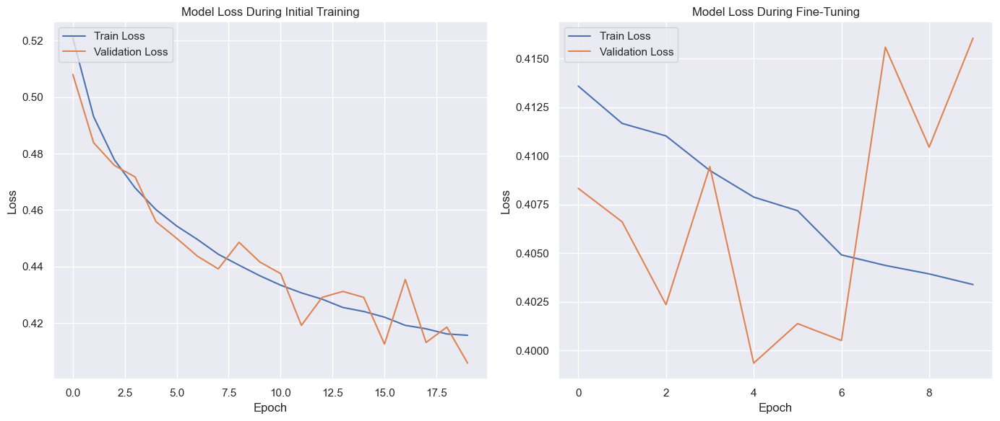

In [217]:
# Create a figure with 2 subplots
plt.figure(figsize=(14, 6))

# Plot training & validation loss values from initial training in the first subplot
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Initial Training')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper left')

# Plot training & validation loss values from fine-tuning in the second subplot
plt.subplot(1, 2, 2)
plt.plot(history_fine_tune.history['loss'], label='Train Loss')
plt.plot(history_fine_tune.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Fine-Tuning')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper left')

# Show the plots
plt.tight_layout()
plt.show()

In [218]:
# generate predictions
y_pred = model.predict(X_test)

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


Converting probabilities to class labels is essential in classification tasks when using models that output probabilities, such as LSTMs with a sigmoid activation function in the final layer. To interpret these probabilities as class predictions (0 or 1), we need to apply a threshold. The common threshold for binary classification is 0.5. If the predicted probability for the positive class is greater than 0.5, the prediction is class 1; otherwise, it is class 0.

In [219]:
# Convert probabilities to class labels (0 or 1)
y_pred = (y_pred > 0.5).astype(int)

In [220]:
# Save the weights of the original model
model.save_weights('model_weights.weights.h5')

In [221]:
# Save the entire model (architecture + weights)
model.save('model.keras')

### 2. New Architecture with Layer Optimization

In [222]:
# Reinitialize the Model with New Architecture
# Define your new model with additional layers
new_model = Sequential()
new_model.add(Input(shape=(12, 36)))  # Input layer
new_model.add(LSTM(50, return_sequences=True))  # First LSTM layer
new_model.add(Dropout(0.3))  # Dropout layer
new_model.add(LSTM(30))  # Second LSTM layer
new_model.add(Dropout(0.3))  # Dropout layer
new_model.add(Dense(64, activation='relu'))  # Dense layer
new_model.add(Dense(32, activation='relu'))  # Additional Dense layer
new_model.add(Dense(1, activation='sigmoid'))  # Output layer for binary classification

# Compile the model
new_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [223]:
history = new_model.fit(
    X_train, y_train,
    epochs=25, 
    batch_size=32,
    validation_data=(X_val, y_val),
    shuffle=False,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/25
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 47s 6ms/step - accuracy: 0.7245 - loss: 0.5374 - val_accuracy: 0.7536 - val_loss: 0.4884 - learning_rate: 0.0010
Epoch 2/25
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 43s 6ms/step - accuracy: 0.7546 - loss: 0.4861 - val_accuracy: 0.7762 - val_loss: 0.4563 - learning_rate: 0.0010
Epoch 3/25
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 43s 6ms/step - accuracy: 0.7719 - loss: 0.4636 - val_accuracy: 0.7866 - val_loss: 0.4420 - learning_rate: 0.0010
Epoch 4/25
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 43s 6ms/step - accuracy: 0.7856 - loss: 0.4444 - val_accuracy: 0.7906 - val_loss: 0.4363 - learning_rate: 0.0010
Epoch 5/25
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 43s 6ms/step - accuracy: 0.7962 - loss: 0.4273 - val_accuracy: 0.7924 - val_loss: 0.4367 - learning_rate: 0.0010


In [224]:
# Evaluate the model on the test set
test_loss, test_accuracy = new_model.evaluate(X_test, y_test)
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7536 - loss: 0.4897
Test Loss: 0.4889530539512634
Test Accuracy: 0.7536823749542236


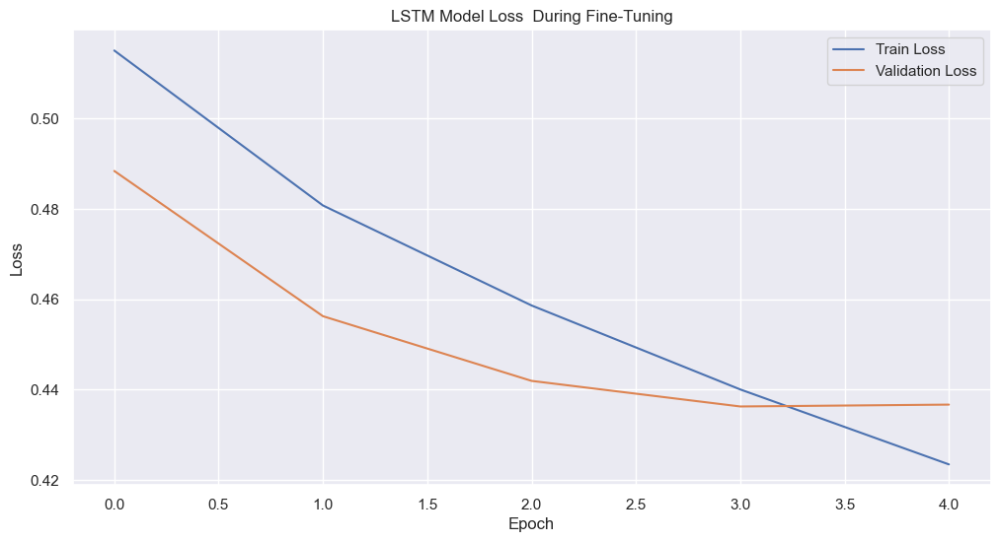

In [225]:
# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('LSTM Model Loss  During Fine-Tuning')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

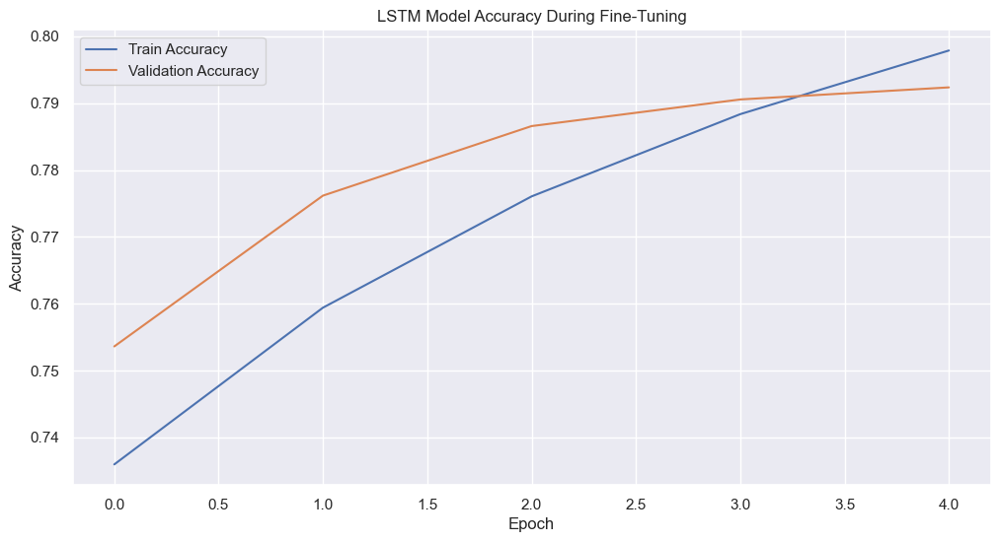

In [226]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('LSTM Model Accuracy During Fine-Tuning')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [227]:
# Evaluate model
final_loss = new_model.evaluate(X_test, y_test)
print(f'Final Test Loss: {final_loss}')

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7536 - loss: 0.4897
Final Test Loss: [0.4889530539512634, 0.7536823749542236]


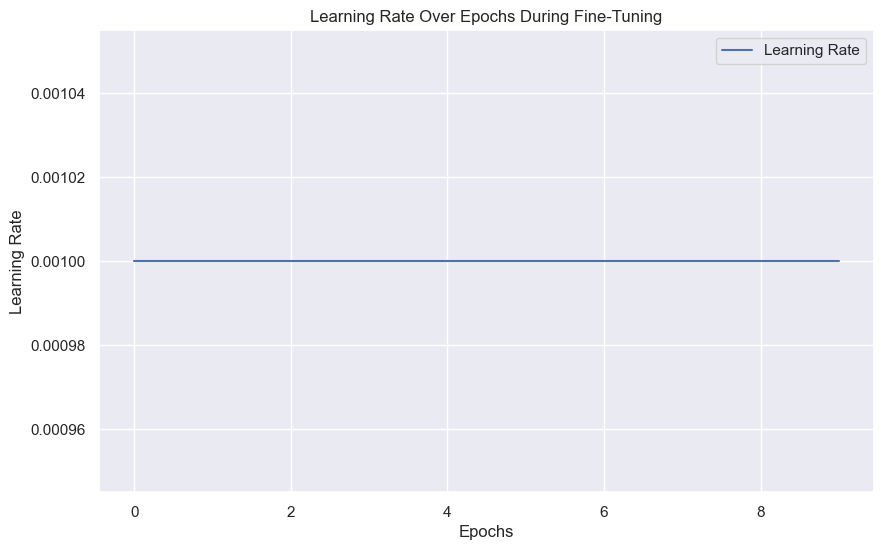

In [228]:
# Extract learning rates from the history
lr_values = history_fine_tune.history.get('lr', [])

# Plot learning rate over epochs
plt.figure(figsize=(10, 6))
plt.plot(lr_values, label='Learning Rate')
plt.title('Learning Rate Over Epochs During Fine-Tuning')
plt.xlabel('Epochs')
plt.ylabel('Learning Rate')
plt.legend()
plt.show()

## 3. LSTM Model

In [229]:
from tensorflow.keras import regularizers

We will implement Recurrent Layer - Bidirectional LSTM, which helps the model learn from both past and future context.

L2 Regularization: will be added to Dense layers to prevent overfitting.

In [230]:
# Define the model with additional changes
new2_model = Sequential()
new2_model.add(Input(shape=(12, 36)))
new2_model.add(Bidirectional(LSTM(100, return_sequences=True)))
new2_model.add(Dropout(0.3))
new2_model.add(Bidirectional(LSTM(50))) #Recurrent Layer
new2_model.add(Dropout(0.3))
new2_model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
new2_model.add(Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
new2_model.add(Dense(1, activation='sigmoid'))

In [231]:
# Compile the model
new2_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [232]:
history = new2_model.fit(
    X_train, y_train,
    epochs=50, 
    batch_size=32,
    validation_data=(X_val, y_val),
    shuffle=False,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 65s 8ms/step - accuracy: 0.7254 - loss: 0.6237 - val_accuracy: 0.7585 - val_loss: 0.4866 - learning_rate: 0.0010
Epoch 2/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 59s 8ms/step - accuracy: 0.7625 - loss: 0.4840 - val_accuracy: 0.7826 - val_loss: 0.4546 - learning_rate: 0.0010
Epoch 3/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 58s 8ms/step - accuracy: 0.7869 - loss: 0.4486 - val_accuracy: 0.8018 - val_loss: 0.4284 - learning_rate: 0.0010
Epoch 4/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 59s 8ms/step - accuracy: 0.8076 - loss: 0.4152 - val_accuracy: 0.8213 - val_loss: 0.4035 - learning_rate: 0.0010
Epoch 5/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 59s 8ms/step - accuracy: 0.8273 - loss: 0.3812 - val_accuracy: 0.8417 - val_loss: 0.3592 - learning_rate: 0.0010
Epoch 6/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 59s 8ms/step - accuracy: 0.8469 - loss: 0.3467 - val_accuracy: 0.8558 - val_loss: 0.3320 - learning_rate: 0.0010
Epoch 7/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 59s 8ms/step - accuracy: 0.8

In [233]:
# Evaluate the model on the test set
test_loss, test_accuracy = new2_model.evaluate(X_test, y_test)
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9770 - loss: 0.0722
Test Loss: 0.07065900415182114
Test Accuracy: 0.977509617805481


## Experiments with Model Architecture

BatchNormalization: This layer normalizes the inputs to a layer for each mini-batch. It can help accelerate training and improve performance by stabilizing the learning process.

Nadam Optimizer: The Nadam optimizer combines the concepts of Nesterov Accelerated Gradient and Adam. It can potentially improve performance in some cases but may not always be faster.

LeakyReLU: This activation function can help with the issue of dying ReLU units by allowing a small gradient when the input is negative. In our model, switching from ReLU to LeakyReLU can be an effective way to mitigate issues with inactive neurons.

In [234]:
from tensorflow.keras.layers import GRU, LSTM, Bidirectional, Dropout, Dense
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Nadam
from tensorflow.keras.layers import LeakyReLU

In [235]:
# Define the model with some changes
new3_model = Sequential()
new3_model.add(Input(shape=(12, 36)))
new3_model.add(Bidirectional(LSTM(100, return_sequences=True)))
new3_model.add(Dropout(0.3))
new3_model.add(Bidirectional(GRU(50))) # Recurrent Layer
new3_model.add(Dropout(0.3))
new3_model.add(Dense(64, kernel_regularizer=regularizers.l2(0.01)))
new3_model.add(BatchNormalization())
new3_model.add(LeakyReLU(negative_slope=0.1))
new3_model.add(Dense(32, kernel_regularizer=regularizers.l2(0.01)))
new3_model.add(BatchNormalization())
new3_model.add(LeakyReLU(negative_slope=0.1))
new3_model.add(Dense(1, activation='sigmoid'))

In [236]:
# Compile the model with a different optimizer and loss function
new3_model.compile(optimizer=Nadam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

In [237]:
# Example with a larger batch size
history4 = new3_model.fit(
    X_train, y_train,
    epochs=50, 
    batch_size=64,  # Try larger batch size
    validation_data=(X_val, y_val),
    shuffle=False,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/50
3589/3589 ━━━━━━━━━━━━━━━━━━━━ 53s 13ms/step - accuracy: 0.7085 - loss: 0.7596 - val_accuracy: 0.7529 - val_loss: 0.4839 - learning_rate: 0.0010
Epoch 2/50
3589/3589 ━━━━━━━━━━━━━━━━━━━━ 44s 12ms/step - accuracy: 0.7565 - loss: 0.4895 - val_accuracy: 0.7725 - val_loss: 0.4630 - learning_rate: 0.0010
Epoch 3/50
3589/3589 ━━━━━━━━━━━━━━━━━━━━ 45s 12ms/step - accuracy: 0.7782 - loss: 0.4604 - val_accuracy: 0.7969 - val_loss: 0.4282 - learning_rate: 0.0010
Epoch 4/50
3589/3589 ━━━━━━━━━━━━━━━━━━━━ 45s 12ms/step - accuracy: 0.7961 - loss: 0.4311 - val_accuracy: 0.8141 - val_loss: 0.4039 - learning_rate: 0.0010
Epoch 5/50
3589/3589 ━━━━━━━━━━━━━━━━━━━━ 45s 12ms/step - accuracy: 0.8140 - loss: 0.4005 - val_accuracy: 0.8267 - val_loss: 0.3802 - learning_rate: 0.0010


In [238]:
# Evaluate the model on the test set
test_loss, test_accuracy = new3_model.evaluate(X_test, y_test)
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.7534 - loss: 0.4847
Test Loss: 0.48282378911972046
Test Accuracy: 0.7541699409484863


## Random Search for Batch Size Optimization

The random search will sample different combinations of these hyperparameters, trying out various configurations like including or excluding BatchNormalization, using different slopes for LeakyReLU, and varying batch_size and optimizer.

ach configuration will be evaluated based on the cross-validated performance, and the best set of hyperparameters will be selected according to the metric.

In [239]:
pip install --upgrade pip

  Using cached pip-24.2-py3-none-any.whl.metadata (3.6 kB)
Using cached pip-24.2-py3-none-any.whl (1.8 MB)
  Attempting uninstall: pip
    Found existing installation: pip 23.0.1
    Uninstalling pip-23.0.1:
      Successfully uninstalled pip-23.0.1
Note: you may need to restart the kernel to use updated packages.


In [240]:
pip install --upgrade scikit-learn joblib

Note: you may need to restart the kernel to use updated packages.


In [241]:
pip install scikeras

Note: you may need to restart the kernel to use updated packages.


In [242]:
from tensorflow.keras import regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Bidirectional, Dropout
from tensorflow.keras.optimizers import Adam, Nadam
from scikeras.wrappers import KerasClassifier

In [243]:
def create_model(batch_size=32, epochs=10):
    model = Sequential()
    model.add(Input(shape=(12, 36)))
    model.add(Bidirectional(LSTM(100, return_sequences=True)))
    model.add(Dropout(0.3))
    model.add(Bidirectional(LSTM(50)))
    model.add(Dropout(0.3))
    model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [244]:
# Wrap the model using KerasClassifier
model = KerasClassifier(build_fn=create_model, batch_size=32, epochs=10, verbose=0)

We will focus on tuning just the batch size initially and then handle the number of epochs separately using early stopping as it will be a more efficient approach. 

Focusing first on batch size allows us to quickly converge on a suitable size that improves training efficiency. Once we have that, early stopping will optimize the training duration further based on actual model performance.

Moreover, adjusting only one hyperparameter at a time reduces the complexity of experimentation.

In [245]:
from sklearn.model_selection import RandomizedSearchCV

# Define a hyperparameter grid
param_dist = {
    'batch_size': [16, 32, 64]
}

In [246]:
random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_dist,
    n_iter=10,
    cv=3,
    verbose=2,
    n_jobs=1
)

In [247]:
# Fit the random search
random_search_result = random_search.fit(X_train, y_train)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


C:\ProgramData\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 3 is smaller than n_iter=10. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\ProgramData\anaconda3\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


[CV] END ......................................batch_size=16; total time= 9.9min


C:\ProgramData\anaconda3\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


[CV] END ......................................batch_size=16; total time= 9.8min


C:\ProgramData\anaconda3\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


[CV] END ......................................batch_size=16; total time= 9.8min


C:\ProgramData\anaconda3\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


[CV] END ......................................batch_size=32; total time= 5.9min


C:\ProgramData\anaconda3\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


[CV] END ......................................batch_size=32; total time= 5.9min


C:\ProgramData\anaconda3\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


[CV] END ......................................batch_size=32; total time= 7.0min


C:\ProgramData\anaconda3\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


[CV] END ......................................batch_size=64; total time= 4.4min


C:\ProgramData\anaconda3\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


[CV] END ......................................batch_size=64; total time= 4.0min


C:\ProgramData\anaconda3\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


[CV] END ......................................batch_size=64; total time= 4.0min


C:\ProgramData\anaconda3\lib\site-packages\scikeras\wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


In [248]:
# Print the best results
print("Best Parameters:", random_search_result.best_params_)
print("Best Score:", random_search_result.best_score_)

Best Parameters: {'batch_size': 64}
Best Score: 0.8728743470770933


In [249]:
# Retrieve the best model from the RandomizedSearchCV
best_model = random_search_result.best_estimator_

In [250]:
# Make predictions on the test data
y_pred = best_model.predict(X_test)

In [251]:
# Access the internal Keras model
keras_model = best_model.model_

In [252]:
# Evaluate the model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [253]:
# Evaluate the model on the test set
test_score = best_model.score(X_test, y_test)  # For classification, this will be accuracy
print("Best LSTM Model Test Score:", test_score)

Best LSTM Model Test Score: 0.9164381056865972


In [254]:
from sklearn.metrics import classification_report, confusion_matrix

In [255]:
# Evaluate the model on the test data
final_loss, final_accuracy = keras_model.evaluate(X_test, y_test, verbose=0)
print(f'Final Test Loss: {final_loss}')
print(f'Final Test Accuracy: {final_accuracy}')

Final Test Loss: 0.20828905701637268
Final Test Accuracy: 0.916438102722168


In [256]:
# Predict on test data
y_pred = best_model.predict(X_test)

In [257]:
# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.96      0.93     30494
         1.0       0.94      0.84      0.88     18727

    accuracy                           0.92     49221
   macro avg       0.92      0.90      0.91     49221
weighted avg       0.92      0.92      0.92     49221



In [258]:
# Print confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Confusion Matrix:
[[29404  1090]
 [ 3023 15704]]


In [259]:
# Convert probabilities to class labels (0 or 1)
y_pred = (y_pred > 0.5).astype(int)

In [260]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

In [261]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.9164381056865972
Precision: 0.9175503101373328
Recall: 0.9164381056865972
F1 Score: 0.9154480037773843


In [262]:
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

In [263]:
# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, 
                     index=['Actual Negative', 'Actual Positive'], 
                     columns=['Predicted Negative', 'Predicted Positive'])

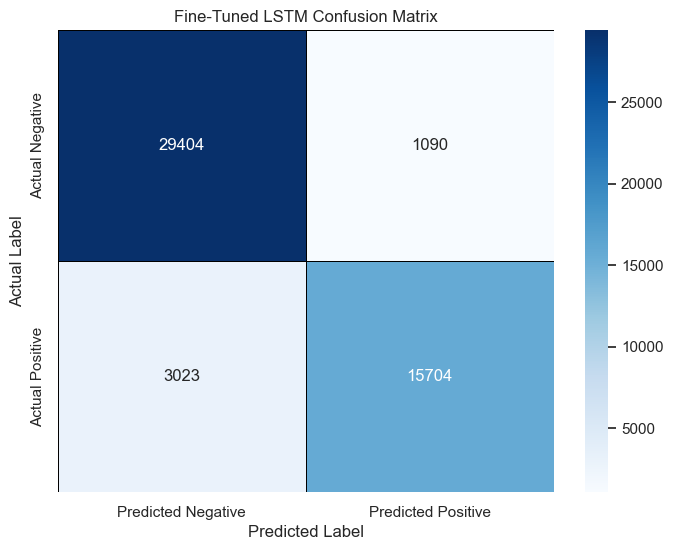

In [264]:
# Plot the confusion matrix heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', 
            linewidths=0.5, linecolor='black')
plt.title('Fine-Tuned LSTM Confusion Matrix')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.show()

In [265]:
# Extract individual metrics
TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

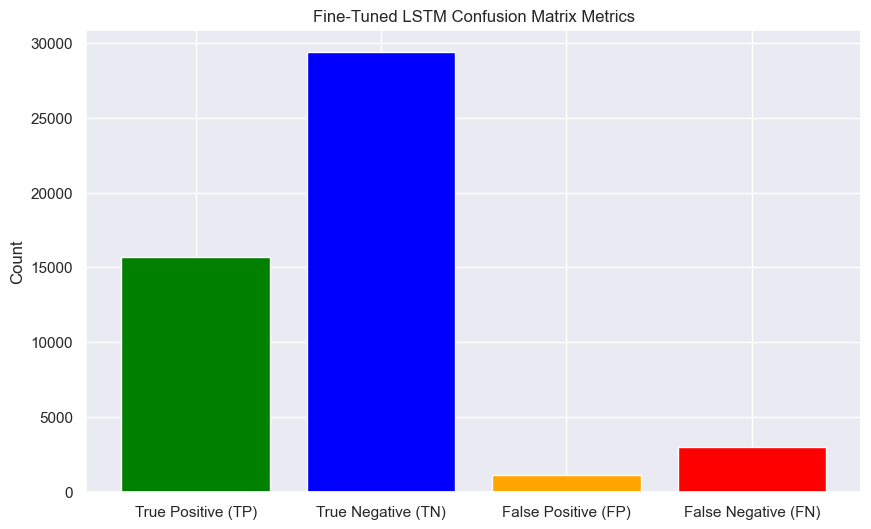

In [266]:
# Create a bar plot for these metrics
metrics = [TP, TN, FP, FN]
metrics_names = ['True Positive (TP)', 'True Negative (TN)', 'False Positive (FP)', 'False Negative (FN)']

plt.figure(figsize=(10, 6))
plt.bar(metrics_names, metrics, color=['green', 'blue', 'orange', 'red'])
plt.title('Fine-Tuned LSTM Confusion Matrix Metrics')
plt.ylabel('Count')
plt.show()

## Experimentation with more neurons and number of epochs

In [267]:
# Define the model with additional changes
last_model = Sequential()
last_model.add(Input(shape=(12, 36)))
last_model.add(Bidirectional(LSTM(128, return_sequences=True)))
last_model.add(Dropout(0.3))
last_model.add(Bidirectional(LSTM(64))) #Recurrent Layer
last_model.add(Dropout(0.3))
last_model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
last_model.add(Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
last_model.add(Dense(1, activation='sigmoid'))

In [268]:
# Compile the model
last_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [269]:
last_history = last_model.fit(
    X_train, y_train,
    epochs=50, 
    batch_size=32,
    validation_data=(X_val, y_val),
    shuffle=False,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 82s 11ms/step - accuracy: 0.7264 - loss: 0.6280 - val_accuracy: 0.7637 - val_loss: 0.4850 - learning_rate: 0.0010
Epoch 2/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 78s 11ms/step - accuracy: 0.7641 - loss: 0.4829 - val_accuracy: 0.7832 - val_loss: 0.4551 - learning_rate: 0.0010
Epoch 3/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 77s 11ms/step - accuracy: 0.7887 - loss: 0.4454 - val_accuracy: 0.8014 - val_loss: 0.4272 - learning_rate: 0.0010
Epoch 4/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 78s 11ms/step - accuracy: 0.8143 - loss: 0.4068 - val_accuracy: 0.8251 - val_loss: 0.3939 - learning_rate: 0.0010
Epoch 5/50
7178/7178 ━━━━━━━━━━━━━━━━━━━━ 78s 11ms/step - accuracy: 0.8372 - loss: 0.3682 - val_accuracy: 0.8542 - val_loss: 0.3393 - learning_rate: 0.0010


In [270]:
# Evaluate the model on the test set
test_loss, test_accuracy = last_model.evaluate(X_test, y_test)
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.7632 - loss: 0.4870
Test Loss: 0.48573383688926697
Test Accuracy: 0.7629060745239258


In [271]:
# Make predictions on the test data
y_pred = last_model.predict(X_test)

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step


In [272]:
# Convert probabilities to class labels (0 or 1)
y_pred = (y_pred > 0.5).astype(int)

In [273]:
# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.74      0.95      0.83     30494
         1.0       0.85      0.46      0.59     18727

    accuracy                           0.76     49221
   macro avg       0.80      0.70      0.71     49221
weighted avg       0.78      0.76      0.74     49221



In [274]:
# Print confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Confusion Matrix:
[[29020  1474]
 [10196  8531]]


In [275]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.7629060766745901
Precision: 0.7828712156331568
Recall: 0.7629060766745901
F1 Score: 0.7417518902404218


In [276]:
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

In [277]:
# Create a DataFrame for the confusion matrix
cm_df = pd.DataFrame(cm, 
                     index=['Actual Negative', 'Actual Positive'], 
                     columns=['Predicted Negative', 'Predicted Positive'])

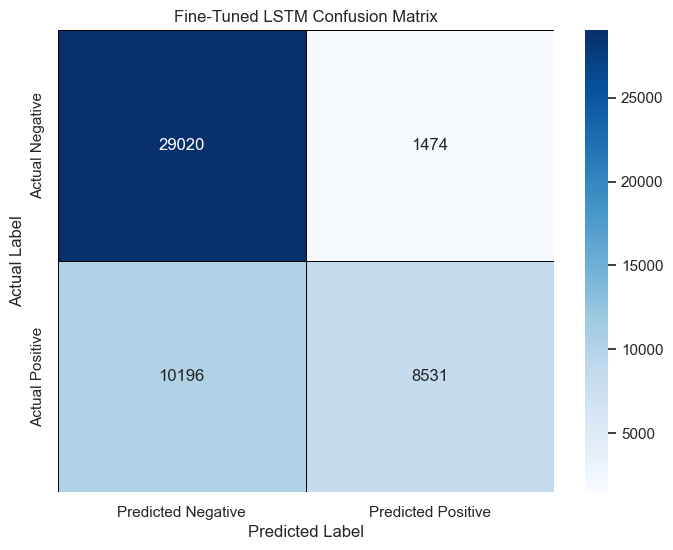

In [278]:
# Plot the confusion matrix heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', 
            linewidths=0.5, linecolor='black')
plt.title('Fine-Tuned LSTM Confusion Matrix')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.show()

In [279]:
# Extract individual metrics
TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

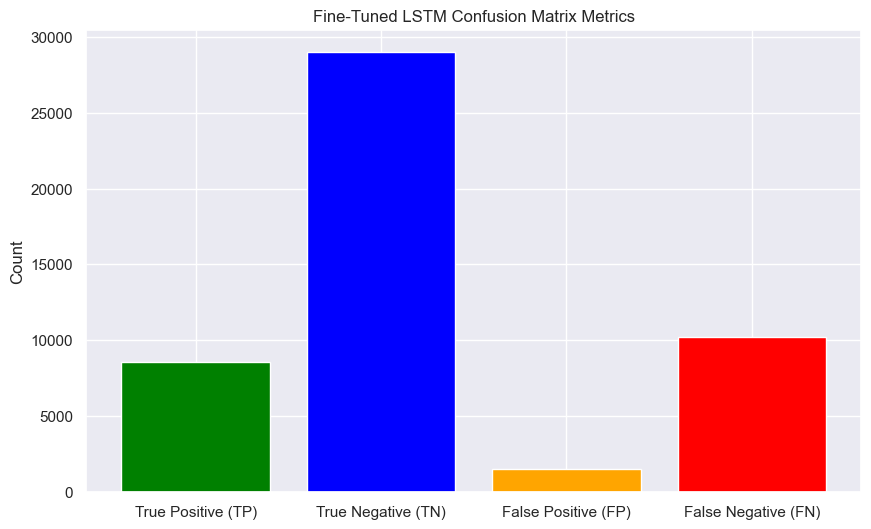

In [280]:
# Create a bar plot for these metrics
metrics = [TP, TN, FP, FN]
metrics_names = ['True Positive (TP)', 'True Negative (TN)', 'False Positive (FP)', 'False Negative (FN)']

plt.figure(figsize=(10, 6))
plt.bar(metrics_names, metrics, color=['green', 'blue', 'orange', 'red'])
plt.title('Fine-Tuned LSTM Confusion Matrix Metrics')
plt.ylabel('Count')
plt.show()

## BEST LSTM MODEL PERFORMANCE

- Model Type: Sequential
- Layers: Input layer, First Bidirectional LSTM Layer with 100 units, First Dropout Layer (0.3), Second Bidirectional LSTM Layer with 50 units, Second Dropout Layer (0.3), First Dense (Fully Connected) Layer with 64 units (The Rectified Linear Unit (ReLU) activation function is used, which introduces non-linearity into the model, L2 regularization is applied to the layer's weights, with a penalty of 0.01), Second Dense Layer with 32 units (same activation function (relu) and regularization as the previous dense layer), Output Layer with a single neuron and sigmoid activation function which outputs a probability between 0 and 1.
- Optimizer: adam - combines the benefits of both the AdaGrad and RMSProp algorithms, Loss Function -  Binary cross-entropy, Metrics - model is evaluated based on accuracy.

In [281]:
# Evaluate the model on the test set
test_loss, test_accuracy = new2_model.evaluate(X_test, y_test)
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9770 - loss: 0.0722
Test Loss: 0.07065900415182114
Test Accuracy: 0.977509617805481


In [282]:
# Make predictions
lstm_y_pred = new2_model.predict(X_test)

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step


In [283]:
# Convert probabilities to class labels (0 or 1)
lstm_y_pred = (lstm_y_pred > 0.5).astype(int)

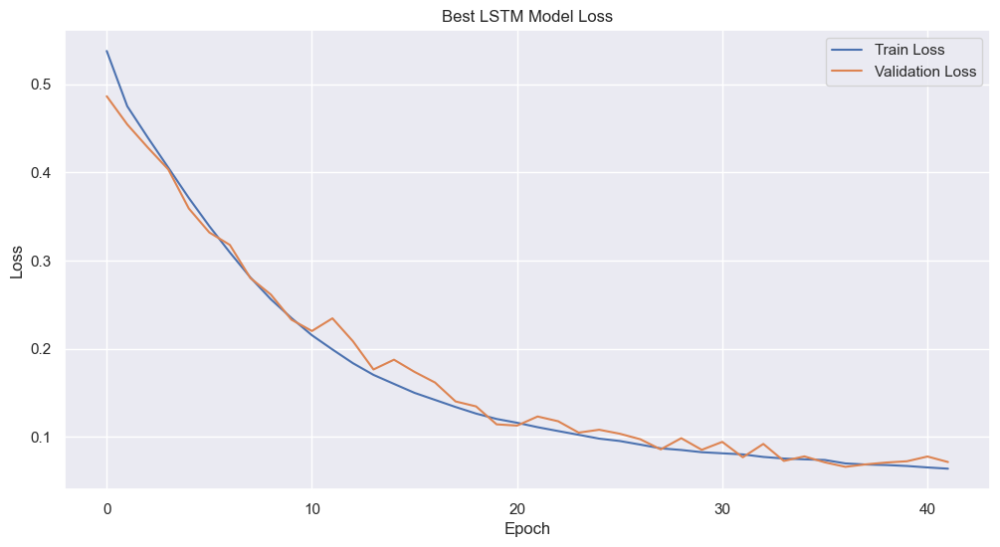

In [284]:
# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Best LSTM Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

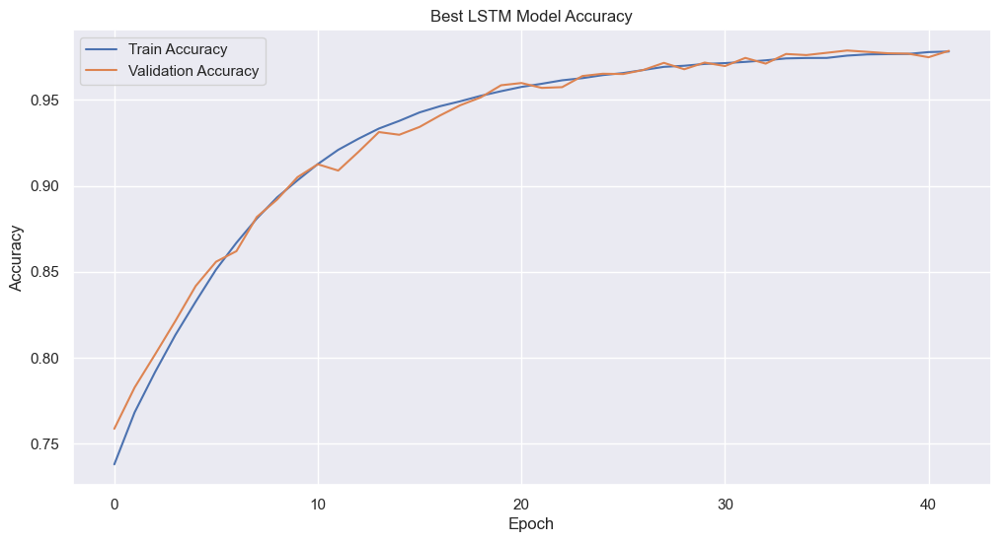

In [285]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Best LSTM Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [286]:
# Calculate performance metrics
accuracy = accuracy_score(y_test, lstm_y_pred)
precision = precision_score(y_test, lstm_y_pred, average='weighted')
recall = recall_score(y_test, lstm_y_pred, average='weighted')
f1 = f1_score(y_test, lstm_y_pred, average='weighted')
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.9775095995611629
Precision: 0.9775358728678565
Recall: 0.9775095995611629
F1 Score: 0.9774660810102611


In [287]:
# Print classification report
print("Classification Report:")
print(classification_report(y_test, lstm_y_pred))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98     30494
         1.0       0.98      0.96      0.97     18727

    accuracy                           0.98     49221
   macro avg       0.98      0.97      0.98     49221
weighted avg       0.98      0.98      0.98     49221



### Confusion Matrix

In [288]:
# Print confusion matrix
print("Confusion Matrix for LSTM:")
print(confusion_matrix(y_test, lstm_y_pred))

Confusion Matrix for LSTM:
[[30122   372]
 [  735 17992]]


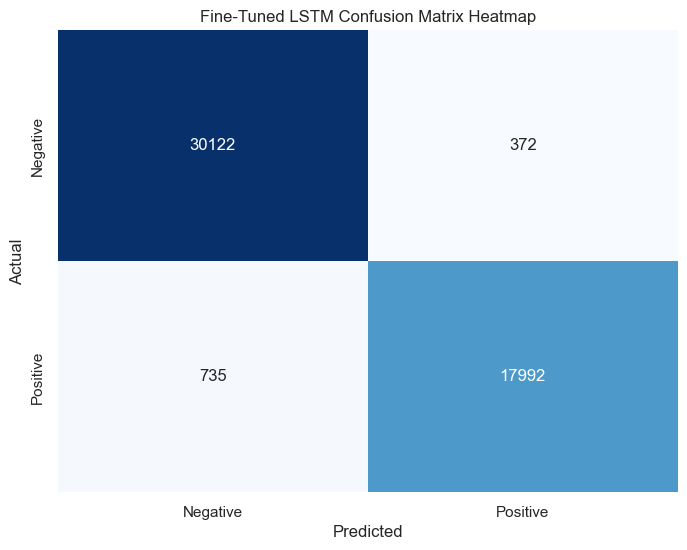

In [289]:
# Compute confusion matrix
cm = confusion_matrix(y_test, lstm_y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Fine-Tuned LSTM Confusion Matrix Heatmap')
plt.show()

In [290]:
# Extract individual metrics from the confusion matrix
TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

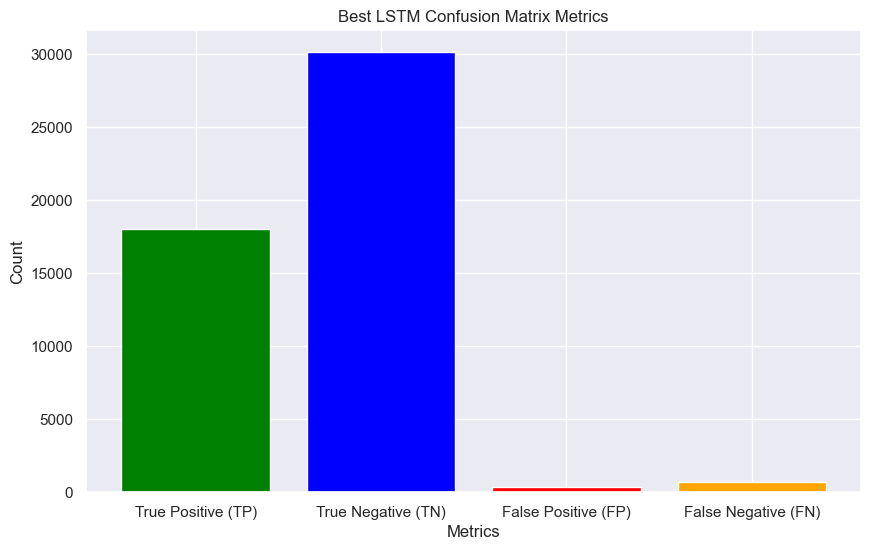

In [291]:
# Plot bar plot for metrics
metrics = {'True Positive (TP)': TP, 'True Negative (TN)': TN, 'False Positive (FP)': FP, 'False Negative (FN)': FN}
names = list(metrics.keys())
values = list(metrics.values())

plt.figure(figsize=(10, 6))
plt.bar(names, values, color=['green', 'blue', 'red', 'orange'])
plt.xlabel('Metrics')
plt.ylabel('Count')
plt.title('Best LSTM Confusion Matrix Metrics')
plt.show()

## ROC Curve

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
ROC AUC Score: 0.996428689742148


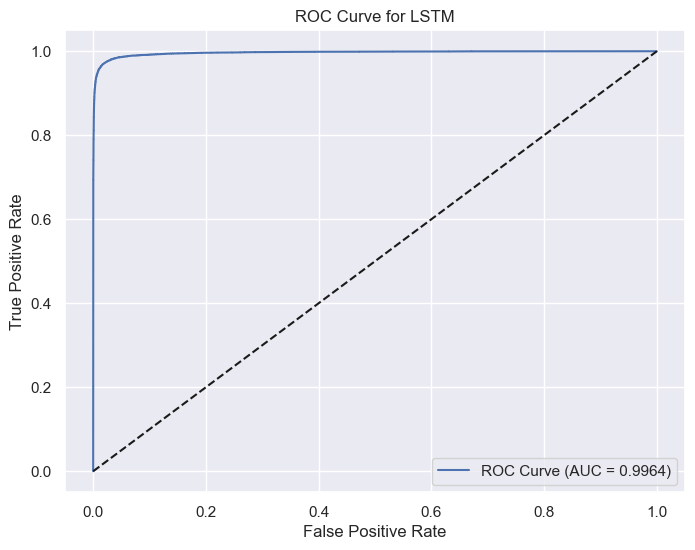

In [292]:
# If the model outputs a single probability per sample
lstm_y_prob = new2_model.predict(X_test).ravel()  # Flatten the output to 1D array

# Calculate ROC curve
from sklearn.metrics import roc_curve, roc_auc_score

fpr, tpr, thresholds = roc_curve(y_test, lstm_y_prob)
auc = roc_auc_score(y_test, lstm_y_prob)

print(f"ROC AUC Score: {auc}")

# Plot ROC curve
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {auc:.4f})')
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line for random guessing
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for LSTM')
plt.legend()
plt.show()

###  Plot the Model

In [293]:
pip install pydot

  Using cached pydot-3.0.1-py3-none-any.whl.metadata (9.9 kB)
Using cached pydot-3.0.1-py3-none-any.whl (22 kB)
Note: you may need to restart the kernel to use updated packages.


In [294]:
from tensorflow.keras.utils import plot_model

# Plot the model architecture
plot_model(new2_model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) for `plot_model` to work.


In [295]:
new2_model.save('new2.keras')

## LIME for Interpretation

In [296]:
pip install lime

  Using cached lime-0.2.0.1-py3-none-any.whl
Note: you may need to restart the kernel to use updated packages.


In [297]:
from lime import lime_text, lime_tabular
from lime.lime_text import LimeTextExplainer
from lime.lime_tabular import LimeTabularExplainer

In [298]:
# Instantiate the LIME Tabular Explainer
explainer = LimeTabularExplainer(
    training_data=X_train.reshape(X_train.shape[0], -1),  # Flatten the data for LIME
    feature_names=[f'Feature_{i}' for i in range(X_train.shape[1] * X_train.shape[2])],
    class_names=['Not Purchased', 'Purchased'],
    mode='classification'
)

In [299]:
# Define a prediction function for LIME that returns probabilities for both classes
def predict_fn(data):
    data_reshaped = data.reshape(data.shape[0], 12, 36)
    return np.hstack([1 - new2_model.predict(data_reshaped), new2_model.predict(data_reshaped)])

In [300]:
# Select a sample from the test set for explanation
sample = X_test[0].reshape(1, -1)  # Flatten the sample

# Get the LIME explanation for the selected instance
exp = explainer.explain_instance(sample.flatten(), predict_fn, num_features=10)

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [301]:
# Visualize the explanation
exp.show_in_notebook()

Feature numbers above correspond to the flattened array index, which was created as a time sequence for each customer. 

In [302]:
feature_names = []
for i in range(12):  # Assuming 12 time steps
    for j in range(36):  # Assuming 36 features per time step
        feature_names.append(f'TimeStep_{i}_Feature_{j}')

In [303]:
# Create LIME Tabular Explainer with custom feature names
explainer = LimeTabularExplainer(
    training_data=X_train.reshape(X_train.shape[0], -1),  # Flatten the data for LIME
    feature_names=feature_names,
    class_names=['Not Purchased', 'Purchased'],
    mode='classification'
)

In [304]:
# Select a sample from the test set for explanation
sample = X_test[0].reshape(1, -1)  # Flatten the sample

# Get the LIME explanation for the selected instance
exp = explainer.explain_instance(sample.flatten(), predict_fn, num_features=10)

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [305]:
# Visualize the explanation
exp.show_in_notebook()

# Machine Learning Models

### Data Optimization for training ML Models

In [306]:
cleaned_df = pd.read_csv('cleaned_after_pca1.csv')
cleaned_df.head()

,InvoiceNo,Quantity,UnitPrice,CustomerID,Country,day_of_week,day_of_month,month,year,hour,...,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19
0,2331,569.961756,-0.093142,12346,35,1,18,1,0.270915,10,...,-0.946129,-1.500304,0.469704,0.157686,0.337675,-0.398598,0.627182,-0.397179,0.532120,0.527751
1,615,-0.007605,-0.046200,12347,16,1,7,12,-3.691192,14,...,-0.525865,-0.132345,0.004239,-1.614960,-0.092893,0.870201,-0.183620,1.117826,0.392479,-0.019042
2,615,-0.069055,0.049011,12347,16,1,7,12,-3.691192,14,...,-0.628749,-0.298470,-0.043603,-0.764821,-0.359994,-0.028644,-0.997525,-0.238503,1.129736,-0.992146
3,615,-0.007605,0.004727,12347,16,1,7,12,-3.691192,14,...,0.446727,-0.898481,-0.264139,-0.818540,1.097169,0.815599,1.103273,0.524210,0.612355,-0.374659
4,615,0.176744,-0.110413,12347,16,1,7,12,-3.691192,14,...,-0.343237,-0.875475,-0.088337,-0.335184,0.244916,-0.679322,-0.726316,-0.302744,0.202917,-0.549559


In [307]:
# Display all column names of the DataFrame
print(cleaned_df.columns.tolist())

['InvoiceNo', 'Quantity', 'UnitPrice', 'CustomerID', 'Country', 'day_of_week', 'day_of_month', 'month', 'year', 'hour', 'total_price', 'total_quantity', 'unique_products', 'Target', 'Date', 'DaysBetweenPurchases', 'lag_1', 'lag_2', 'lag_3', 'rolling_mean_3', 'rolling_std_3', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18', 'PC19']


In [308]:
# Check data types
data_types = cleaned_df.dtypes
print(data_types)

InvoiceNo                 int64
Quantity                float64
UnitPrice               float64
CustomerID                int64
Country                   int64
day_of_week               int64
day_of_month              int64
month                     int64
year                    float64
hour                      int64
total_price             float64
total_quantity          float64
unique_products         float64
Target                    int64
Date                     object
DaysBetweenPurchases    float64
lag_1                   float64
lag_2                   float64
lag_3                   float64
rolling_mean_3          float64
rolling_std_3           float64
PC1                     float64
PC2                     float64
PC3                     float64
PC4                     float64
PC5                     float64
PC6                     float64
PC7                     float64
PC8                     float64
PC9                     float64
PC10                    float64
PC11    

In [309]:
# Drop specified columns
columns_to_drop = ['InvoiceNo', 'Date', 'CustomerID']
cleaned_df = cleaned_df.drop(columns=columns_to_drop)

print(cleaned_df.head())

     Quantity  UnitPrice  Country  day_of_week  day_of_month  month      year  \
0  569.961756  -0.093142       35            1            18      1  0.270915   
1   -0.007605  -0.046200       16            1             7     12 -3.691192   
2   -0.069055   0.049011       16            1             7     12 -3.691192   
3   -0.007605   0.004727       16            1             7     12 -3.691192   
4    0.176744  -0.110413       16            1             7     12 -3.691192   

   hour  total_price  total_quantity  ...      PC10      PC11      PC12  \
0    10   484.426078        3.682851  ... -0.946129 -1.500304  0.469704   
1    14     0.018299       -0.221178  ... -0.525865 -0.132345  0.004239   
2    14    -0.033182       -0.221178  ... -0.628749 -0.298470 -0.043603   
3    14     0.104936       -0.221178  ...  0.446727 -0.898481 -0.264139   
4    14     0.006998       -0.221178  ... -0.343237 -0.875475 -0.088337   

       PC13      PC14      PC15      PC16      PC17      PC18 

In [310]:
print(cleaned_df.columns)
print(cleaned_df.info())

Index(['Quantity', 'UnitPrice', 'Country', 'day_of_week', 'day_of_month',
       'month', 'year', 'hour', 'total_price', 'total_quantity',
       'unique_products', 'Target', 'DaysBetweenPurchases', 'lag_1', 'lag_2',
       'lag_3', 'rolling_mean_3', 'rolling_std_3', 'PC1', 'PC2', 'PC3', 'PC4',
       'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'PC13',
       'PC14', 'PC15', 'PC16', 'PC17', 'PC18', 'PC19'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 375465 entries, 0 to 375464
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Quantity              375465 non-null  float64
 1   UnitPrice             375465 non-null  float64
 2   Country               375465 non-null  int64  
 3   day_of_week           375465 non-null  int64  
 4   day_of_month          375465 non-null  int64  
 5   month                 375465 non-null  int64  
 6   year                

In [311]:
# Check data types of each column
print(cleaned_df.dtypes)

Quantity                float64
UnitPrice               float64
Country                   int64
day_of_week               int64
day_of_month              int64
month                     int64
year                    float64
hour                      int64
total_price             float64
total_quantity          float64
unique_products         float64
Target                    int64
DaysBetweenPurchases    float64
lag_1                   float64
lag_2                   float64
lag_3                   float64
rolling_mean_3          float64
rolling_std_3           float64
PC1                     float64
PC2                     float64
PC3                     float64
PC4                     float64
PC5                     float64
PC6                     float64
PC7                     float64
PC8                     float64
PC9                     float64
PC10                    float64
PC11                    float64
PC12                    float64
PC13                    float64
PC14    

As months and days are cyclical, we will encode them accordingly using sine and cosine transformations to capture cyclical patterns.

In [312]:
import numpy as np

# Example for cyclical encoding
cleaned_df['sin_day_of_week'] = np.sin(2 * np.pi * cleaned_df['day_of_week'] / 7)
cleaned_df['cos_day_of_week'] = np.cos(2 * np.pi * cleaned_df['day_of_week'] / 7)
cleaned_df['sin_month'] = np.sin(2 * np.pi * cleaned_df['month'] / 12)
cleaned_df['cos_month'] = np.cos(2 * np.pi * cleaned_df['month'] / 12)
cleaned_df['sin_hour'] = np.sin(2 * np.pi * cleaned_df['hour'] / 24)
cleaned_df['cos_hour'] = np.cos(2 * np.pi * cleaned_df['hour'] / 24)

# Drop original columns if needed
cleaned_df.drop(columns=['day_of_week', 'month', 'hour'], inplace=True)

In [313]:
cleaned_df.head

<bound method NDFrame.head of           Quantity  UnitPrice  Country  day_of_month      year  total_price  \
0       569.961756  -0.093142       35            18  0.270915   484.426078   
1        -0.007605  -0.046200       16             7 -3.691192     0.018299   
2        -0.069055   0.049011       16             7 -3.691192    -0.033182   
3        -0.007605   0.004727       16             7 -3.691192     0.104936   
4         0.176744  -0.110413       16             7 -3.691192     0.006998   
...            ...        ...      ...           ...       ...          ...   
375460   -0.007605  -0.120598       35            12  0.270915    -0.108268   
375461   -0.007605  -0.046200       35            12  0.270915     0.018299   
375462    0.176744  -0.083842       35            28  0.270915     0.142605   
375463    0.268919  -0.121927       35            28  0.270915    -0.022383   
375464    0.084570  -0.126355       35            28  0.270915    -0.096214   

        total_quantit

In [314]:
# Prepare features and target
X = cleaned_df.drop(columns=['Target'])
y = cleaned_df['Target']

In [315]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Random Forest Model Building 

In [316]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

In [317]:
# Initialize the Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model to the training data
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [318]:
# Make predictions
y_pred = rf_model.predict(X_test)

In [319]:
# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

In [320]:
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.9515933575699466
Precision: 0.9546870393529044
Recall: 0.9515933575699466
F1 Score: 0.950711754947624


In [321]:
# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.93      1.00      0.96     48663
           1       1.00      0.86      0.93     26430

    accuracy                           0.95     75093
   macro avg       0.96      0.93      0.95     75093
weighted avg       0.95      0.95      0.95     75093



### Confusion Matrix

In [322]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

In [323]:
# Print confusion matrix
print("Confusion Matrix for RF:")
print(confusion_matrix(y_test, y_pred))

Confusion Matrix for RF:
[[48605    58]
 [ 3577 22853]]


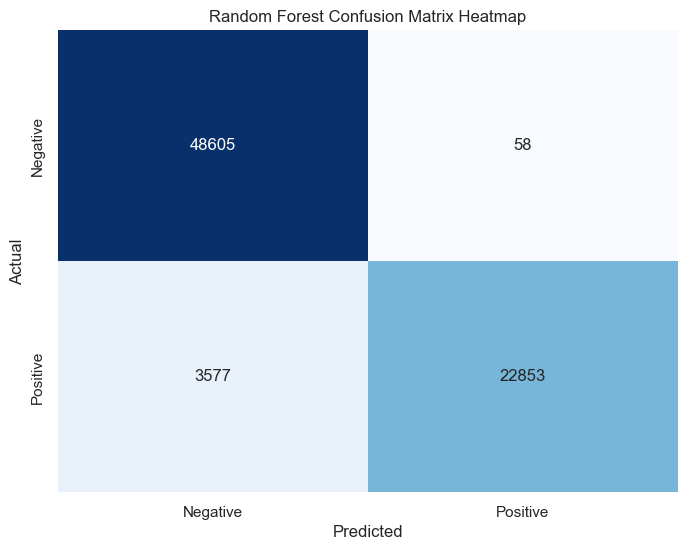

In [324]:
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Random Forest Confusion Matrix Heatmap')
plt.show()

In [325]:
# Extract individual metrics from the confusion matrix
TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

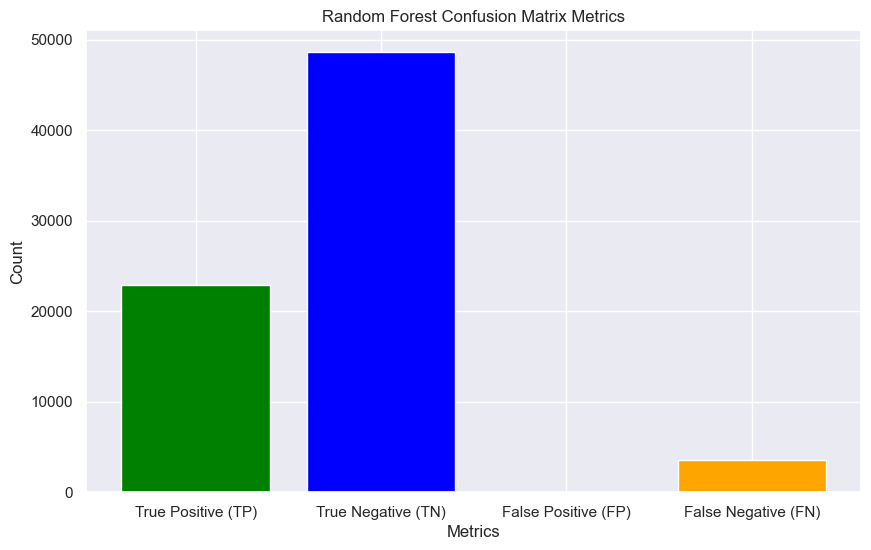

In [326]:
# Plot bar plot for metrics
metrics = {'True Positive (TP)': TP, 'True Negative (TN)': TN, 'False Positive (FP)': FP, 'False Negative (FN)': FN}
names = list(metrics.keys())
values = list(metrics.values())

plt.figure(figsize=(10, 6))
plt.bar(names, values, color=['green', 'blue', 'red', 'orange'])
plt.xlabel('Metrics')
plt.ylabel('Count')
plt.title('Random Forest Confusion Matrix Metrics')
plt.show()

## Gradient Boosting Model Building

In [327]:
from sklearn.ensemble import GradientBoostingClassifier

In [328]:
# Initial model setup with default parameters
gb_model = GradientBoostingClassifier(
    n_estimators=100,     # Start with 100 trees
    learning_rate=0.1,    # Standard learning rate
    max_depth=3,          # Default tree depth
    min_samples_split=2,  # Default value
    min_samples_leaf=1,   # Default value
    subsample=1.0,        # Use all samples
    max_features=None,    # Use all features
    random_state=42       # For reproducibility
)

# Fit the model
gb_model.fit(X_train, y_train)

GradientBoostingClassifier(random_state=42)

In [329]:
# Make predictions
y_pred = gb_model.predict(X_test)

In [330]:
# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print metrics
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.8313824191336077
Precision: 0.8480236226389601
Recall: 0.8313824191336077
F1 Score: 0.8190542493291235


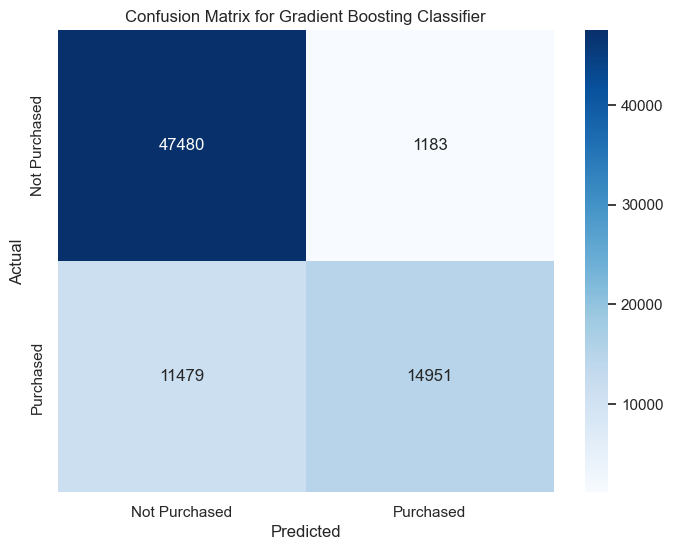

In [331]:
# Confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Purchased', 'Purchased'], yticklabels=['Not Purchased', 'Purchased'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

In [332]:
# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.98      0.88     48663
           1       0.93      0.57      0.70     26430

    accuracy                           0.83     75093
   macro avg       0.87      0.77      0.79     75093
weighted avg       0.85      0.83      0.82     75093



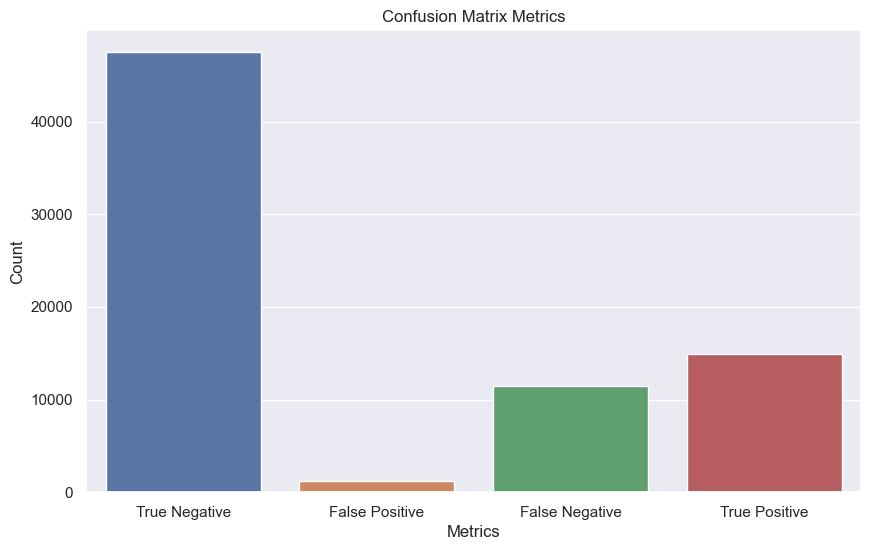

In [333]:
# Extract metrics from the confusion matrix
TN, FP, FN, TP = cm.ravel()

# Metrics to display
metrics = {
    'True Negative': TN,
    'False Positive': FP,
    'False Negative': FN,
    'True Positive': TP
}

# Plotting the bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=list(metrics.keys()), y=list(metrics.values()))
plt.xlabel('Metrics')
plt.ylabel('Count')
plt.title('Confusion Matrix Metrics')
plt.show()

## Decision Tree Model Building

In [334]:
from sklearn.tree import DecisionTreeClassifier

In [335]:
dtc_model = DecisionTreeClassifier(random_state=42)
dtc_model.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [336]:
y_pred = dtc_model.predict(X_test)

In [337]:
# Accuracy
accuracy = accuracy_score(y_test, y_pred)

# Precision
precision = precision_score(y_test, y_pred, average='weighted')

# Recall
recall = recall_score(y_test, y_pred, average='weighted')

# F1 Score
f1 = f1_score(y_test, y_pred, average='weighted')

# Print the metrics
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.9962047061643562
Precision: 0.996205375120764
Recall: 0.9962047061643562
F1 Score: 0.9962049847382254


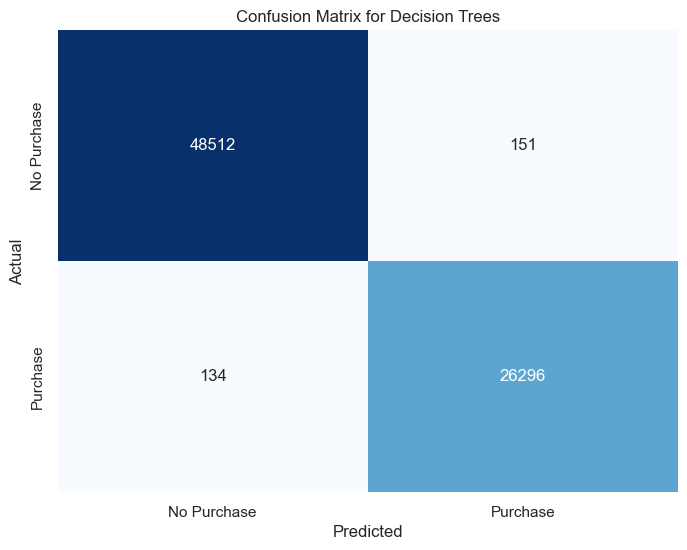

In [338]:
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=['No Purchase', 'Purchase'], yticklabels=['No Purchase', 'Purchase'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Decision Trees')
plt.show()

In [339]:
# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     48663
           1       0.99      0.99      0.99     26430

    accuracy                           1.00     75093
   macro avg       1.00      1.00      1.00     75093
weighted avg       1.00      1.00      1.00     75093



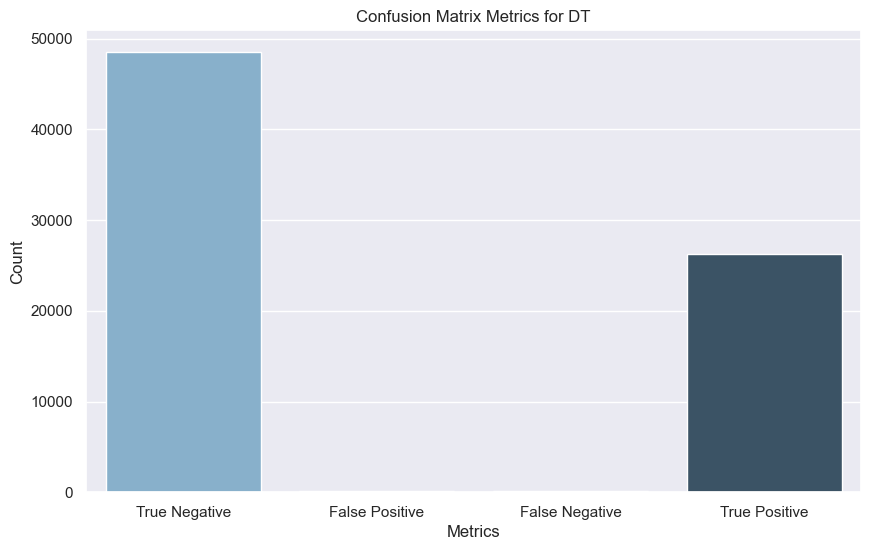

In [340]:
# Extract metrics from the confusion matrix
TN, FP, FN, TP = cm.ravel()

# Metrics to display
metrics = {
    'True Negative': TN,
    'False Positive': FP,
    'False Negative': FN,
    'True Positive': TP
}

# Plotting the bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=list(metrics.keys()), y=list(metrics.values()), palette='Blues_d')
plt.xlabel('Metrics')
plt.ylabel('Count')
plt.title('Confusion Matrix Metrics for DT')
plt.show()

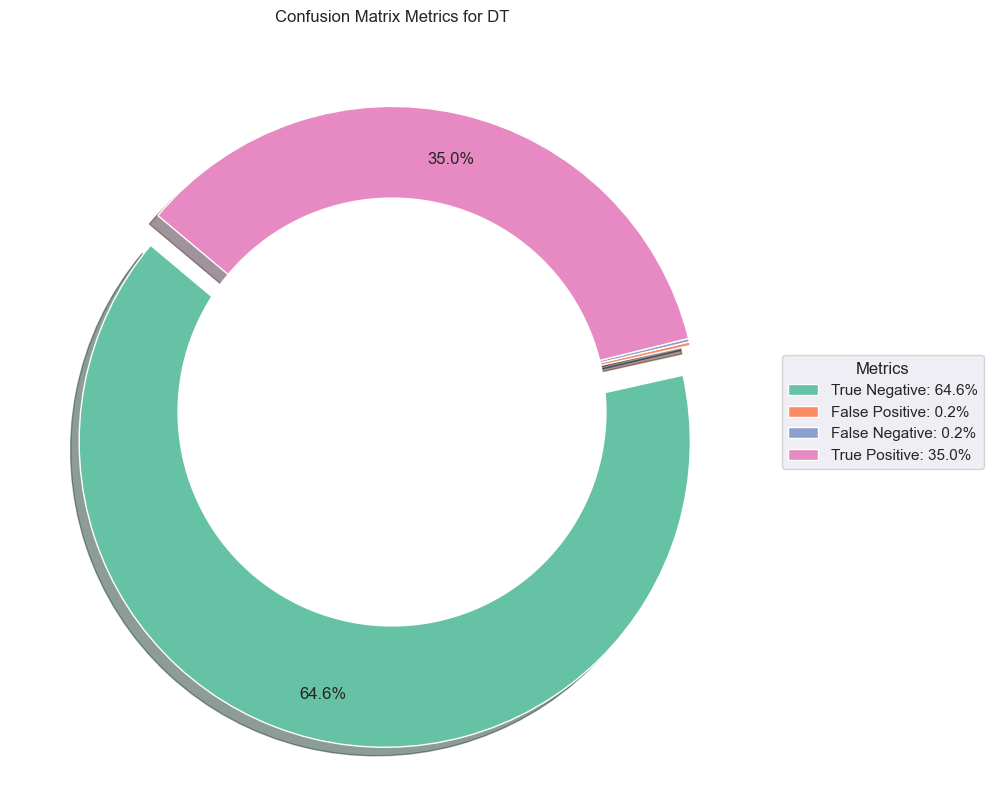

In [341]:
# Metrics to display
labels = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
sizes = [TN, FP, FN, TP]
colors = ['#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3']
explode = (0.1, 0, 0, 0)  # Explode the 1st slice (True Negative)

# Create the pie chart
fig, ax = plt.subplots(figsize=(10, 8))
wedges, texts, autotexts = ax.pie(sizes, explode=explode, colors=colors, 
                                  autopct=lambda p: '{:.1f}%'.format(p) if p > 5 else '',
                                  shadow=True, startangle=140, 
                                  pctdistance=0.85,  # Distance of percentages from center
                                  labeldistance=1.3) # Distance of labels from center

# Customize label positions to avoid overlap
for i, text in enumerate(texts):
    # Position labels outside for larger slices
    if sizes[i] > 10:
        text.set_fontsize(12)
        text.set_color('black')
    else:
        # Position smaller labels inside
        autotexts[i].set_fontsize(10)
        autotexts[i].set_color('white')
        text.set_text('')  # Hide outside labels for small slices

# Add a legend with percentages
legend_labels = [f'{label}: {percent:.1f}%' for label, percent in zip(labels, [size / sum(sizes) * 100 for size in sizes])]
ax.legend(wedges, legend_labels, title="Metrics", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Draw center circle to make it look like a donut chart
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()
plt.title('Confusion Matrix Metrics for DT')
plt.show()

## Logistic Regression Model Building

In [342]:
from sklearn.linear_model import LogisticRegression

In [343]:
logistic_model = LogisticRegression(max_iter=1000, random_state=42)
logistic_model.fit(X_train, y_train)

LogisticRegression(max_iter=1000, random_state=42)

In [344]:
y_pred = logistic_model.predict(X_test)

In [345]:
# Accuracy
accuracy = accuracy_score(y_test, y_pred)

# Precision
precision = precision_score(y_test, y_pred, average='weighted')

# Recall
recall = recall_score(y_test, y_pred, average='weighted')

# F1 Score
f1 = f1_score(y_test, y_pred, average='weighted')

# Print the metrics
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.7331575513030509
Precision: 0.738325145434309
Recall: 0.7331575513030509
F1 Score: 0.7020062981342263


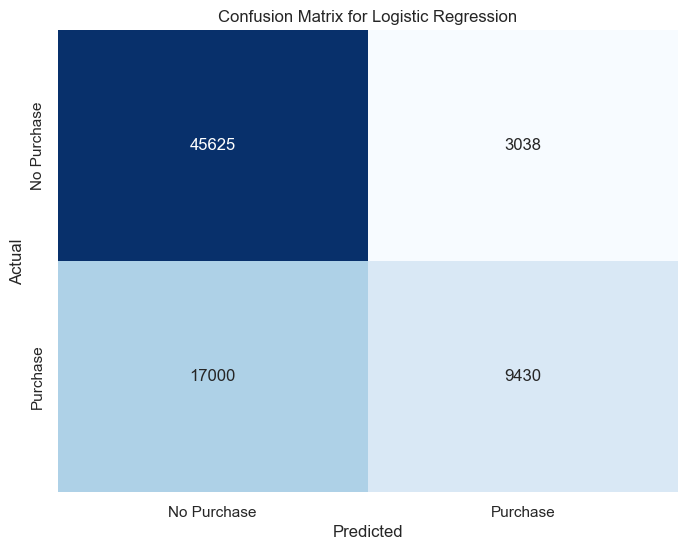

In [346]:
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=['No Purchase', 'Purchase'], yticklabels=['No Purchase', 'Purchase'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

In [347]:
# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.94      0.82     48663
           1       0.76      0.36      0.48     26430

    accuracy                           0.73     75093
   macro avg       0.74      0.65      0.65     75093
weighted avg       0.74      0.73      0.70     75093



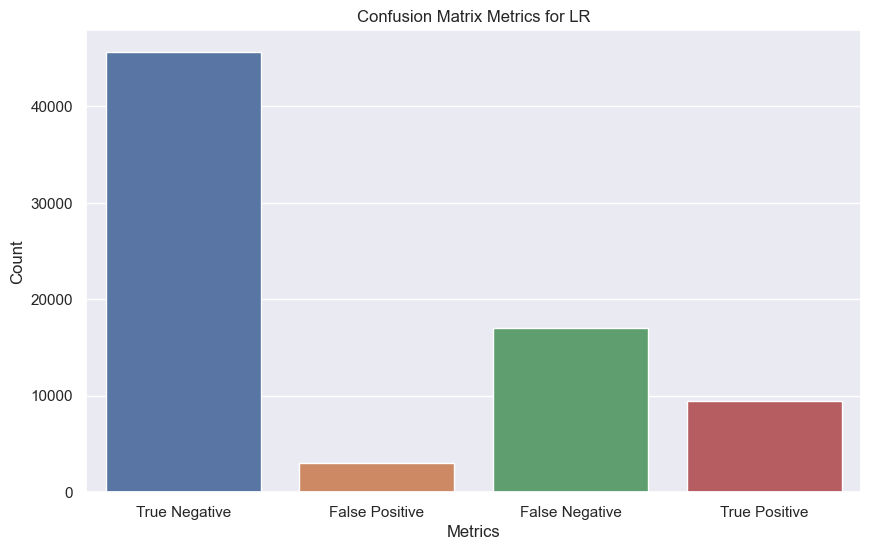

In [348]:
# Extract metrics from the confusion matrix
TN, FP, FN, TP = cm.ravel()

# Metrics to display
metrics = {
    'True Negative': TN,
    'False Positive': FP,
    'False Negative': FN,
    'True Positive': TP
}

# Plotting the bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=list(metrics.keys()), y=list(metrics.values()))
plt.xlabel('Metrics')
plt.ylabel('Count')
plt.title('Confusion Matrix Metrics for LR')
plt.show()

## FINE-TUNING ML MODELS

##  Feature Ablation

Feature ablation involves removing one feature at a time and checking how the model performance changes. We will perform it for some features, relying on correlation analysis and domain knowledge.

### Updating feature Set to reduce Dimensionality

Remove the columns associated with the Word2Vec embeddings.

In [349]:
print(X.columns)

Index(['Quantity', 'UnitPrice', 'Country', 'day_of_month', 'year',
       'total_price', 'total_quantity', 'unique_products',
       'DaysBetweenPurchases', 'lag_1', 'lag_2', 'lag_3', 'rolling_mean_3',
       'rolling_std_3', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8',
       'PC9', 'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17',
       'PC18', 'PC19', 'sin_day_of_week', 'cos_day_of_week', 'sin_month',
       'cos_month', 'sin_hour', 'cos_hour'],
      dtype='object')


In [350]:
# Drop specified columns
columns_to_drop = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8',
       'PC9', 'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17',
       'PC18', 'PC19']
X = X.drop(columns=columns_to_drop)

print(X.head())

As we are going to perform hyperparameter tuning of the models and  multiple evaluations, in order to prevent data leakage we will use validation set to ensure honest assessment of your model's performance.

In [351]:
# Split the data
# First split: create test set
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [352]:
# Second split: create validation set from the training + validation set
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)

## Random Forest Fine-Tuning with GridSearchCV

In [353]:
from sklearn.model_selection import GridSearchCV

In [354]:
# Initialize the Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)

In [355]:
# Define the parameter grid for Grid Search
param_grid = {
    'n_estimators': [100, 200],# Number of trees
    'max_depth': [None, 10] 
}

In [358]:
# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, 
                           cv=5, n_jobs=1, verbose=2, scoring='accuracy')

In [359]:
# Fit GridSearchCV to the data
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ...................max_depth=None, n_estimators=100; total time=  39.2s
[CV] END ...................max_depth=None, n_estimators=100; total time=  39.3s
[CV] END ...................max_depth=None, n_estimators=100; total time=  39.3s
[CV] END ...................max_depth=None, n_estimators=100; total time=  39.1s
[CV] END ...................max_depth=None, n_estimators=100; total time=  39.5s
[CV] END ...................max_depth=None, n_estimators=200; total time= 1.3min
[CV] END ...................max_depth=None, n_estimators=200; total time= 1.3min
[CV] END ...................max_depth=None, n_estimators=200; total time= 1.3min
[CV] END ...................max_depth=None, n_estimators=200; total time= 1.3min
[CV] END ...................max_depth=None, n_estimators=200; total time= 1.3min
[CV] END .....................max_depth=10, n_estimators=100; total time=  20.5s
[CV] END .....................max_depth=10, n_est

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=1,
             param_grid={'max_depth': [None, 10], 'n_estimators': [100, 200]},
             scoring='accuracy', verbose=2)

In [360]:
# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Score: {best_score:.4f}")

Best Parameters: {'max_depth': None, 'n_estimators': 200}
Best Cross-Validation Score: 0.9789


In [361]:
# Best model from grid search
best_rf_model = grid_search.best_estimator_

## Final predicitons for RF

In [362]:
# Make predictions
rf_y_pred = best_rf_model.predict(X_test)

In [363]:
# Calculate performance metrics
accuracy = accuracy_score(y_test, rf_y_pred)
precision = precision_score(y_test, rf_y_pred, average='weighted')
recall = recall_score(y_test, rf_y_pred, average='weighted')
f1 = f1_score(y_test, rf_y_pred, average='weighted')
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.983367291225547
Precision: 0.9837418593673412
Recall: 0.983367291225547
F1 Score: 0.9832756455085175


In [364]:
# Print classification report
print("Classification Report:")
print(classification_report(y_test, rf_y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99     48663
           1       1.00      0.95      0.98     26430

    accuracy                           0.98     75093
   macro avg       0.99      0.98      0.98     75093
weighted avg       0.98      0.98      0.98     75093



### Confusion Matrix

In [365]:
# Print confusion matrix
print("Confusion Matrix for RF:")
print(confusion_matrix(y_test, rf_y_pred))

Confusion Matrix for RF:
[[48637    26]
 [ 1223 25207]]


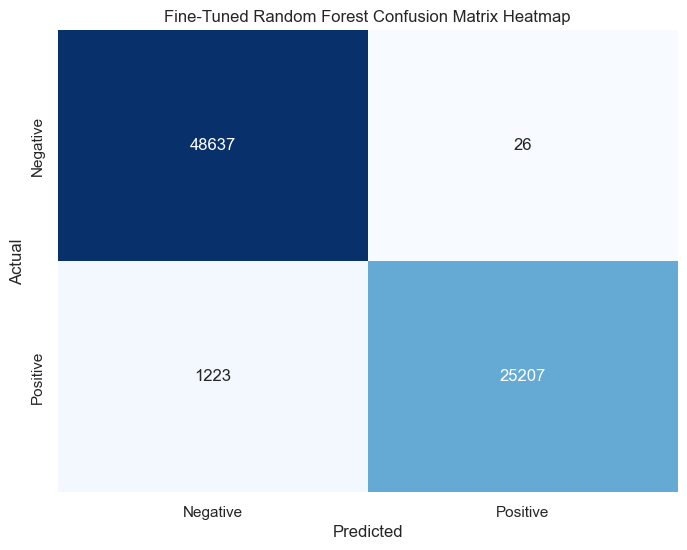

In [366]:
# Compute confusion matrix
cm = confusion_matrix(y_test, rf_y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Fine-Tuned Random Forest Confusion Matrix Heatmap')
plt.show()

In [367]:
# Extract individual metrics from the confusion matrix
TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

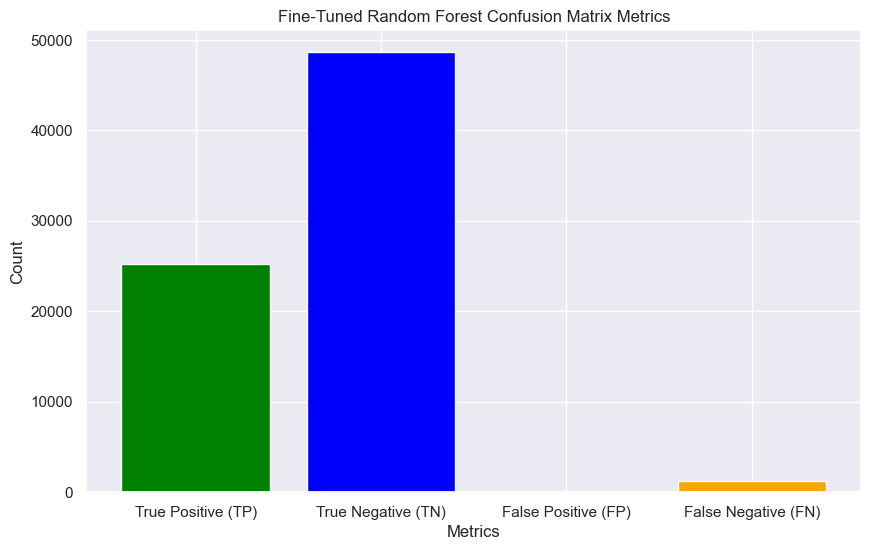

In [368]:
# Plot bar plot for metrics
metrics = {'True Positive (TP)': TP, 'True Negative (TN)': TN, 'False Positive (FP)': FP, 'False Negative (FN)': FN}
names = list(metrics.keys())
values = list(metrics.values())

plt.figure(figsize=(10, 6))
plt.bar(names, values, color=['green', 'blue', 'red', 'orange'])
plt.xlabel('Metrics')
plt.ylabel('Count')
plt.title('Fine-Tuned Random Forest Confusion Matrix Metrics')
plt.show()

In [369]:
# Get the feature importances
importances = best_rf_model.feature_importances_

# Print the feature importances
for feature, importance in zip(X.columns, importances):
    print(f"Feature: {feature}, Importance: {importance}")

Feature: Quantity, Importance: 0.016429145956922672
Feature: UnitPrice, Importance: 0.018672011355093342
Feature: Country, Importance: 0.0255821846159126
Feature: day_of_month, Importance: 0.06358275686013837
Feature: year, Importance: 0.0031986295295722508
Feature: total_price, Importance: 0.023105895369702853
Feature: total_quantity, Importance: 0.2989645006904558
Feature: unique_products, Importance: 0.2516325086923115
Feature: DaysBetweenPurchases, Importance: 0.002766771559347843
Feature: lag_1, Importance: 0.022926666889245367
Feature: lag_2, Importance: 0.02300145081794114
Feature: lag_3, Importance: 0.026648983517701442
Feature: rolling_mean_3, Importance: 0.03053606737329284
Feature: rolling_std_3, Importance: 0.024749899968540684
Feature: sin_day_of_week, Importance: 0.02478894366048805
Feature: cos_day_of_week, Importance: 0.0171912854173684
Feature: sin_month, Importance: 0.028590426917142767
Feature: cos_month, Importance: 0.02929907282566794
Feature: sin_hour, Importance:

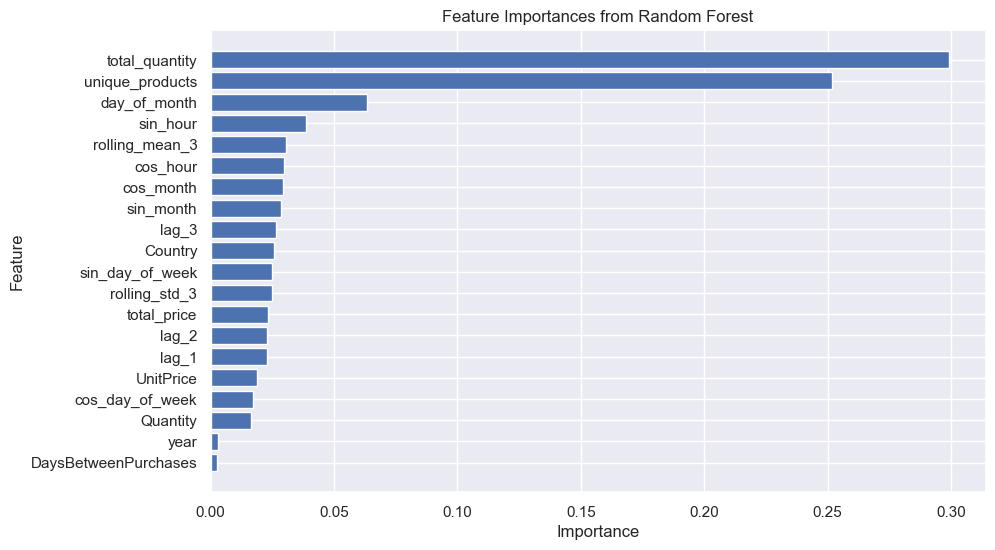

In [370]:
# Create a DataFrame for better visualization
importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
})

# Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances from Random Forest')
plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.show()

In [371]:
from sklearn.metrics import roc_curve, roc_auc_score

In [372]:
# Predict probabilities for the positive class
rf_y_prob = best_rf_model.predict_proba(X_test)[:, 1]

In [373]:
# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, rf_y_prob)

# Compute AUC
rf_auc = roc_auc_score(y_test, rf_y_prob)

print(f"ROC AUC Score: {rf_auc}")

ROC AUC Score: 0.9989985636269503


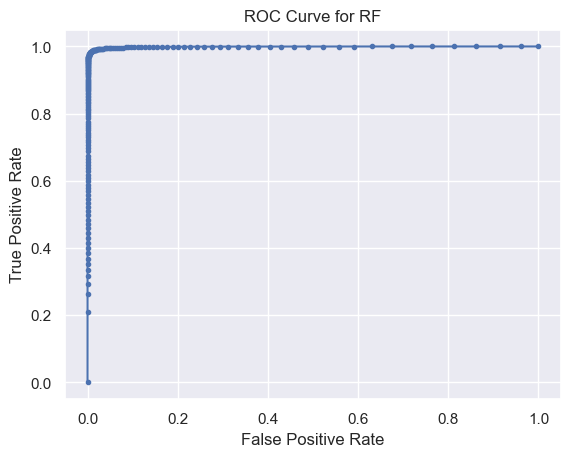

In [374]:
plt.figure()
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for RF')
plt.show()

## Gradient Boosting Fine-Tuning

In [375]:
# Manual adjustment of the hyperparameters
gb_model.set_params(n_estimators=200, learning_rate=0.05)
gb_model.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.05, n_estimators=200,
                           random_state=42)

In [376]:
# Check performance again
tuned_accuracy = gb_model.score(X_val, y_val)
print(f'Tuned Test Accuracy (n_estimators=200, learning_rate=0.05): {tuned_accuracy}')

Tuned Test Accuracy (n_estimators=200, learning_rate=0.05): 0.8303170734955322


In [377]:
# Manual adjustment of the hyperparameters
gb_model.set_params(n_estimators=200, learning_rate=0.05, max_depth=5)
gb_model.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.05, max_depth=5, n_estimators=200,
                           random_state=42)

In [378]:
# Check performance again
tuned_accuracy2 = gb_model.score(X_val, y_val)
print(f'Tuned Test Accuracy (n_estimators=200, learning_rate=0.05, max_depth=5): {tuned_accuracy2}')

Tuned Test Accuracy (n_estimators=200, learning_rate=0.05, max_depth=5): 0.8937983567043533


In [379]:
# Manual adjustment of the hyperparameters
gb_model.set_params(n_estimators=150, learning_rate=0.1, max_depth=3)
gb_model.fit(X_train, y_train)

GradientBoostingClassifier(n_estimators=150, random_state=42)

In [380]:
# Check performance again
tuned_accuracy3 = gb_model.score(X_val, y_val)
print(f'Tuned Test Accuracy (n_estimators=150, learning_rate=0.1, max_depth=3): {tuned_accuracy3}')

Tuned Test Accuracy (n_estimators=150, learning_rate=0.1, max_depth=3): 0.8616116016139986


In [381]:
# Manual adjustment of the hyperparameters
gb_model.set_params(n_estimators=250, learning_rate=0.05, max_depth=7)
gb_model.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.05, max_depth=7, n_estimators=250,
                           random_state=42)

In [382]:
# Check performance again
tuned_accuracy4 = gb_model.score(X_val, y_val)
print(f'Tuned Test Accuracy (n_estimators=250, learning_rate=0.05, max_depth=7): {tuned_accuracy4}')

Tuned Test Accuracy (n_estimators=250, learning_rate=0.05, max_depth=7): 0.9466528171733717


In [383]:
# Manual adjustment of the hyperparameters
gb_model.set_params(n_estimators=250, learning_rate=0.05, max_depth=9)
gb_model.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.05, max_depth=9, n_estimators=250,
                           random_state=42)

In [384]:
# Check performance again
tuned_accuracy5 = gb_model.score(X_val, y_val)
print(f'Tuned Test Accuracy (n_estimators=250, learning_rate=0.05, max_depth=9): {tuned_accuracy5}')

Tuned Test Accuracy (n_estimators=250, learning_rate=0.05, max_depth=9): 0.9787596713408706


### Final predicitons for GB

In [387]:
# Make predictions
gb_y_pred = gb_model.predict(X_test)

In [388]:
# Calculate metrics
accuracy = accuracy_score(y_test, gb_y_pred)
precision = precision_score(y_test, gb_y_pred, average='weighted')
recall = recall_score(y_test, gb_y_pred, average='weighted')
f1 = f1_score(y_test, gb_y_pred, average='weighted')

# Print metrics
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.9796518983127589
Precision: 0.9802613669545599
Recall: 0.9796518983127589
F1 Score: 0.9795073362035448


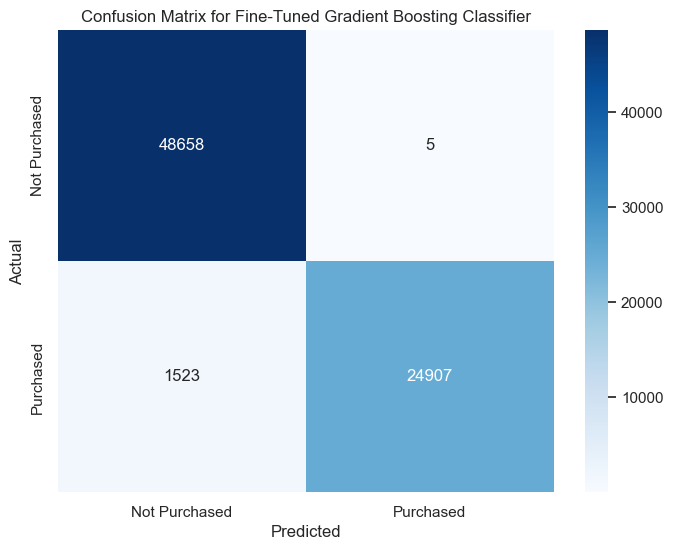

In [389]:
# Confusion matrix
cm = confusion_matrix(y_test, gb_y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Purchased', 'Purchased'], yticklabels=['Not Purchased', 'Purchased'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Fine-Tuned Gradient Boosting Classifier')
plt.show()

In [390]:
# Get the feature importances
importances = gb_model.feature_importances_

# Print the feature importances
for feature, importance in zip(X.columns, importances):
    print(f"Feature: {feature}, Importance: {importance}")

Feature: Quantity, Importance: 0.0005398513766302113
Feature: UnitPrice, Importance: 0.000638674773128871
Feature: Country, Importance: 0.03913238612802666
Feature: day_of_month, Importance: 0.013490997504219684
Feature: year, Importance: 0.00046169687358794714
Feature: total_price, Importance: 0.000569672145727677
Feature: total_quantity, Importance: 0.6195657642785156
Feature: unique_products, Importance: 0.27656516472580955
Feature: DaysBetweenPurchases, Importance: 0.0003459394523889629
Feature: lag_1, Importance: 0.0003386966121884884
Feature: lag_2, Importance: 0.000293593476395059
Feature: lag_3, Importance: 0.0005436053571014668
Feature: rolling_mean_3, Importance: 0.0016444950746148021
Feature: rolling_std_3, Importance: 0.0004699762826947567
Feature: sin_day_of_week, Importance: 0.00677783108418258
Feature: cos_day_of_week, Importance: 0.005273267442007258
Feature: sin_month, Importance: 0.008661290075918844
Feature: cos_month, Importance: 0.006723350461604509
Feature: sin_ho

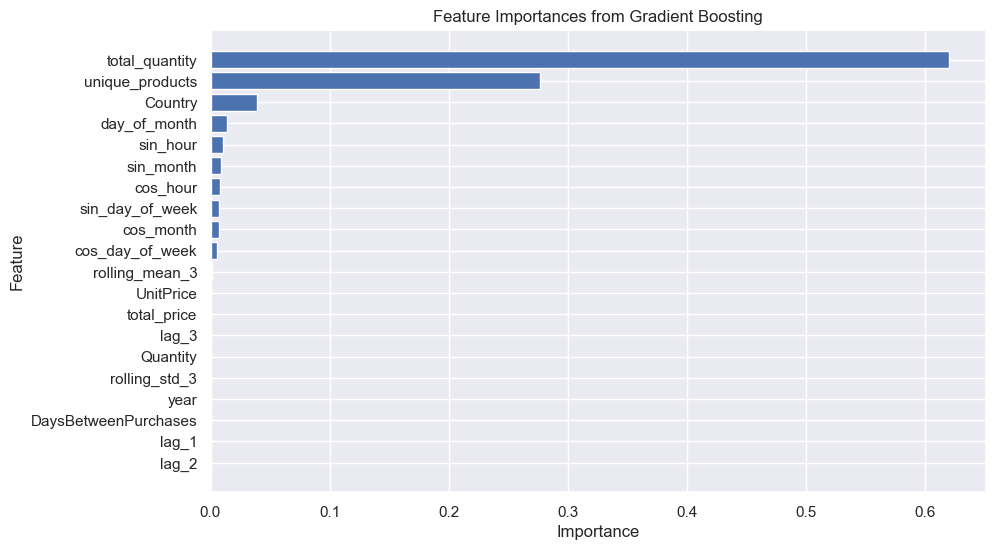

In [391]:
# Create a DataFrame for better visualization
importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
})

# Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances from Gradient Boosting')
plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.show()

In [392]:
# Predict probabilities for the positive class
gb_y_prob = gb_model.predict_proba(X_test)[:, 1]

In [393]:
# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, gb_y_prob)

# Compute AUC
gb_auc = roc_auc_score(y_test, gb_y_prob)

print(f"ROC AUC Score: {gb_auc}")

ROC AUC Score: 0.9985270172851874


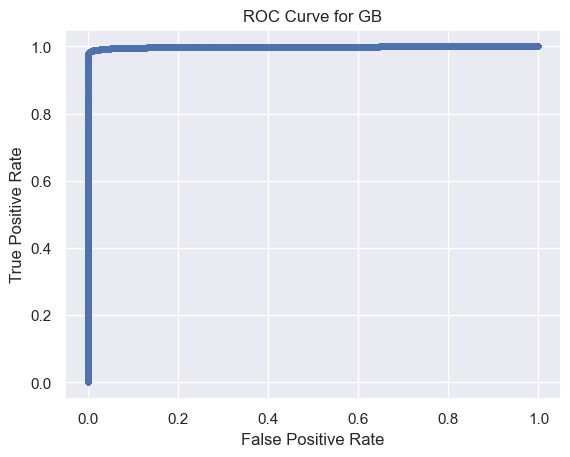

In [394]:
plt.figure()
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for GB')
plt.show()

## Decision Tree Fine-Tuning

In [395]:
# Default parameters
print(dtc_model.get_params())

{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'random_state': 42, 'splitter': 'best'}


In [396]:
# Manually set the hyperparameters
dtc_model.set_params(max_depth=7, min_samples_split=10, min_samples_leaf=5, criterion='gini')
dtc_model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=7, min_samples_leaf=5, min_samples_split=10,
                       random_state=42)

In [397]:
# Check performance again
tuned_accuracy = dtc_model.score(X_val, y_val)
print(f'Tuned Test Accuracy (max_depth=7, min_samples_split=10, min_samples_leaf=5): {tuned_accuracy}')

Tuned Test Accuracy (max_depth=7, min_samples_split=10, min_samples_leaf=5): 0.8122061976482495


In [398]:
# Manually set the hyperparameters
dtc_model.set_params(max_depth=20, min_samples_split=3, min_samples_leaf=2)
dtc_model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=20, min_samples_leaf=2, min_samples_split=3,
                       random_state=42)

In [399]:
# Check performance again
tuned_accuracy = dtc_model.score(X_val, y_val)
print(f'Tuned Test Accuracy (max_depth=20, min_samples_split=3, min_samples_leaf=2): {tuned_accuracy}')

Tuned Test Accuracy (max_depth=20, min_samples_split=3, min_samples_leaf=2): 0.9825549651765144


In [400]:
dtc1_model = DecisionTreeClassifier(random_state=42)
dtc1_model.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [401]:
tuned_accuracy_dtc1 = dtc1_model.score(X_val, y_val)
tuned_accuracy_dtc1

0.9980157937490844

## Final predicitons for DT

In [402]:
dtc_y_pred = dtc1_model.predict(X_test)

In [403]:
# Calculate performance metrics
accuracy = accuracy_score(y_test, dtc_y_pred)
precision = precision_score(y_test, dtc_y_pred, average='weighted')
recall = recall_score(y_test, dtc_y_pred, average='weighted')
f1 = f1_score(y_test, dtc_y_pred, average='weighted')

In [404]:
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.9977494573395657
Precision: 0.997749564264295
Recall: 0.9977494573395657
F1 Score: 0.9977495059559707


In [405]:
# Print classification report
print("Classification Report:")
print(classification_report(y_test, dtc_y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     48663
           1       1.00      1.00      1.00     26430

    accuracy                           1.00     75093
   macro avg       1.00      1.00      1.00     75093
weighted avg       1.00      1.00      1.00     75093



### Confusion Matrix

In [406]:
# Print confusion matrix
print("Confusion Matrix for DTC:")
print(confusion_matrix(y_test, dtc_y_pred))

Confusion Matrix for DTC:
[[48576    87]
 [   82 26348]]


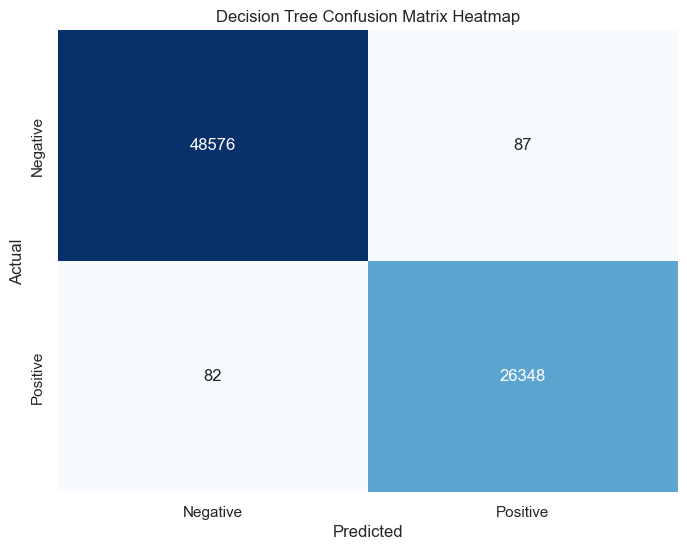

In [407]:
# Compute confusion matrix
cm = confusion_matrix(y_test, dtc_y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Decision Tree Confusion Matrix Heatmap')
plt.show()

In [408]:
# Extract individual metrics from the confusion matrix
TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

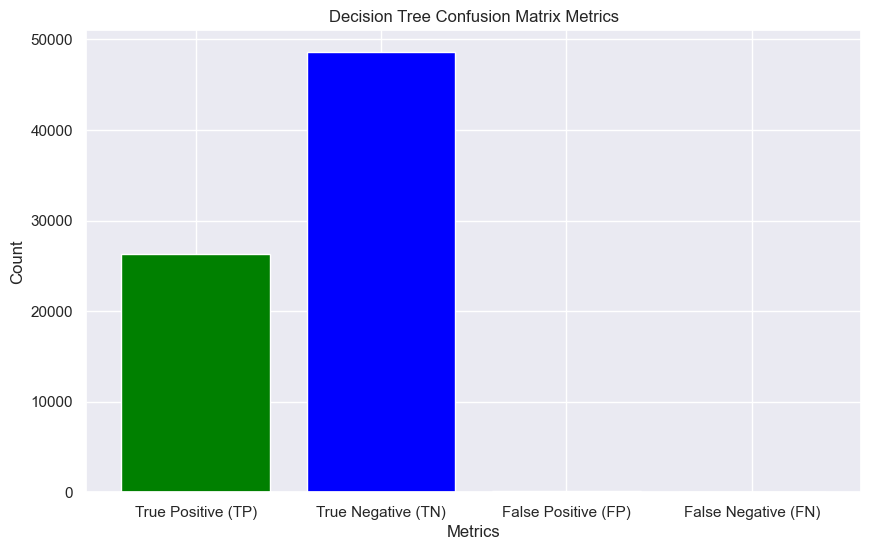

In [409]:
# Plot bar plot for metrics
metrics = {'True Positive (TP)': TP, 'True Negative (TN)': TN, 'False Positive (FP)': FP, 'False Negative (FN)': FN}
names = list(metrics.keys())
values = list(metrics.values())

plt.figure(figsize=(10, 6))
plt.bar(names, values, color=['green', 'blue', 'red', 'orange'])
plt.xlabel('Metrics')
plt.ylabel('Count')
plt.title('Decision Tree Confusion Matrix Metrics')
plt.show()

### Feature Importance Visualization

In [410]:
# Get the feature importances
importances = dtc1_model.feature_importances_

# Print the feature importances
for feature, importance in zip(X.columns, importances):
    print(f"Feature: {feature}, Importance: {importance}")

Feature: Quantity, Importance: 0.0011437714930461625
Feature: UnitPrice, Importance: 0.0003771666353799574
Feature: Country, Importance: 0.029347782605266357
Feature: day_of_month, Importance: 0.026753542450948554
Feature: year, Importance: 0.0003041104121260299
Feature: total_price, Importance: 0.0003647134108438274
Feature: total_quantity, Importance: 0.582756111842712
Feature: unique_products, Importance: 0.2823256702003871
Feature: DaysBetweenPurchases, Importance: 0.0002598281903124958
Feature: lag_1, Importance: 0.00019921424532583123
Feature: lag_2, Importance: 0.00039653603630064577
Feature: lag_3, Importance: 0.0003589951105603944
Feature: rolling_mean_3, Importance: 0.002204957163851323
Feature: rolling_std_3, Importance: 0.0007847395417430395
Feature: sin_day_of_week, Importance: 0.013644700690790984
Feature: cos_day_of_week, Importance: 0.008244621528751968
Feature: sin_month, Importance: 0.009327391267700458
Feature: cos_month, Importance: 0.011546422816515016
Feature: sin

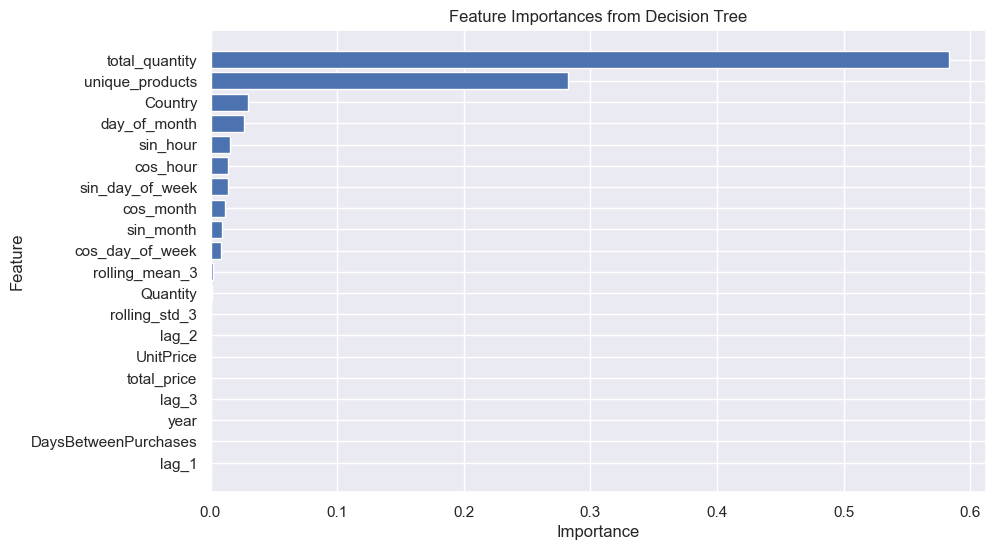

In [411]:
import matplotlib.pyplot as plt
import pandas as pd

# Create a DataFrame for better visualization
importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
})

# Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances from Decision Tree')
plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.show()

In [412]:
# Predict probabilities for the positive class
dtc_y_prob = dtc1_model.predict_proba(X_test)[:, 1]

In [413]:
# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, dtc_y_prob)

# Compute AUC
dtc_auc = roc_auc_score(y_test, dtc_y_prob)

print(f"ROC AUC Score: {dtc_auc}")

ROC AUC Score: 0.997554829535654


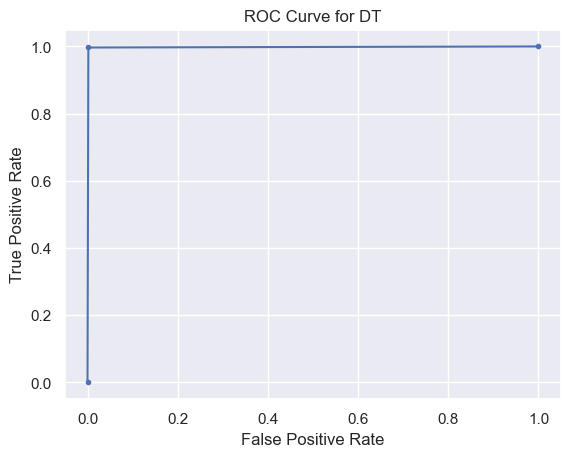

In [414]:
plt.figure()
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for DT')
plt.show()

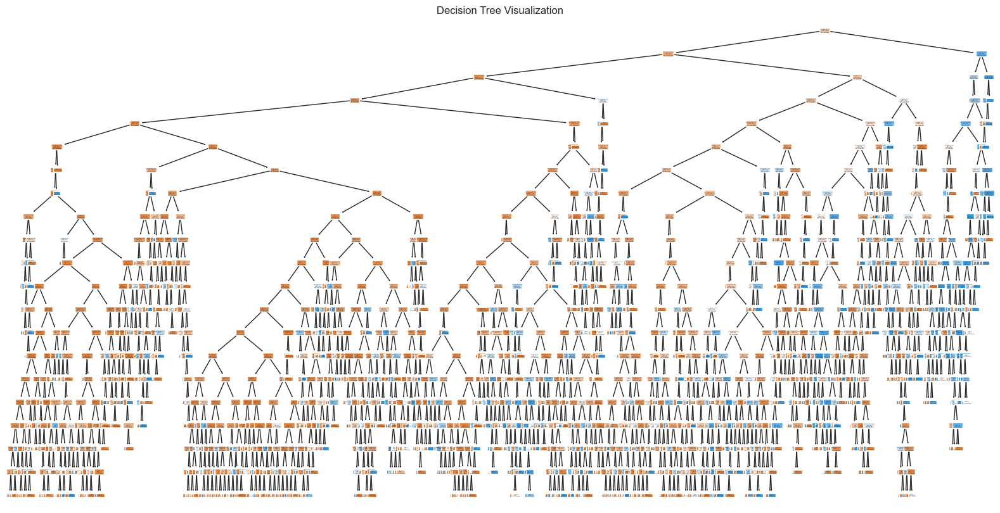

In [415]:
# Visualize the Decision Tree
from sklearn.tree import plot_tree

plt.figure(figsize=(20, 10))
plot_tree(dtc_model, filled=True, feature_names=X.columns, class_names=['No Purchase', 'Purchase'])
plt.title('Decision Tree Visualization')
plt.show()

## LIME for Decision Trees

In [416]:
import lime
import lime.lime_tabular

In [417]:
# Initialize the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,  # Pass your training data here
    feature_names=X_train.columns,  # Feature names from your dataset
    class_names=['Not Purchased', 'Purchased'],  # Class labels
    mode='classification'
)

In [418]:
# Choose an instance to explain (e.g., the first instance in the test set)
sample_idx = 0
sample = X_test.iloc[sample_idx].values.reshape(1, -1)

In [419]:
# Define a prediction function
def predict_fn(x):
    return dtc_model.predict_proba(x)

In [420]:
# Get the LIME explanation for the selected instance
exp = explainer.explain_instance(
    data_row=sample.flatten(), 
    predict_fn=predict_fn, 
    num_features=10  # Number of features to display in the explanation
)

# Display the explanation
exp.show_in_notebook(show_table=True)

C:\ProgramData\anaconda3\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


## Logistic Regression Fine-Tuning

In [421]:
# Manual tuning: Trying different values for 'C' and 'penalty'
tuned_parameters = [
    {'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs'},
    {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'},
    {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'},
    {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'},
    {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'},
    {'C': 1.0, 'penalty': 'l1', 'solver': 'liblinear'},
]

In [422]:
best_accuracy = 0
best_params = None

In [423]:
for params in tuned_parameters:
    model = LogisticRegression(**params, max_iter=1000)
    model.fit(X_train, y_train)
    y_val_pred = model.predict(X_val)
    accuracy = accuracy_score(y_val, y_val_pred)
    print(f"Parameters: {params}, Validation Accuracy: {accuracy}")
    
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_params = params

print(f"Best Parameters: {best_params}, Best Validation Accuracy: {best_accuracy}")

Parameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs'}, Validation Accuracy: 0.7329045317140079
Parameters: {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}, Validation Accuracy: 0.7327180962273447
Parameters: {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'}, Validation Accuracy: 0.7327580466887725
Parameters: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}, Validation Accuracy: 0.7325849280225853
Parameters: {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}, Validation Accuracy: 0.7326381953044891
Parameters: {'C': 1.0, 'penalty': 'l1', 'solver': 'liblinear'}, Validation Accuracy: 0.7327580466887725
Best Parameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs'}, Best Validation Accuracy: 0.7329045317140079


In [424]:
# Initialize the Logistic Regression model with the best parameters
lr_model = LogisticRegression(
    C=0.01,
    penalty='l2',
    solver='lbfgs',
    random_state=42,
    max_iter=1000
)

In [425]:
# Fit the model to the training data
lr_model.fit(X_train, y_train)

LogisticRegression(C=0.01, max_iter=1000, random_state=42)

In [426]:
# Make predictions on the test data
lr_y_pred = lr_model.predict(X_test)

In [427]:
# Calculate performance metrics
accuracy = accuracy_score(y_test, lr_y_pred)
precision = precision_score(y_test, lr_y_pred, average='weighted')
recall = recall_score(y_test, lr_y_pred, average='weighted')
f1 = f1_score(y_test, lr_y_pred, average='weighted')

In [428]:
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.732651512124965
Precision: 0.7382807462869752
Recall: 0.732651512124965
F1 Score: 0.700931896712146


In [429]:
# Print classification report
print("Classification Report:")
print(classification_report(y_test, lr_y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.94      0.82     48663
           1       0.76      0.35      0.48     26430

    accuracy                           0.73     75093
   macro avg       0.74      0.65      0.65     75093
weighted avg       0.74      0.73      0.70     75093



### Confusion Matrix

In [430]:
# Print confusion matrix
print("Confusion Matrix for LR:")
print(confusion_matrix(y_test, lr_y_pred))

Confusion Matrix for LR:
[[45676  2987]
 [17089  9341]]


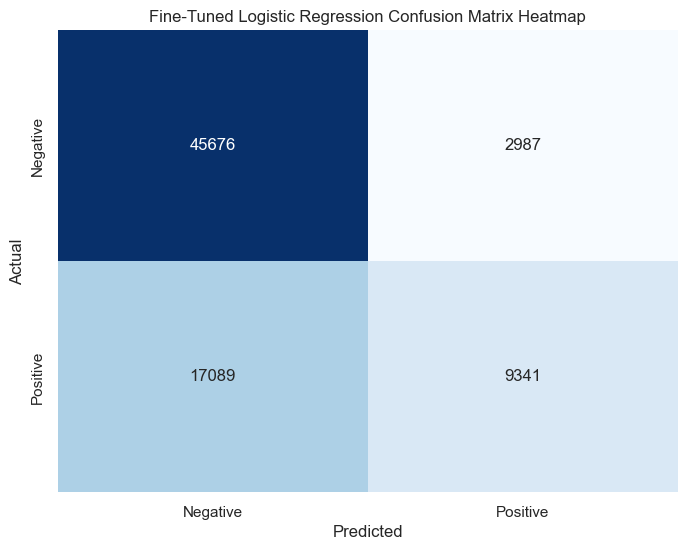

In [431]:
# Compute confusion matrix
cm = confusion_matrix(y_test, lr_y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Fine-Tuned Logistic Regression Confusion Matrix Heatmap')
plt.show()

In [432]:
# Extract individual metrics from the confusion matrix
TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

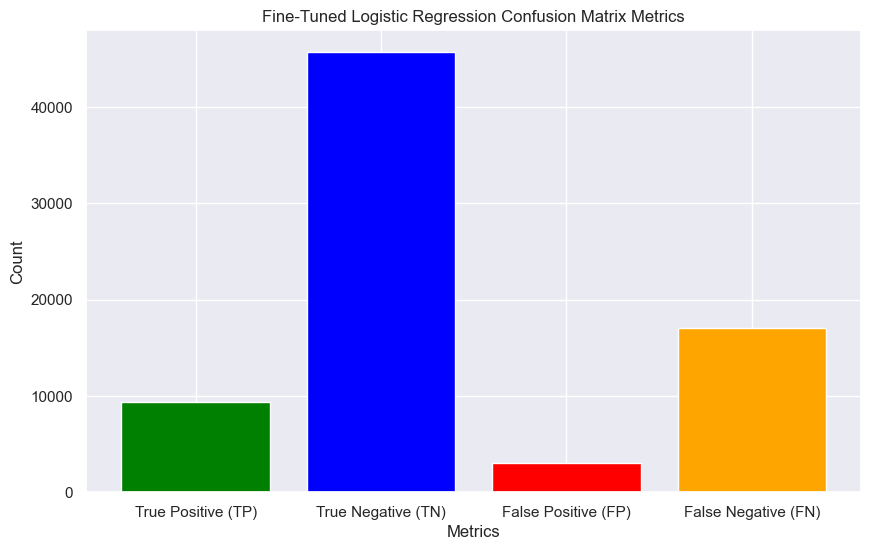

In [433]:
# Plot bar plot for metrics
metrics = {'True Positive (TP)': TP, 'True Negative (TN)': TN, 'False Positive (FP)': FP, 'False Negative (FN)': FN}
names = list(metrics.keys())
values = list(metrics.values())

plt.figure(figsize=(10, 6))
plt.bar(names, values, color=['green', 'blue', 'red', 'orange'])
plt.xlabel('Metrics')
plt.ylabel('Count')
plt.title('Fine-Tuned Logistic Regression Confusion Matrix Metrics')
plt.show()

In [434]:
# Predict probabilities for the positive class
lr_y_prob = lr_model.predict_proba(X_test)[:, 1]

In [435]:
# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, lr_y_prob)

# Compute AUC
lr_auc = roc_auc_score(y_test, lr_y_prob)

print(f"ROC AUC Score: {lr_auc}")

ROC AUC Score: 0.7537796089296886


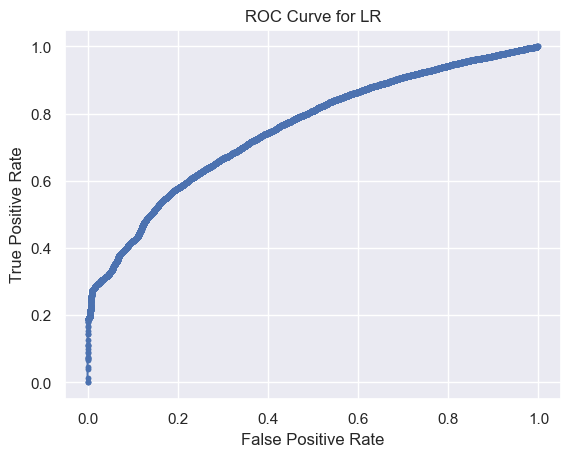

In [436]:
plt.figure()
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for LR')
plt.show()

## Models' Performance Comparison

As the LSTM model and machine learning models were trained and evaluated on different datasets (beacuse of the time sequences and reduced dimensionality for ML models), we cannot directly compare their ROC curves or AUC scores on the same plot.

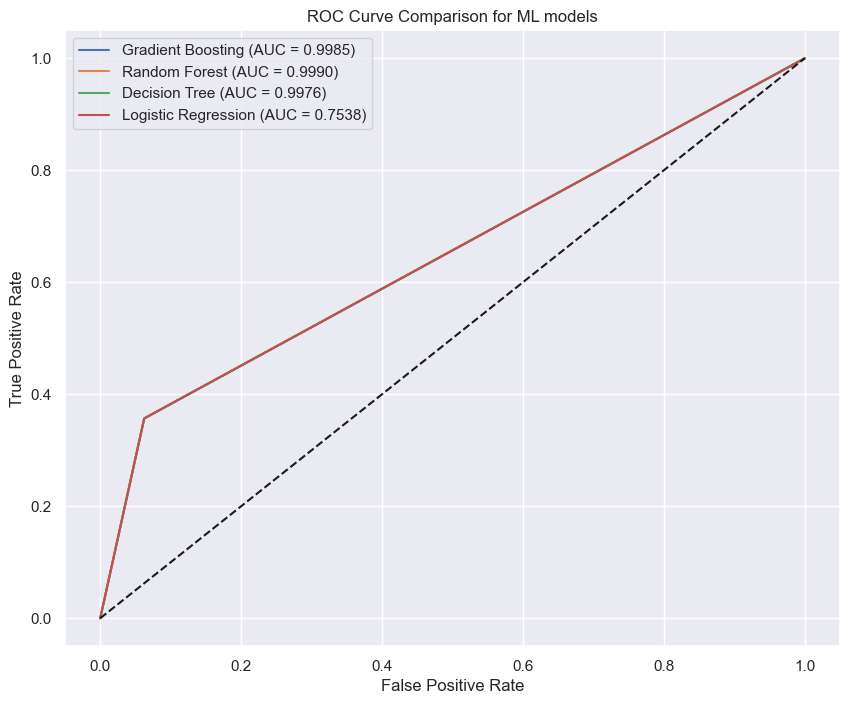

In [437]:
y_probs = [gb_y_prob, rf_y_prob, dtc_y_prob, lr_y_prob]
model_names = ['Gradient Boosting', 'Random Forest', 'Decision Tree', 'Logistic Regression']

plt.figure(figsize=(10, 8))
for i, (model, prob) in enumerate(zip(model_names, y_probs)):
    fpr, tpr, _ = roc_curve(y_test, y_pred)
    plt.plot(fpr, tpr, label=f'{model} (AUC = {roc_auc_score(y_test, prob):.4f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for ML models')
plt.legend(loc='best')
plt.show()

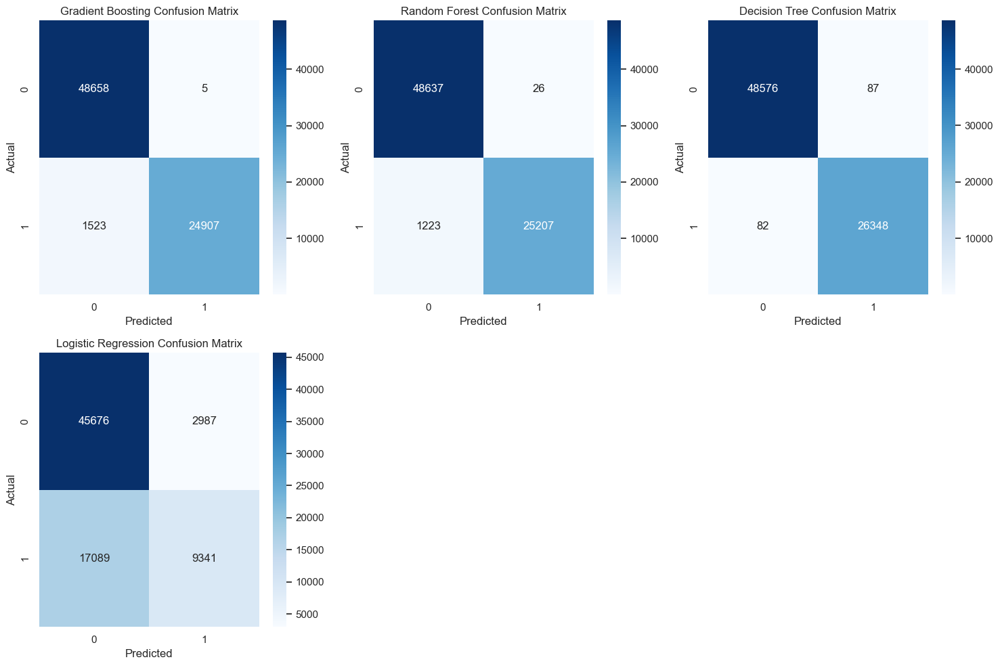

In [438]:
models = ['Gradient Boosting', 'Random Forest', 'Decision Tree', 'Logistic Regression']
preds = [gb_y_pred, rf_y_pred, dtc_y_pred, lr_y_pred]

plt.figure(figsize=(15, 10))
for i, (model, pred) in enumerate(zip(models, preds)):
    plt.subplot(2, 3, i+1)
    cm = confusion_matrix(y_test, pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'{model} Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

plt.tight_layout()
plt.show()

In [439]:
accuracies = {
    'Gradient Boosting': accuracy_score(y_test, gb_y_pred),
    'Random Forest': accuracy_score(y_test, rf_y_pred),
    'Decision Tree': accuracy_score(y_test, dtc_y_pred),
    'Logistic Regression': accuracy_score(y_test, lr_y_pred)
}

for model, acc in accuracies.items():
    print(f'{model} Accuracy: {acc:.4f}')

Gradient Boosting Accuracy: 0.9797
Random Forest Accuracy: 0.9834
Decision Tree Accuracy: 0.9977
Logistic Regression Accuracy: 0.7327


In [440]:
for model, pred in zip(models, preds):
    precision = precision_score(y_test, pred)
    recall = recall_score(y_test, pred)
    f1 = f1_score(y_test, pred)
    print(f'{model} - Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}')

Gradient Boosting - Precision: 0.9998, Recall: 0.9424, F1 Score: 0.9702
Random Forest - Precision: 0.9990, Recall: 0.9537, F1 Score: 0.9758
Decision Tree - Precision: 0.9967, Recall: 0.9969, F1 Score: 0.9968
Logistic Regression - Precision: 0.7577, Recall: 0.3534, F1 Score: 0.4820


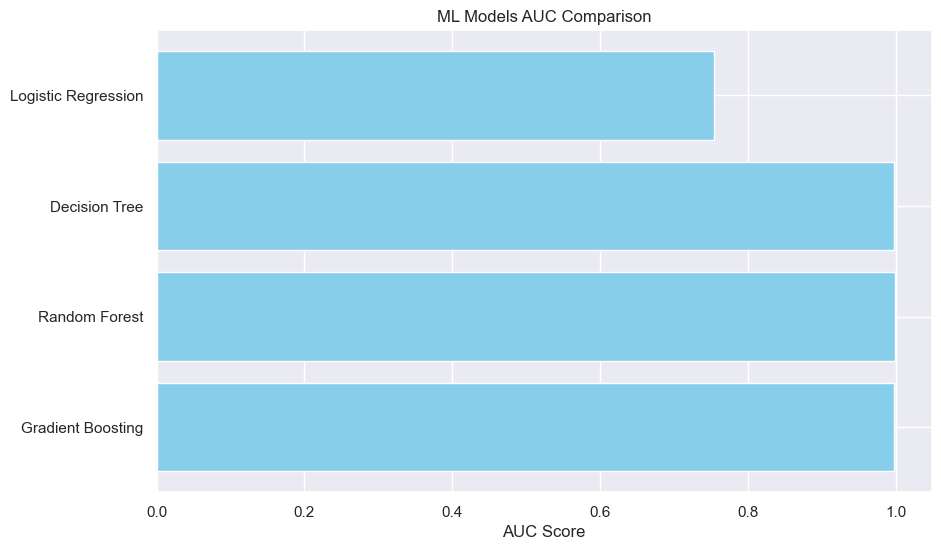

In [441]:
auc_scores = [roc_auc_score(y_test, prob) for prob in y_probs]

plt.figure(figsize=(10, 6))
plt.barh(model_names, auc_scores, color='skyblue')
plt.xlabel('AUC Score')
plt.title('ML Models AUC Comparison')
plt.show()